In [1]:
# Loading libraries
%matplotlib inline
import os
import os.path
from netCDF4 import Dataset
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import fnmatch
from cycler import cycler
import pandas as pd
from pandas import read_csv, to_datetime, DataFrame
import datetime
import time
import matplotlib.dates as mdates

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from mpl_toolkits.basemap import Basemap # Basemap pour les cartes

In [2]:
# LOADING GRID FILE AND VARIABLES
!pwd
grid_file = '../DATA/grille.nc' 
print 'file exist:', os.path.isfile(grid_file)

f = Dataset(grid_file) # open netcdf
# extracting variables
lon_t = f.variables['longitude_t'][:] # extracting lon data
lat_t = f.variables['latitude_t'][:] # extracting lat data
depth_t = f.variables['depth_t'][:]
bathy = f.variables['h_w'][:]
print 'Bathy :', np.shape(bathy), 'max :', np.max(bathy), 'min :', np.min(bathy)

f.close()

new_bath = np.ma.masked_where(bathy<200, bathy)
region_list = ['NWE', 'SWE', 'ION', 'LEV'] #

/home/dosa/MON_ENV_PYTHON/ARTICLE_IAV
file exist: True
Bathy : (160, 394) max : 5054.49 min : 20.5226


In [3]:
#var_bio = ['bactc', 'zoo', 'phyto', 'poc', 'doc', 'nitrate', 'phosphate', 'silice', 'chl']
var_bio = ['nit_int150', 'nit_int200', 'pho_int150', 'pho_int200']
var_phy = ['ssr', 'sst', 'ti15', 'ti20', 'eke', 'sss', 'mld', 'str2', 'mld_', 'strf'] 

correl_1 = './LAST_OUTPUT_FEV2019/CORREL_2_PCA_2011.nc' 
print 'file exist:', os.path.isfile(correl_1)

f = Dataset(correl_1) # open netcdf
for phyvar in var_phy:
    for biovar in var_bio:
        vars()[biovar+'_'+phyvar] = f.variables[biovar+'_'+phyvar][0,:,:]# extracting data

f.close()

#np.shape(correl_68) # (160, 394) seems ok!

# STOP REMOVING NON SIGNIF CORRELATIONS
### We don't use that anymore ###
 
# Removing non significant values
for phyvar in var_phy:
    for biovar in var_bio:
        vars()[biovar+'_'+phyvar][(vars()[biovar+'_'+phyvar]>-0.33)&(vars()[biovar+'_'+phyvar]<0.33)] = np.nan
        
print 'END of CELL'

file exist: True
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in less


In [4]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:33: RuntimeWarning: invalid value encountered in less


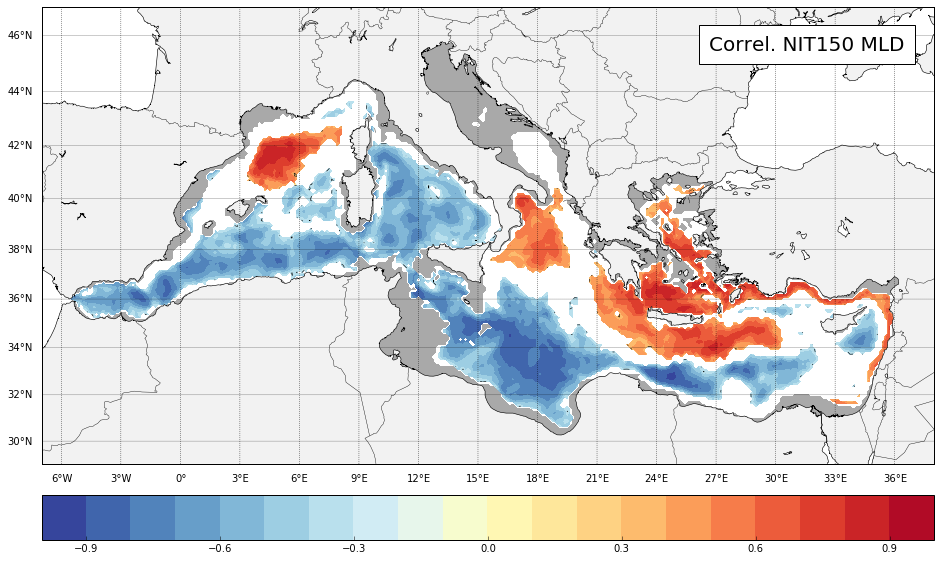

In [7]:
# TEST DISPOSITION GPP #
var_bio_test = ['nit_int150'] # new vers
# On remet ici dans l'ordre des figures qu'on souhaite :
#var_phy_test = ['ssr', 'sst', 'eke', 'sss', 'mld', 'str2', 'mld_', 'strf'] # Test Alex
#var_phy_test = ['ti15', 'eke', 'mld', 'str2', 'mld_', 'strf'] 
var_phy_test = ['mld'] 

c = 1 

for biovar in var_bio_test:
    # figure
    plt.figure(figsize=(16,16));
    #fig = plt.figure(figsize=(16,16));
    
    for phyvar in var_phy_test:
        # subplot
        #plt.subplot(3, 2, c)
        plt.subplot(1, 1, c)
        
        x1,x2,y1,y2 = -7, 38, 29, 47;
        m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
        ax = fig.add_axes([0.1,0.1,0.8,0.8]);
        m.drawcountries(linewidth=0.4);
        m.drawcoastlines(linewidth=0.6);
        m.fillcontinents(color='0.95',lake_color='white');
        parallels = np.arange(0.,81,2);
        m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
        #meridians = np.arange(-6.,351.,2); # 1.5
        meridians = np.arange(-6.,351.,3); # 1.5
        m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

        # Creating corresponding variable names
        data_to_plot = np.ma.masked_where(bathy<200,vars()[biovar+'_'+phyvar])
        data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

        # doing a map # Données
        xd,yd = m(lon_t,lat_t);
        levels = np.arange(-1,1.1,0.1);
        levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
        levels_bathy = [200] ;
        m.contourf(xd,yd,test,cmap=plt.cm.Greys);
        CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
        cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);# binary / jet ,levels=levels
        CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
        #plt.colorbar(cs, orientation='horizontal', pad = 0.03)
        plt.colorbar(cs, orientation='horizontal', pad = 0.035)
        x_text,y_text = m(36.5,46)
        if phyvar == 'mld_':
            phyvar_t = 'mld_w'
        elif phyvar == 'ti15':
            phyvar_t = 'T150'
        elif phyvar == 'ti20':
            phyvar_t = 'T200'
        else:
            phyvar_t = phyvar
                    
        if biovar == 'nit_int150':
            biovar_t = 'nit150'
        elif biovar == 'nit_int200':
            biovar_t = 'nit200'
        elif biovar == 'pho_int200':
            biovar_t = 'pho200'
        elif biovar == 'pho_int150':
            biovar_t = 'pho150'
        else:
            biovar_t = biovar
            
        this_txt = str(biovar_t+' '+phyvar_t)
        upp_txt = this_txt.upper()
        upp_txt2 = 'Correl. '+upp_txt
        # fontweight='bold',
        plt.text(x_text,y_text, upp_txt2,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'facecolor':'red', 'alpha':0.5, 
        #plt.savefig('/home/dosa/THESE/CR_reunions/NOV_FIGS/NEW_CORR_MAPS2/'+biovar_t+'_'+phyvar_t+'.png',bbox_inches='tight',format='png')
        #plt.subplots_adjust(hspace=0.02, wspace=0.12) 
        # Example # top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.02, wspace=0.2
        c += 1


#plt.savefig('/home/dosa/THESE/CR_reunions/FEV2019_FIGS/TEST_CORR_MLDNIT.png',bbox_inches='tight',format='png')

print 'END of CELL'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:71: RuntimeWarning: invalid value encountered in less


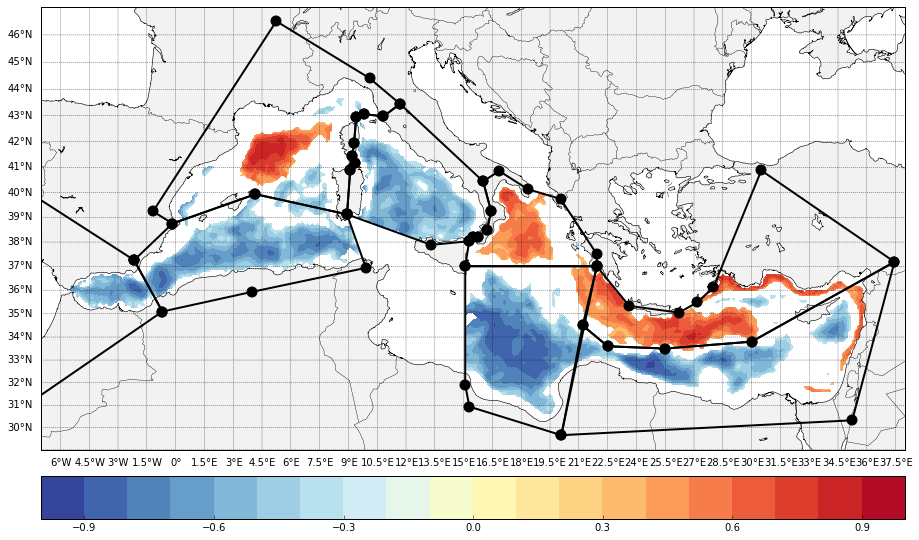

In [8]:
# 25/06 Map OLD regions (still in some plots)
region_list_old_young = ['GOL', 'ALG', 'ALB', 'TYR', 'N_ION', 'S_ION', 'N_LEV', 'S_LEV'] # , 'S_LEV'

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list_old_young:
    # Defining the coordinates
            if region == 'GOL':
                y = [43.44829732432269, 42.97458858683228, 43.0604306783546, 42.96837802751135, 41.96306909843022,
                     41.43113753799402, 41.16267859938984, 40.91067143551019, 39.12845260900497, 39.938244, 38.756497,
                     39.247095, 46.4938123, 44.4124705]
                x = [11.68790444824612, 10.82516607380484, 9.82460045736472, 9.409248985801327, 9.294900137395576,
                     9.198952404436941, 9.339783959671131, 9.097279040223231, 8.925644550468935, 4.159323, -0.162487,
                     -1.17747, 5.2446879, 10.1001797]
                curr_col = 'k'
            elif region == 'ALG':
                y = [35.093681, 37.252960, 38.756497, 39.938244, 39.1284526, 36.93272338, 35.930524]
                x = [-0.690137, -2.159892, -0.162487, 4.159323, 8.92564455, 9.90934876, 3.994854]
                curr_col = 'k'
            elif region == 'ALB':
                y = [37.252960,35.093681,30.193979,31.801339,36.828725,41.842705,37.252960]
                x = [-2.159892,-0.690137,-9.148740,-14.426967,-14.798432,-11.408431,-2.159892]
                curr_col = 'k'
            elif region == 'TYR':
                y = [39.12845260900497,37.88508389278273,38.03532811253486,38.19020427258793,38.206530069008,38.49522011750975,
                     39.25645461354518,40.44930918149475,43.44829732432269,42.97458858683228,43.0604306783546,42.96837802751135,
                     41.96306909843022,41.43113753799402,41.16267859938984,40.91067143551019,39.12845260900497]
                x = [8.925644550468935,13.3111744311976,15.29159159227882,15.48719160249115,15.74199259491107,16.21860737848962,
                     16.43223864162354,16.01437911440215,11.68790444824612,10.82516607380484,9.824600457364721,9.409248985801327,
                     9.294900137395576,9.198952404436941,9.339783959671131,9.097279040223231,8.925644550468935]
                curr_col = 'k'
            elif region == 'N_ION':
                y = [37.001816,38.03532811253486,38.19020427258793,38.206530069008,38.49522011750975,39.25645461354518,
                     40.44930918149475,40.857014,40.138887,39.746050,37.503355,37]
                x = [15.084801,15.29159159227882,15.48719160249115,15.74199259491107,16.21860737848962,16.43223864162354,
                     16.01437911440215,16.854632,18.343058,20.052826,21.936077,21.936077]
                curr_col = 'k'
            elif region == 'S_ION':
                y = [37,29.658354,30.941890,31.924008, #37.503355
                     37.001816]
                x = [21.936077,20.090485,15.297679,15.081913,15.084801]
                curr_col = 'k'
            elif region == 'N_LEV':
                y = [37,35.335479,35.045582,35.478996,36.113327,40.879240,37.180585, 33.8, 33.5, 33.6, 34.5]
                x = [21.936077,23.620988,26.217209,27.159167,28.006273,30.504893,37.441401, 30, 25.5, 22.5, 21.2]
                curr_col = 'k'
            elif region == 'S_LEV':
                y = [34.5,33.6,33.5,33.8,37.180585,30.329515,29.658354]
                x = [21.2,22.5,25.5,30,37.441401,35.238352,20.090485]
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone

            # doing a map
            data_to_plot = np.ma.masked_where(bathy<200,vars()[biovar+'_'+phyvar])
            data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)
            data_to_plot = np.ma.masked_array(data_to_plot,indices_re==False)
            vars()['correl_'+region] = data_to_plot

            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor=curr_col,linewidth=2.); # edgecolor='k',
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c=curr_col, marker='o',zorder=6); # ajoute les points c='k',
            
            # NEW
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:45: RuntimeWarning: invalid value encountered in less


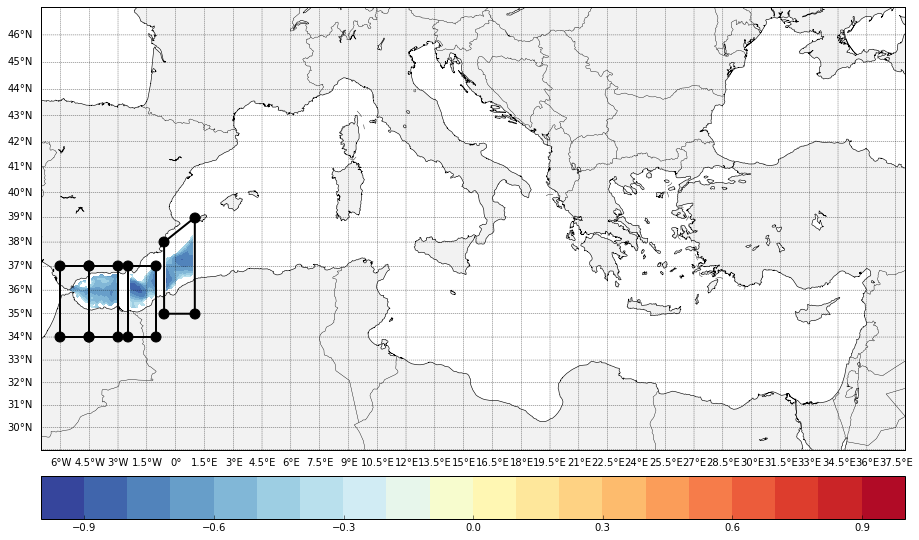

In [9]:
# 27/02 On découpe des tranches dans ALB (pour checker si impact de Gibraltar)
region_list_old_young = ['ALB_W', 'ALB_C', 'ALB_E', 'ALG_W'] #

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list_old_young:
    # Defining the coordinates
            if region == 'ALB_W':
                y = [37,37,34,34]
                x = [-6,-4.5,-4.5,-6]
                curr_col = 'k'
            elif region == 'ALB_C':
                y = [37,34,34,37]
                x = [-4.5,-4.5,-3,-3]
                curr_col = 'k'
            elif region == 'ALB_E':
                y = [34,37,37,34]
                x = [-2.5,-2.5,-1,-1]
                curr_col = 'k'
            elif region == 'ALG_W':
                y = [35, 38, 39, 35]
                x = [-0.6, -0.6, 1, 1]
                curr_col = 'k'
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone

            # doing a map
            data_to_plot = np.ma.masked_where(bathy<200,vars()[biovar+'_'+phyvar])
            data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)
            data_to_plot = np.ma.masked_array(data_to_plot,indices_re==False)
            vars()['correl_'+region] = data_to_plot

            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor=curr_col,linewidth=2.); # edgecolor='k',
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c=curr_col, marker='o',zorder=6); # ajoute les points c='k',
            
            # NEW
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [10]:
correl_GOL = np.ma.masked_array(correl_GOL, correl_GOL < 0)

correl_N_ION = np.ma.masked_array(correl_N_ION, correl_N_ION < 0)
correl_S_ION = np.ma.masked_array(correl_S_ION, correl_S_ION > 0)

correl_N_LEV = np.ma.masked_array(correl_N_LEV, correl_N_LEV < 0)
correl_S_LEV = np.ma.masked_array(correl_S_LEV, correl_S_LEV > 0)

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in less
  if __name__ == '__main__':
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less
  app.launch_new_instance()
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in less
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in greater


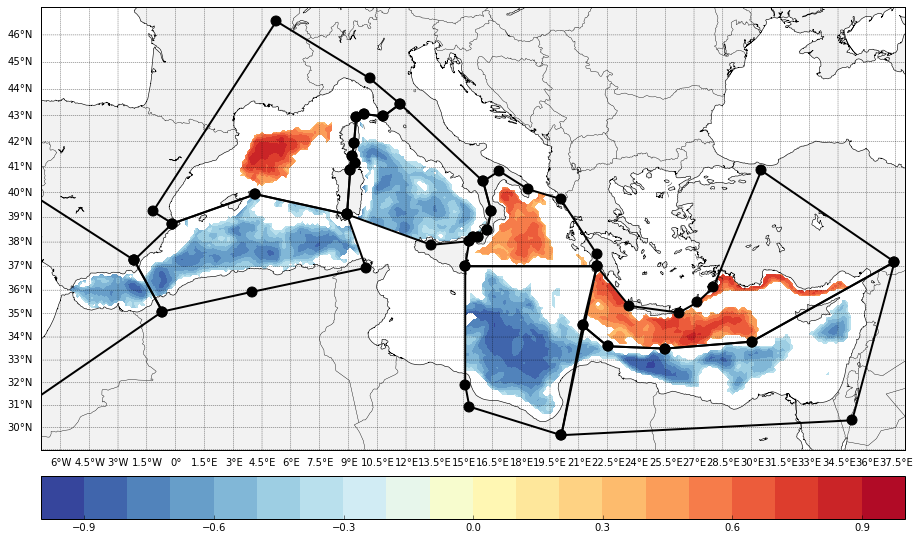

In [11]:
# 25/06 Map OLD regions (still in some plots)
region_list_old_young = ['GOL', 'ALG', 'ALB', 'TYR', 'N_ION', 'S_ION', 'N_LEV', 'S_LEV'] # , 'S_LEV'

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list_old_young:
            if region == 'GOL':
                y = [43.44829732432269, 42.97458858683228, 43.0604306783546, 42.96837802751135, 41.96306909843022,
                     41.43113753799402, 41.16267859938984, 40.91067143551019, 39.12845260900497, 39.938244, 38.756497,
                     39.247095, 46.4938123, 44.4124705]
                x = [11.68790444824612, 10.82516607380484, 9.82460045736472, 9.409248985801327, 9.294900137395576,
                     9.198952404436941, 9.339783959671131, 9.097279040223231, 8.925644550468935, 4.159323, -0.162487,
                     -1.17747, 5.2446879, 10.1001797]
                curr_col = 'k'
            elif region == 'ALG':
                y = [35.093681, 37.252960, 38.756497, 39.938244, 39.1284526, 36.93272338, 35.930524]
                x = [-0.690137, -2.159892, -0.162487, 4.159323, 8.92564455, 9.90934876, 3.994854]
                curr_col = 'k'
            elif region == 'ALB':
                y = [37.252960,35.093681,30.193979,31.801339,36.828725,41.842705,37.252960]
                x = [-2.159892,-0.690137,-9.148740,-14.426967,-14.798432,-11.408431,-2.159892]
                curr_col = 'k'
            elif region == 'TYR':
                y = [39.12845260900497,37.88508389278273,38.03532811253486,38.19020427258793,38.206530069008,38.49522011750975,
                     39.25645461354518,40.44930918149475,43.44829732432269,42.97458858683228,43.0604306783546,42.96837802751135,
                     41.96306909843022,41.43113753799402,41.16267859938984,40.91067143551019,39.12845260900497]
                x = [8.925644550468935,13.3111744311976,15.29159159227882,15.48719160249115,15.74199259491107,16.21860737848962,
                     16.43223864162354,16.01437911440215,11.68790444824612,10.82516607380484,9.824600457364721,9.409248985801327,
                     9.294900137395576,9.198952404436941,9.339783959671131,9.097279040223231,8.925644550468935]
                curr_col = 'k'
            elif region == 'N_ION':
                y = [37.001816,38.03532811253486,38.19020427258793,38.206530069008,38.49522011750975,39.25645461354518,
                     40.44930918149475,40.857014,40.138887,39.746050,37.503355,37]
                x = [15.084801,15.29159159227882,15.48719160249115,15.74199259491107,16.21860737848962,16.43223864162354,
                     16.01437911440215,16.854632,18.343058,20.052826,21.936077,21.936077]
                curr_col = 'k'
            elif region == 'S_ION':
                y = [37,29.658354,30.941890,31.924008, #37.503355
                     37.001816]
                x = [21.936077,20.090485,15.297679,15.081913,15.084801]
                curr_col = 'k'
            elif region == 'N_LEV':
                y = [37,35.335479,35.045582,35.478996,36.113327,40.879240,37.180585, 33.8, 33.5, 33.6, 34.5]
                x = [21.936077,23.620988,26.217209,27.159167,28.006273,30.504893,37.441401, 30, 25.5, 22.5, 21.2]
                curr_col = 'k'
            elif region == 'S_LEV':
                y = [34.5,33.6,33.5,33.8,37.180585,30.329515,29.658354]
                x = [21.2,22.5,25.5,30,37.441401,35.238352,20.090485]
                
            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor=curr_col,linewidth=2.); # edgecolor='k',
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c=curr_col, marker='o',zorder=6); # ajoute les points c='k',
                
            data_to_plot = vars()['correl_'+region]

            # NEW
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [ ]:
### JE SAVE LA PARTIE MASK CI-DESSOUS MAIS JE RELANCE PAS ###

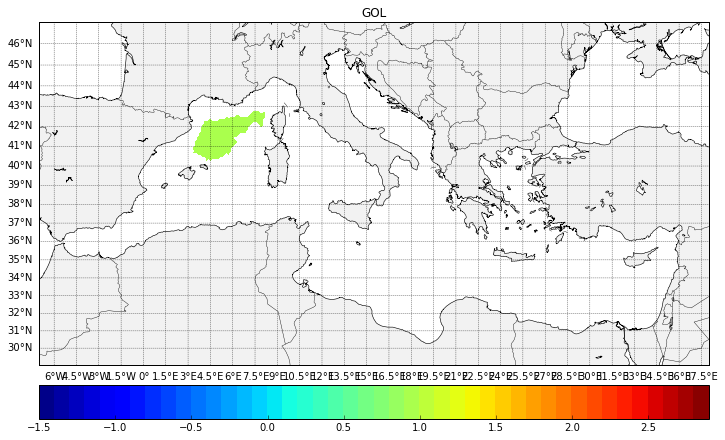

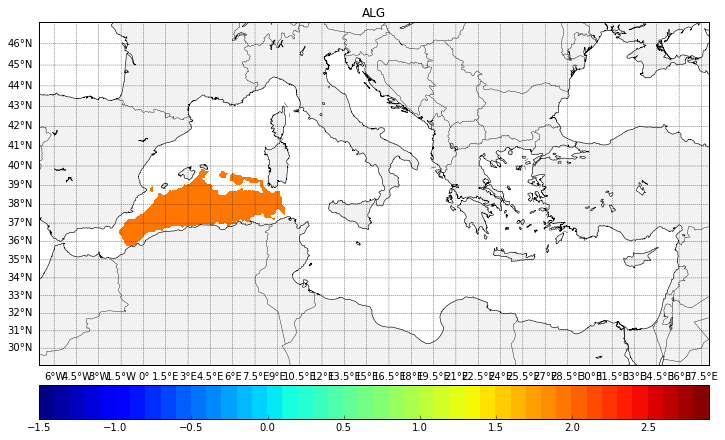

In [25]:
### Creating a mask to compute MLD in Fortran
region_list = ['GOL', 'ALG'] #
x1,x2,y1,y2 = -7, 38, 29, 47;

for region in region_list:
    # Defining the coordinates
            if region == 'GOL':
                y = [43.44829732432269, 42.97458858683228, 43.0604306783546, 42.96837802751135, 41.96306909843022,
                     41.43113753799402, 41.16267859938984, 40.91067143551019, 39.12845260900497, 39.938244, 38.756497,
                     39.247095, 46.4938123, 44.4124705]
                x = [11.68790444824612, 10.82516607380484, 9.82460045736472, 9.409248985801327, 9.294900137395576,
                     9.198952404436941, 9.339783959671131, 9.097279040223231, 8.925644550468935, 4.159323, -0.162487,
                     -1.17747, 5.2446879, 10.1001797]
                mask_value = 1
            elif region == 'ALG':
                y = [35.093681, 37.252960, 38.756497, 39.938244, 39.1284526, 36.93272338, 35.930524]
                x = [-0.690137, -2.159892, -0.162487, 4.159323, 8.92564455, 9.90934876, 3.994854]
                mask_value = 2
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
    
            # Creating corresponding variable names
            vars()['mask_'+region] = np.zeros([160,394])
            vars()['mask_'+region][:] = mask_value
            vars()['mask_'+region] = np.ma.masked_array(vars()['mask_'+region],indices_re==False)
            vars()['mask_'+region] = np.ma.masked_array(vars()['mask_'+region], new_bath<200)

            vars()['mask_'+region] = np.ma.masked_where(np.isnan(vars()['correl_'+region]), vars()['mask_'+region])

            
            # doing a map
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
            plt.figure(figsize=(12,12))
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,1);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,1.5);
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
            
            data_to_plot = vars()['mask_'+region]
            # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1.5,3,0.1);
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet
            plt.colorbar(cs, orientation='horizontal', pad = 0.03)
            eval('plt.title(\''+region+'\')')

In [26]:
test_mask = np.ma.vstack(mask_GOL, mask_ALG) #, mask_ION, mask_LEV)
np.shape(test_mask) #(4, 160, 394)

mask_sum = np.ma.sum(test_mask,axis=0)
np.shape(mask_sum)

(160, 394)

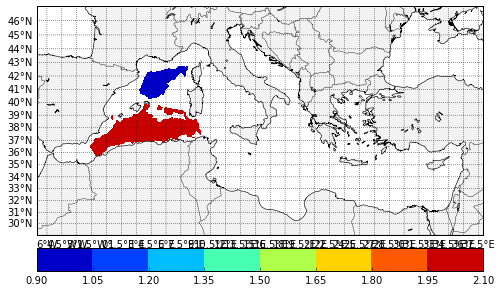

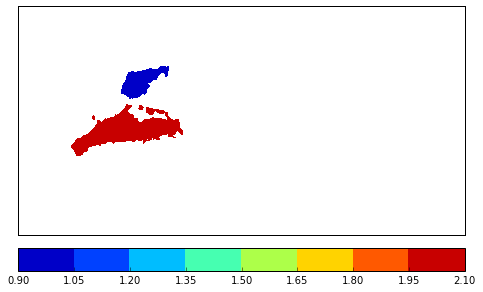

In [27]:
# doing a map
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
# figure
plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
            
# Données
xd,yd = m(lon_t,lat_t);
#levels = np.arange(-1,5,0.5);
cs = m.contourf(xd,yd,mask_sum,cmap=plt.cm.jet);# binary / jet levels=levels,
plt.colorbar(cs, orientation='horizontal', pad = 0.03)

# figure
plt.figure(figsize=(8,8))
            
# Données
xd,yd = m(lon_t,lat_t);
#levels = np.arange(-1,5,0.5);
cs = m.contourf(xd,yd,mask_sum,cmap=plt.cm.jet);# binary / jet levels=levels,
plt.colorbar(cs, orientation='horizontal', pad = 0.03) # seems OK!

In [28]:
### Creating a NetCDF file for our mask! ###
# Caroline will run a 
#np.savetxt('./mask_alex.txt', mask_sum)
mask_alex = Dataset('./test_mask_alex.nc', 'w', format='NETCDF4_CLASSIC')
print mask_alex.file_format
# creating dimensions
ni_t = mask_alex.createDimension('ni_t', 160) 
nj_t = mask_alex.createDimension('nj_t', 394) 
# creating variable with dimensions
mask_t = mask_alex.createVariable('mask_t', np.int32, ('ni_t', 'nj_t'))
# np.shape(mask_sum) # (160, 394)
mask_t[:] =mask_sum[:] # putting our df inside our variable
mask_alex.close() # writing the netcdf file!

NETCDF4_CLASSIC


In [ ]:
### FIN DE LA PARTIE MASK ###

In [23]:

file_list = os.listdir(path)
# len(file_list) # 42

for file in file_list:
    print file[0:-3]
    

In [51]:
# 22.02
# Opening and loading our annual means

path = './LAST_OUTPUT_FEV2019_GRAZ/'

file_list = os.listdir(path)
len(file_list)

#var_list = ['chl_int150', 'graz', 'graz_herbi', 'mld_dens', 'netppb', 'nit_int150']
var_list = ['chl_int150', 'graz']

# Preparing an empty array to receive the data
df = np.zeros([len(file_list),7])
df[:] = np.nan

i = 0 # for indexing

for file in file_list:
    print file[0:-3]
    df[i,0] = int(file[0:-3]) # year
    # Opening the ncdf file
    this_file = Dataset(path+file)
    ivar = 1 # index for variable
    
    for var in var_list:
        print var
        this_var = this_file.variables[var][0,:,:]
        print np.shape(this_var)
        
        # juste un test d'indexing
        df[i,ivar] = np.nanmean(this_var)
        
        ivar += 1
        
    this_file.close() # closing the ncdf file
    i += 1

1970
chl_int150
(160, 394)
graz
(160, 394)
1971
chl_int150
(160, 394)
graz
(160, 394)
1972
chl_int150
(160, 394)
graz
(160, 394)
1973
chl_int150
(160, 394)
graz
(160, 394)
1974
chl_int150
(160, 394)
graz
(160, 394)
1975
chl_int150
(160, 394)
graz
(160, 394)
1976
chl_int150
(160, 394)
graz
(160, 394)
1977
chl_int150
(160, 394)
graz
(160, 394)
1978
chl_int150
(160, 394)
graz
(160, 394)
1979
chl_int150
(160, 394)
graz
(160, 394)
1980
chl_int150
(160, 394)
graz
(160, 394)
1981
chl_int150
(160, 394)
graz
(160, 394)
1982
chl_int150
(160, 394)
graz
(160, 394)
1983
chl_int150
(160, 394)
graz
(160, 394)
1984
chl_int150
(160, 394)
graz
(160, 394)
1985
chl_int150
(160, 394)
graz
(160, 394)
1986
chl_int150
(160, 394)
graz
(160, 394)
1987
chl_int150
(160, 394)
graz
(160, 394)
1988
chl_int150
(160, 394)
graz
(160, 394)
1989
chl_int150
(160, 394)
graz
(160, 394)
1990
chl_int150
(160, 394)
graz
(160, 394)
1991
chl_int150
(160, 394)
graz
(160, 394)
1992
chl_int150
(160, 394)
graz
(160, 394)
1993
chl_in

In [13]:
# 22.02
# Opening and loading our annual means

path = './LAST_OUTPUT_FEV2019_GRAZ/'

file_list = os.listdir(path)
len(file_list)

var_list = ['chl_int150', 'graz', 'graz_herbi', 'mld_dens', 'netppb', 'nit_int150']
#var_list = ['netppb']

region_list = ['GOL', 'ALG', 'ALB', 'TYR', 'N_ION', 'S_ION', 'N_LEV', 'S_LEV']

for region in region_list:
    print region

    # Preparing an empty array to receive the data
    vars()['df_'+region] = np.zeros([len(file_list),7])
    vars()['df_'+region][:] = np.nan

    i = 0 # for indexing

    for file in file_list:
        #print file[0:-3]
        vars()['df_'+region][i,0] = int(file[0:-3]) # year
        # Opening the ncdf file
        this_file = Dataset(path+file)
        ivar = 1 # index for variable

        for var in var_list:
            #print var
            this_var = this_file.variables[var][0,:,:]
            this_var2 = np.ma.masked_where(np.isnan(vars()['correl_'+region]),this_var)
            #print np.shape(this_var)

            # juste un test d'indexing
            vars()['df_'+region][i,ivar] = np.nanmean(this_var2)
            
            #this_var = []
            #this_var2 = []

            ivar += 1

        this_file.close() # closing the ncdf file
        i += 1

GOL
ALG
ALB
TYR
N_ION
S_ION
N_LEV
S_LEV


In [14]:
# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
# Avant ça il faut sortir les variables 'correl_*' correspondantes

# Opening and loading our annual means

path = './LAST_OUTPUT_FEV2019_GRAZ/'

file_list = os.listdir(path)
len(file_list)

var_list = ['chl_int150', 'graz', 'graz_herbi', 'mld_dens', 'netppb', 'nit_int150', 'nit_int200', 'pho_int150',
            'pho_int200']

region_list = ['ALB_W', 'ALB_C', 'ALB_E', 'ALG_W']

for region in region_list:
    print region

    # Preparing an empty array to receive the data
    vars()['df_'+region] = np.zeros([len(file_list),len(var_list)+1])
    vars()['df_'+region][:] = np.nan

    i = 0 # for indexing

    for file in file_list:
        #print file[0:-3]
        vars()['df_'+region][i,0] = int(file[0:-3]) # year
        # Opening the ncdf file
        this_file = Dataset(path+file)
        ivar = 1 # index for variable

        for var in var_list:
            #print var
            this_var = this_file.variables[var][0,:,:]
            this_var2 = np.ma.masked_where(np.isnan(vars()['correl_'+region]),this_var)
            #print np.shape(this_var)

            # juste un test d'indexing
            vars()['df_'+region][i,ivar] = np.nanmean(this_var2)
            
            #this_var = []
            #this_var2 = []

            ivar += 1

        this_file.close() # closing the ncdf file
        i += 1

ALB_W
ALB_C
ALB_E
ALG_W


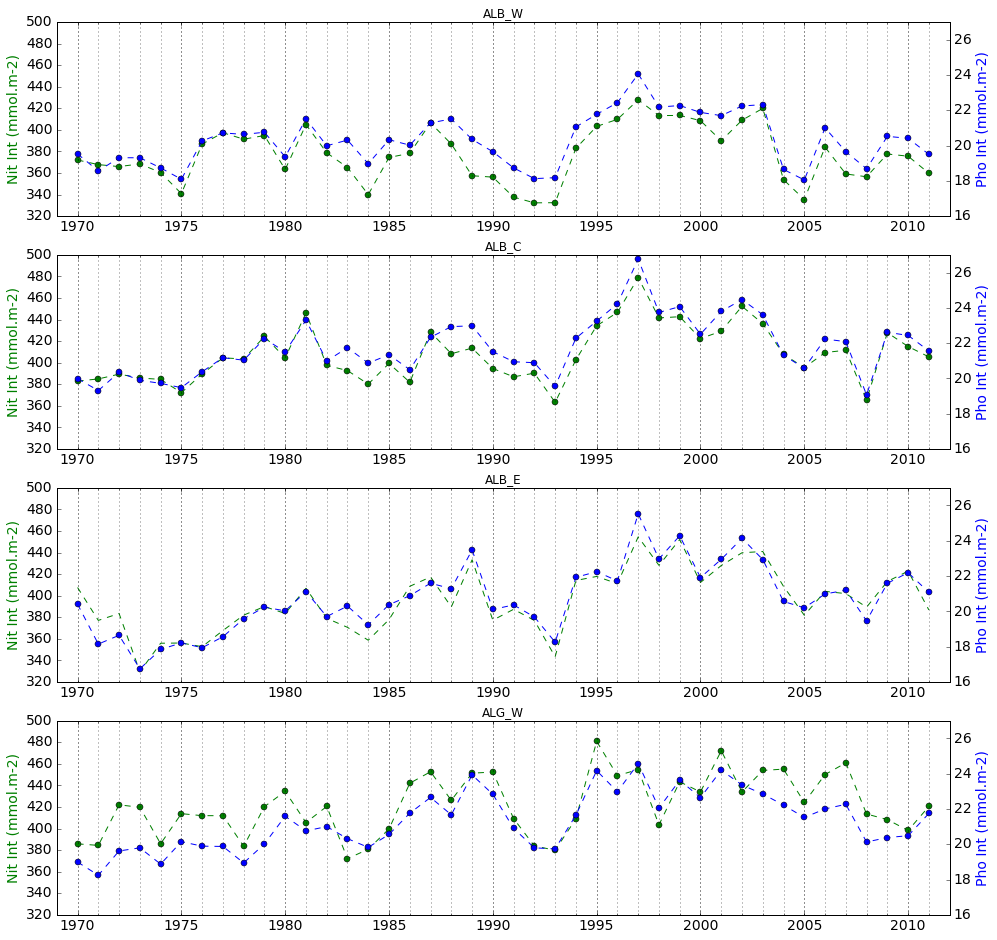

In [17]:
# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###
dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,16))
    
# ALB_W
ax1 = fig.add_subplot(411)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_W[:,9],'-o',color='b')
ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_W')
    
# ALB_C
ax1 = fig.add_subplot(412)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_C[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB_C[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_C[:,9],'-o',color='b')
ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_C')
    
# ALB_E
ax1 = fig.add_subplot(413)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_E[:,6],'--',color='g')
#ax1.plot(dates,df_ALB_E[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB_E[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_E[:,9],'-o',color='b')
ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_E')

# ALG_W
ax1 = fig.add_subplot(414)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALG_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,df_ALG_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALG_W[:,9],'-o',color='b')
ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALG_W')

#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/TRAJET_GibAlbAlg_NutInt150.png\',bbox_inches=\'tight\',format=\'png\')')

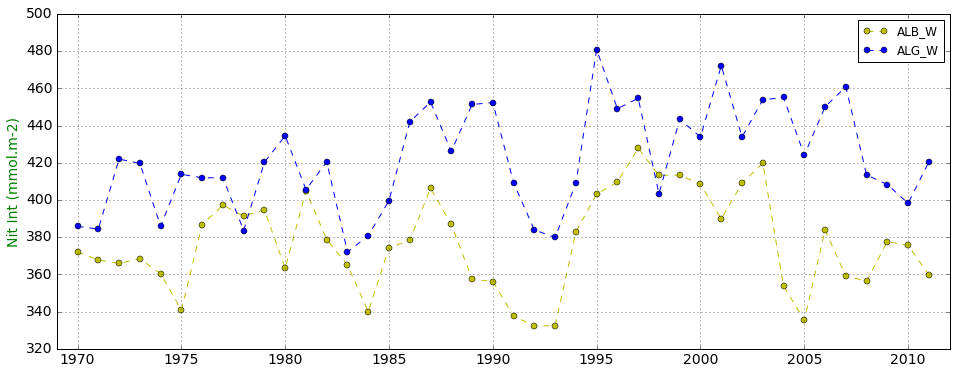

In [74]:
# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,6))
    
# ALL
plt.plot(dates,df_ALB_W[:,6],'--o',color='y', label='ALB_W')
#plt.plot(dates,df_ALB_C[:,6],'--',color='r', label='ALB_C')
#plt.plot(dates,df_ALB_E[:,6],'--',color='g', label='ALB_E')
plt.plot(dates,df_ALG_W[:,6],'--o',color='b', label='ALG_W')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')

eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/TRAJET_AlbWAlgW_NitInt150.png\',bbox_inches=\'tight\',format=\'png\')')

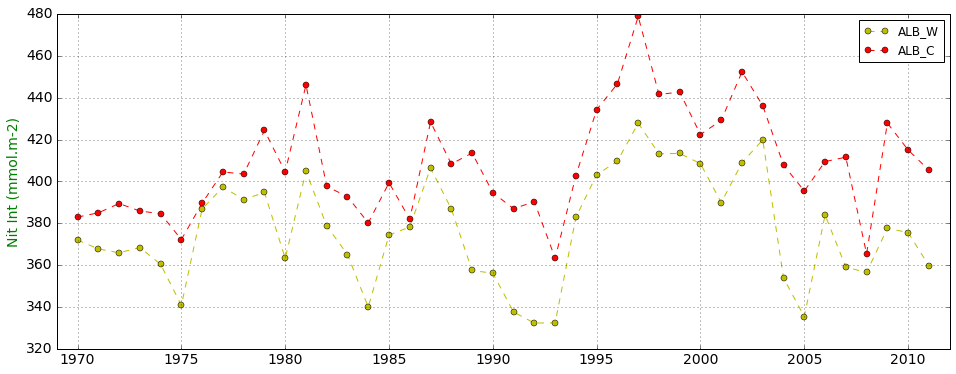

In [73]:
# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,6))
    
# ALL
plt.plot(dates,df_ALB_W[:,6],'--o',color='y', label='ALB_W')
plt.plot(dates,df_ALB_C[:,6],'--o',color='r', label='ALB_C')
#plt.plot(dates,df_ALB_E[:,6],'--',color='g', label='ALB_E')
#plt.plot(dates,df_ALG_W[:,6],'--o',color='b', label='ALG_W')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')

eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/TRAJET_AlbWAlbC_NitInt150.png\',bbox_inches=\'tight\',format=\'png\')')

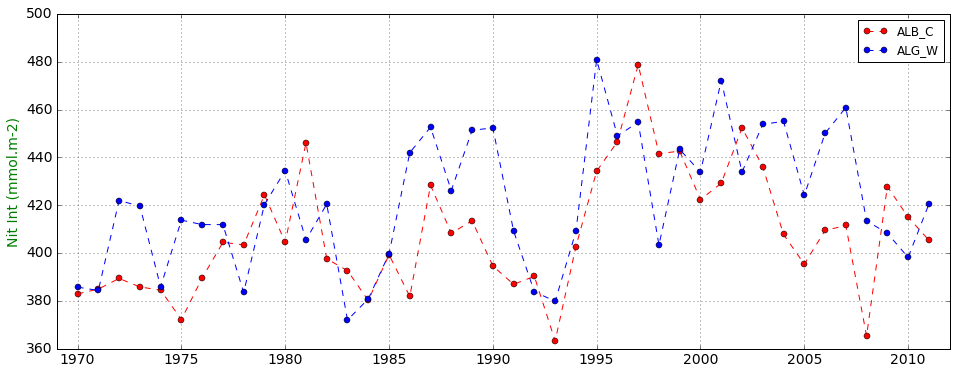

In [72]:
# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,6))
    
# ALL
#plt.plot(dates,df_ALB_W[:,6],'--o',color='y', label='ALB_W')
plt.plot(dates,df_ALB_C[:,6],'--o',color='r', label='ALB_C')
#plt.plot(dates,df_ALB_E[:,6],'--',color='g', label='ALB_E')
plt.plot(dates,df_ALG_W[:,6],'--o',color='b', label='ALG_W')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')

eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/TRAJET_AlbCAlgW_NitInt150.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### VERIFS ###

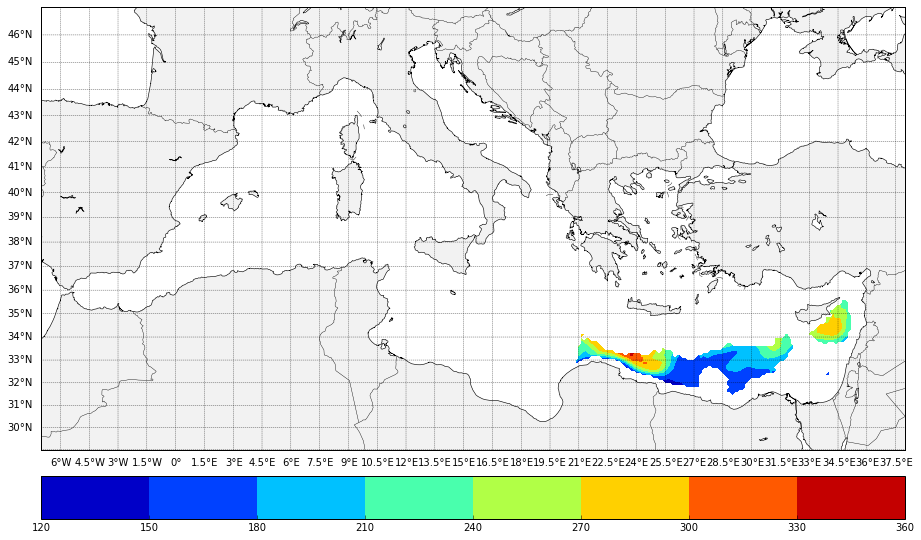

In [12]:
# CARTE BIDON TEST

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = this_var2
    
# NEW
xd,yd = m(lon_t,lat_t);
cs = m.contourf(xd,yd,data_to_plot,cmap=plt.cm.jet);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [123]:
var

'netppb'

In [88]:
file

'2011.nc'

In [124]:
df_N_LEV[41,:]

array([ 2011.        ,   678.02337646,            nan,            nan,
                  nan,            nan,            nan])

In [90]:
df_N_ION[41,:]

array([ 2011.        ,    21.94074821,    96.63395691,   127.52458191,
          66.76561737,   604.44244385,   358.07897949])

In [91]:
df_S_ION[41,:]

array([ 2011.        ,    24.35493851,   138.02008057,   246.38642883,
          39.20692062,   702.7020874 ,   253.69114685])

In [92]:
df_GOL[:,1]

array([ 29.63426208,  28.6881485 ,  32.12225342,  30.70239449,
        34.19858551,  30.84598351,  30.02689743,  31.20268631,
        30.97823906,  31.57567215,  28.13650894,  31.01760292,
        32.69219971,  31.00089455,  30.93202019,  30.39066315,
        30.81944084,  31.5168438 ,  30.31114388,  29.31920052,
        29.5169754 ,  32.16612244,  31.26721382,  32.03282166,
        31.72997665,  31.10657883,  29.16984558,  29.42378044,
        31.53409386,  31.12614632,  31.57825661,  31.93123245,
        30.57421112,  30.78895378,  28.97047043,  29.59636688,
        29.8733902 ,  33.25615311,  29.33636856,  29.88801765,
        30.66308022,  28.86024284])

In [93]:
df_GOL[:,0]

array([ 1970.,  1971.,  1972.,  1973.,  1974.,  1975.,  1976.,  1977.,
        1978.,  1979.,  1980.,  1981.,  1982.,  1983.,  1984.,  1985.,
        1986.,  1987.,  1988.,  1989.,  1990.,  1991.,  1992.,  1993.,
        1994.,  1995.,  1996.,  1997.,  1998.,  1999.,  2000.,  2001.,
        2002.,  2003.,  2004.,  2005.,  2006.,  2007.,  2008.,  2009.,
        2010.,  2011.])

In [94]:
np.nanmean(this_var2)

209.68851

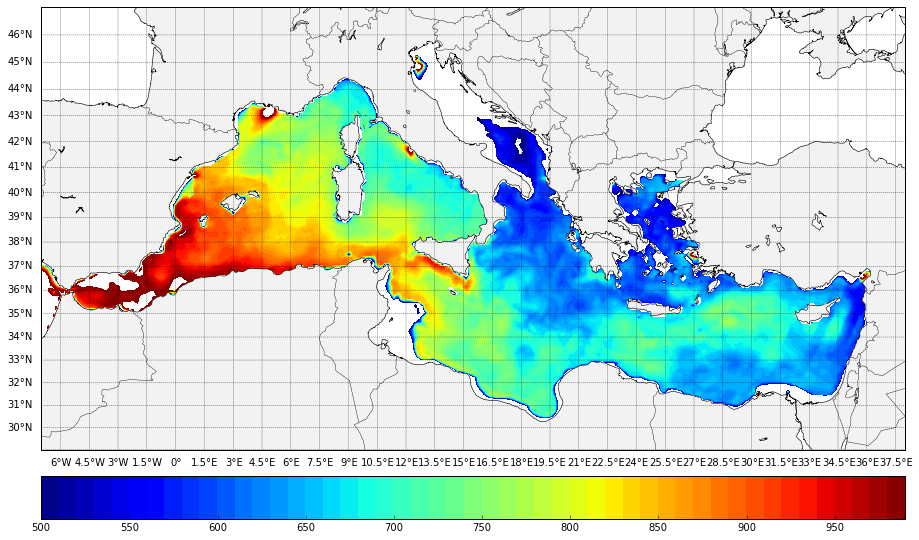

In [127]:
# CARTE BIDON TEST

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = this_var
    
# NEW
xd,yd = m(lon_t,lat_t);
levels = np.arange(500,1000,10);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [ ]:
### FIN VERIFS ###

In [96]:
dates

DatetimeIndex(['1970-01-01', '1971-01-01', '1972-01-01', '1973-01-01',
               '1974-01-01', '1975-01-01', '1976-01-01', '1977-01-01',
               '1978-01-01', '1979-01-01', '1980-01-01', '1981-01-01',
               '1982-01-01', '1983-01-01', '1984-01-01', '1985-01-01',
               '1986-01-01', '1987-01-01', '1988-01-01', '1989-01-01',
               '1990-01-01', '1991-01-01', '1992-01-01', '1993-01-01',
               '1994-01-01', '1995-01-01', '1996-01-01', '1997-01-01',
               '1998-01-01', '1999-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01'],
              dtype='datetime64[ns]', freq=None)

In [ ]:
### SORTIR LES TS ###

In [2]:
dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')

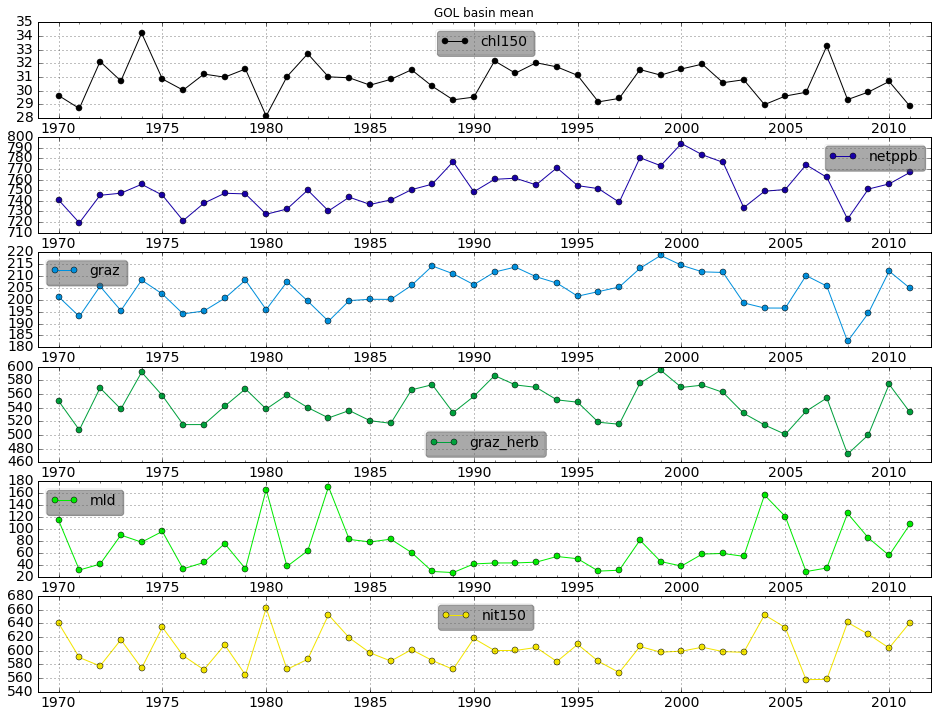

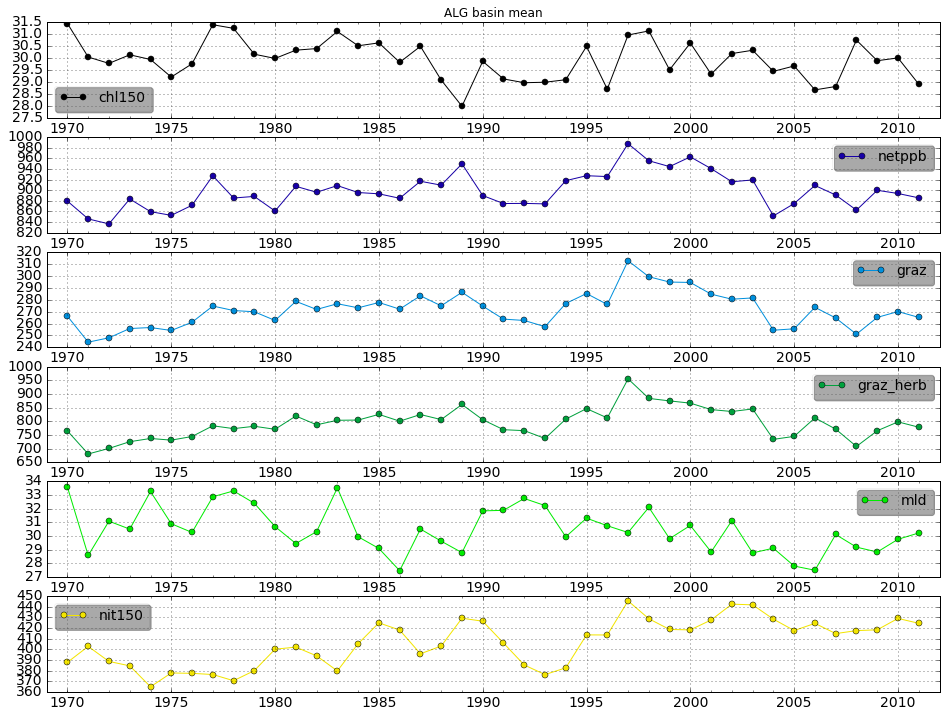

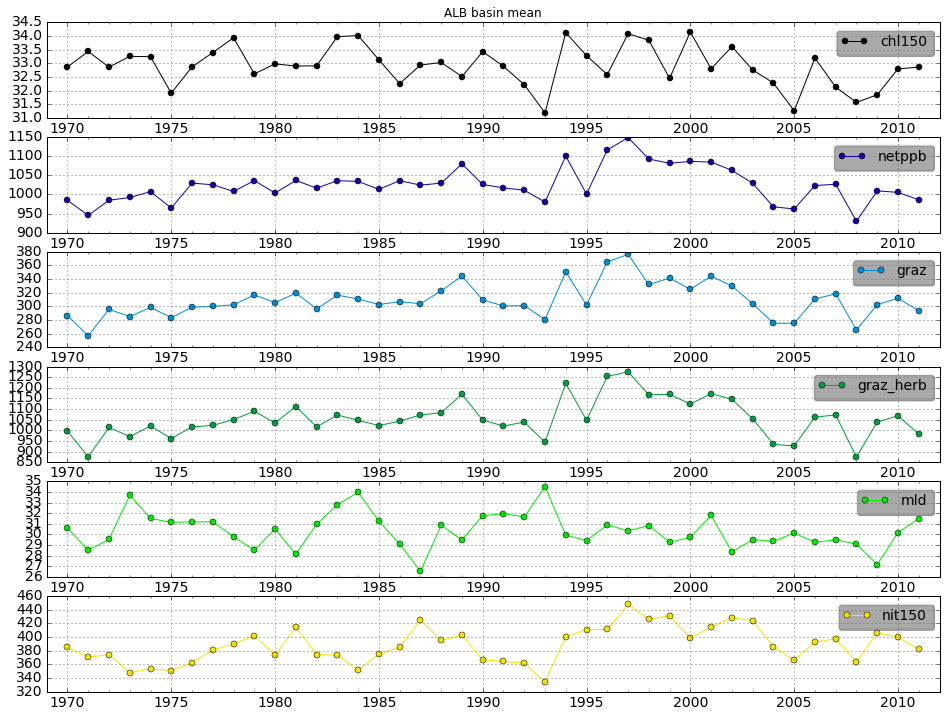

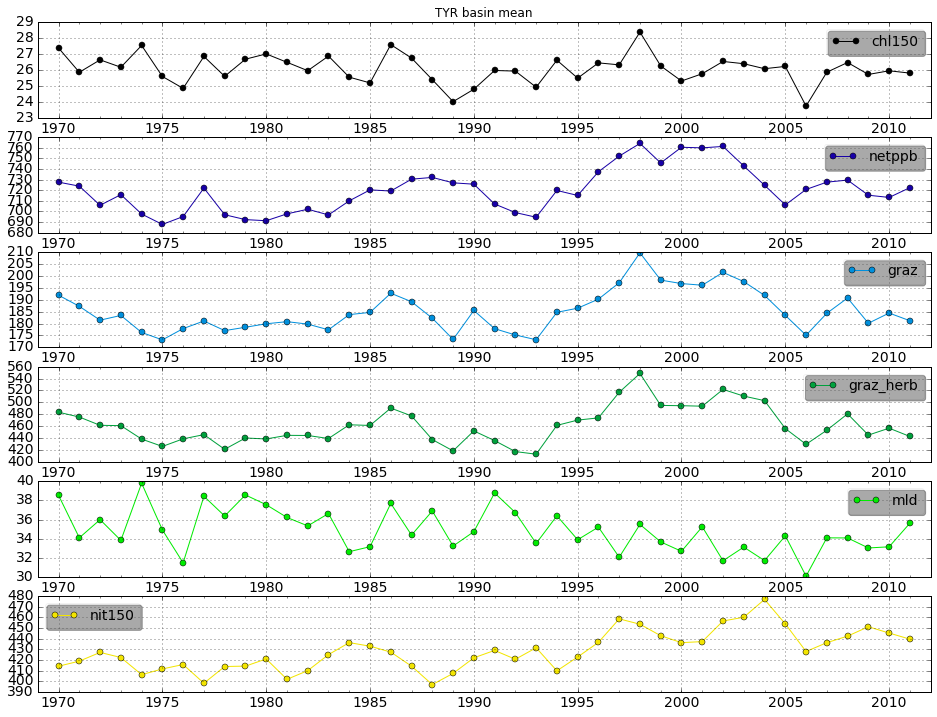

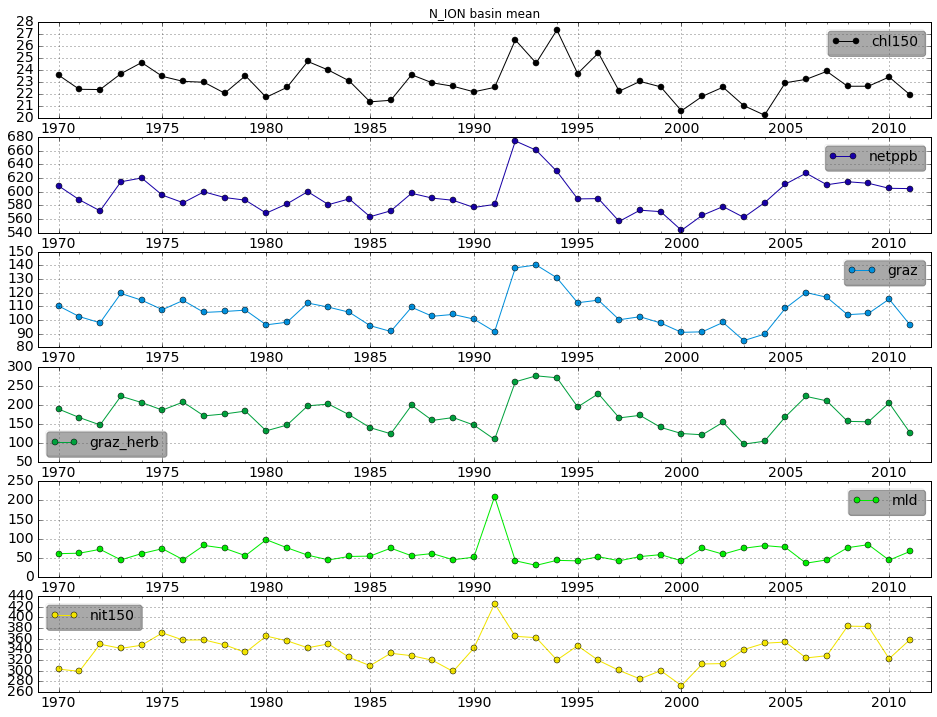

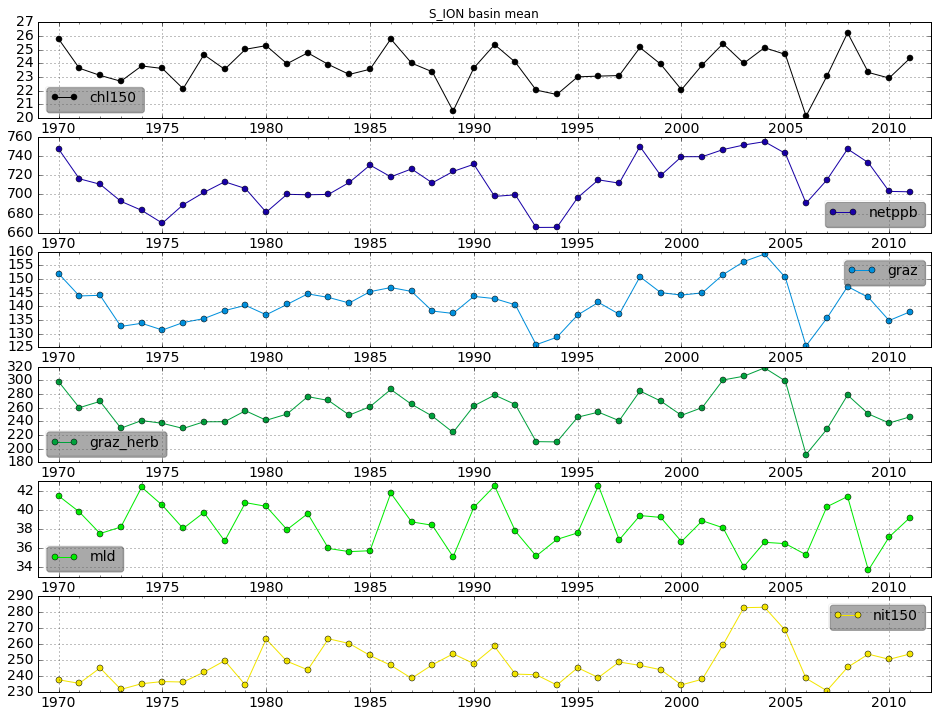

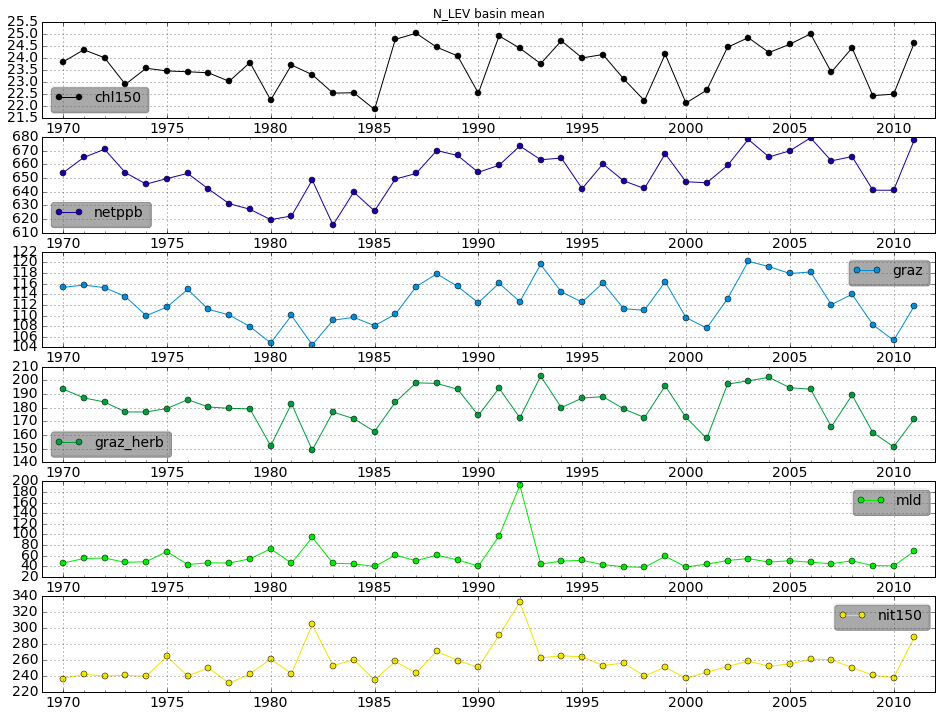

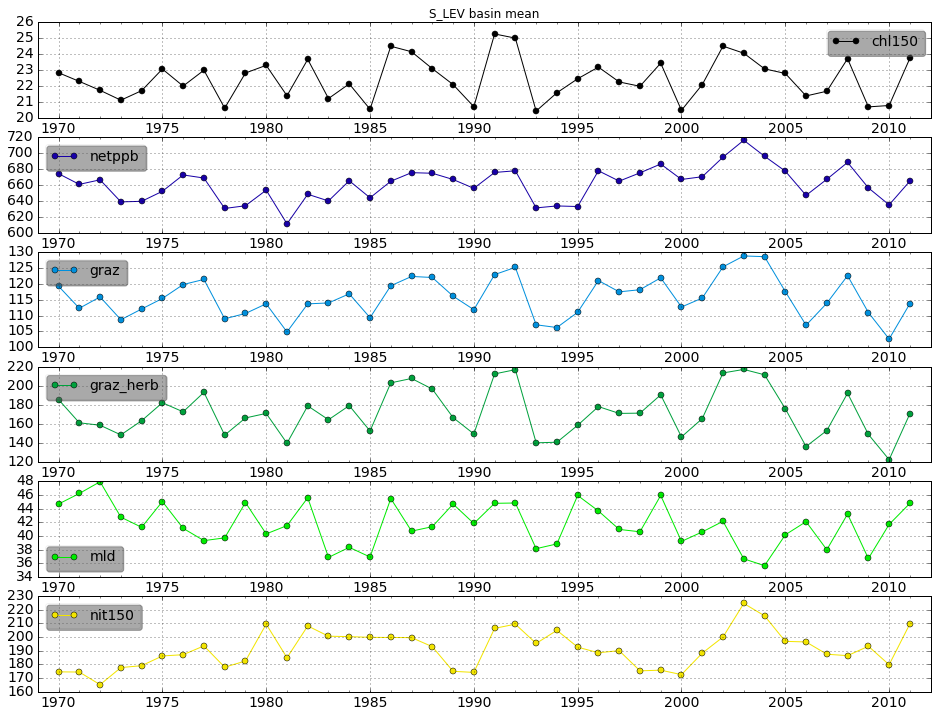

In [38]:
### On va commencer par une seule région ###
region_list = ['GOL', 'ALG', 'ALB', 'TYR', 'N_ION', 'S_ION', 'N_LEV', 'S_LEV'] #

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,12))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # chl_int
    plt.subplot(6, 1, 1)
    plt.plot(dates,vars()['df_'+basin][:,1],'-o',color=next(our_colormap), label='chl150')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # netppb
    plt.subplot(6, 1, 2)
    plt.plot(dates,vars()['df_'+basin][:,5],'-o',color=next(our_colormap), label='netppb')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    # graz
    plt.subplot(6, 1, 3)
    plt.plot(dates,vars()['df_'+basin][:,2],'-o',color=next(our_colormap), label='graz')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    # graz_herb
    plt.subplot(6, 1, 4)
    plt.plot(dates,vars()['df_'+basin][:,3],'-o',color=next(our_colormap), label='graz_herb')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    # mld
    plt.subplot(6, 1, 5)
    plt.plot(dates,vars()['df_'+basin][:,4],'-o',color=next(our_colormap), label='mld')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    # nit_int150
    plt.subplot(6, 1, 6)
    plt.plot(dates,vars()['df_'+basin][:,6],'-o',color=next(our_colormap), label='nit150')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.grid()
    plt.xticks(xticks_list,fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    leg = plt.legend(loc='best', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/TS_IAV_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
# TEST double y axis

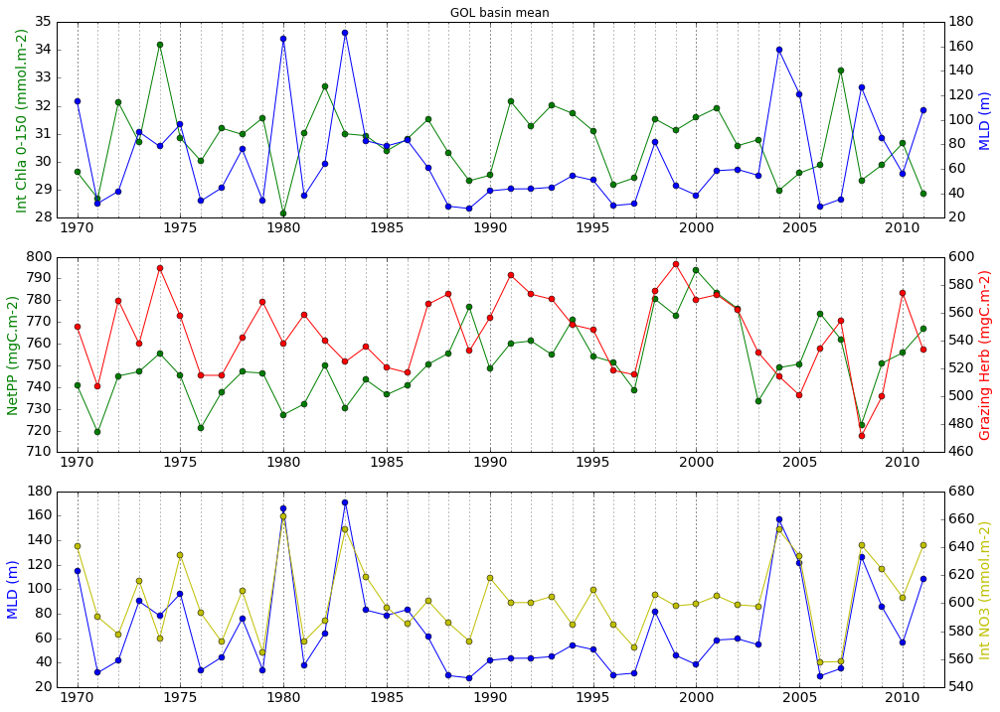

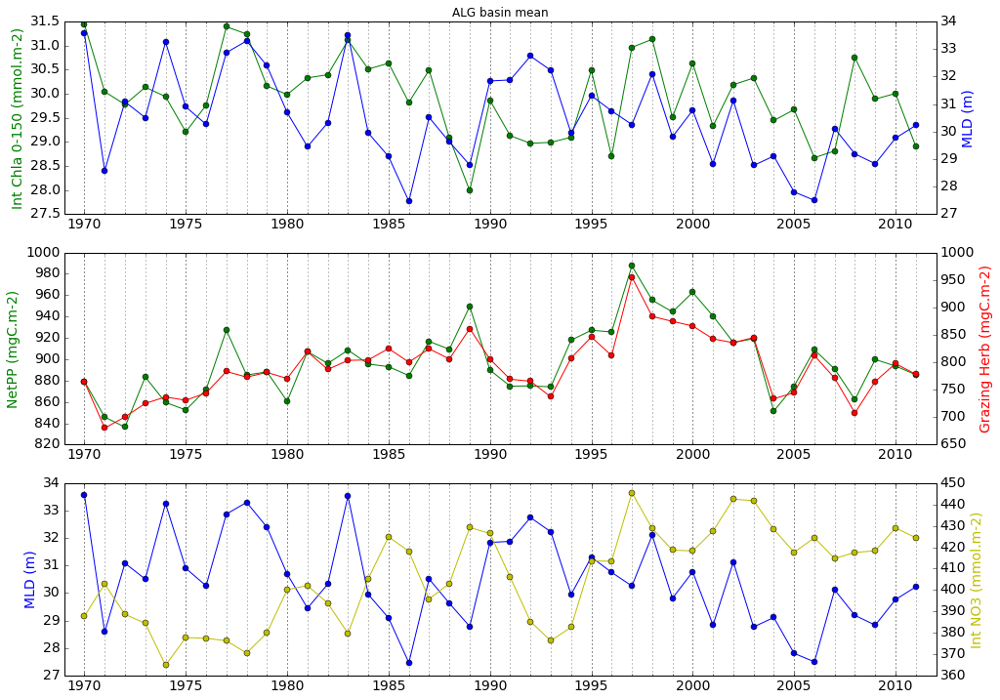

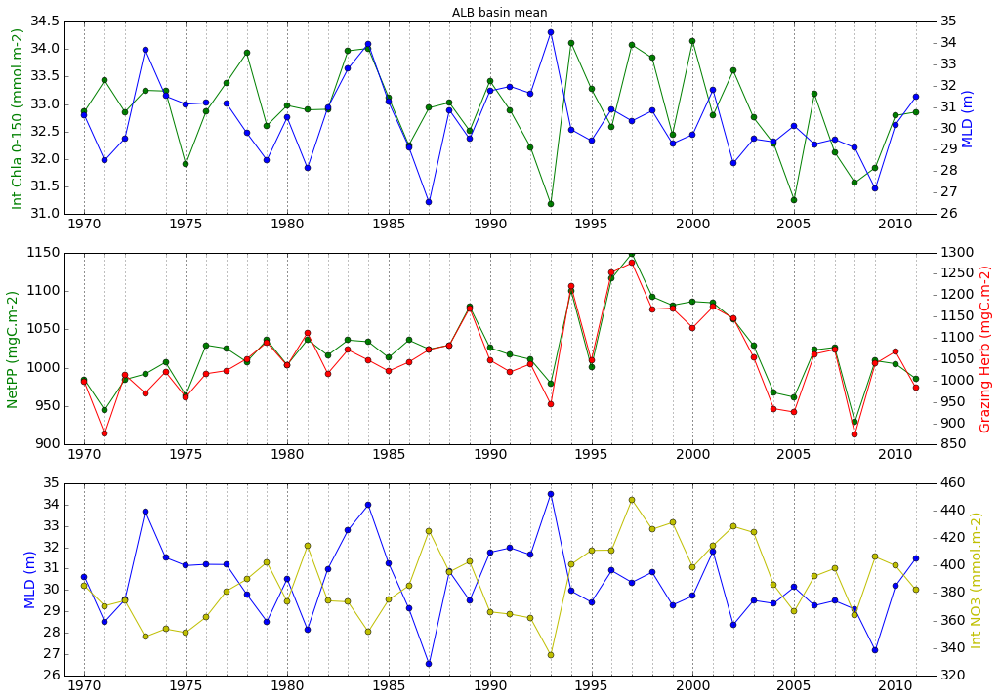

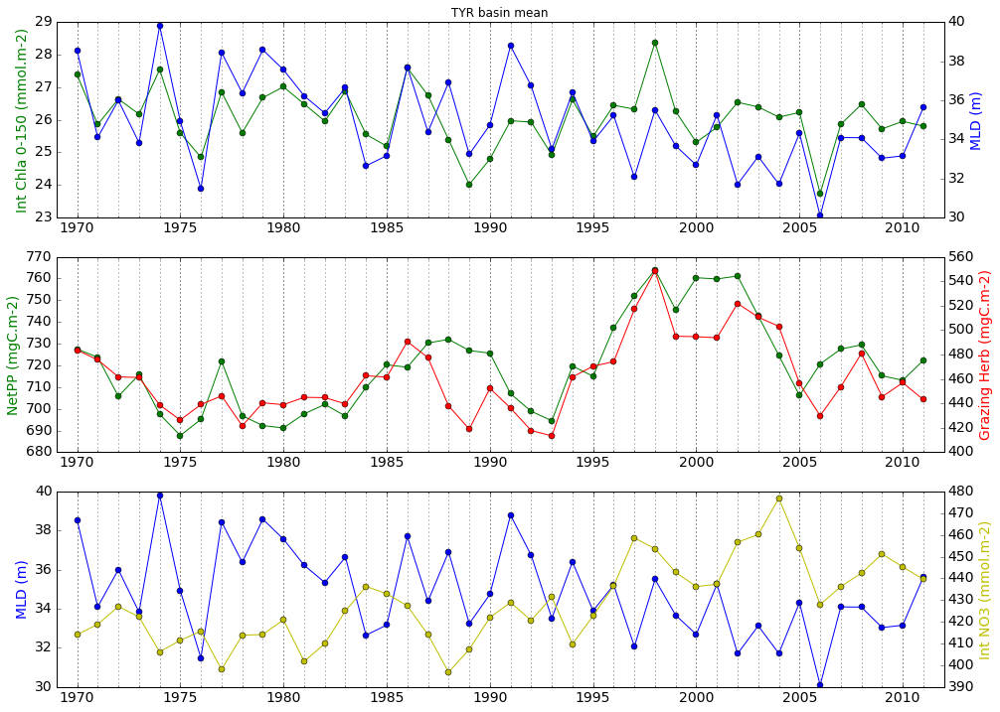

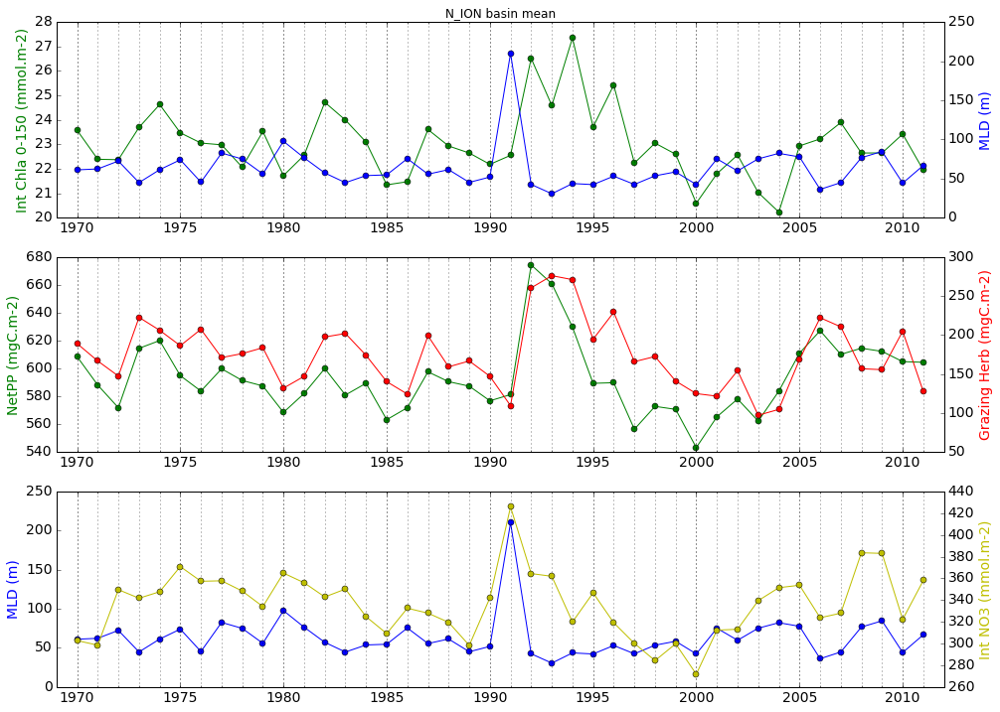

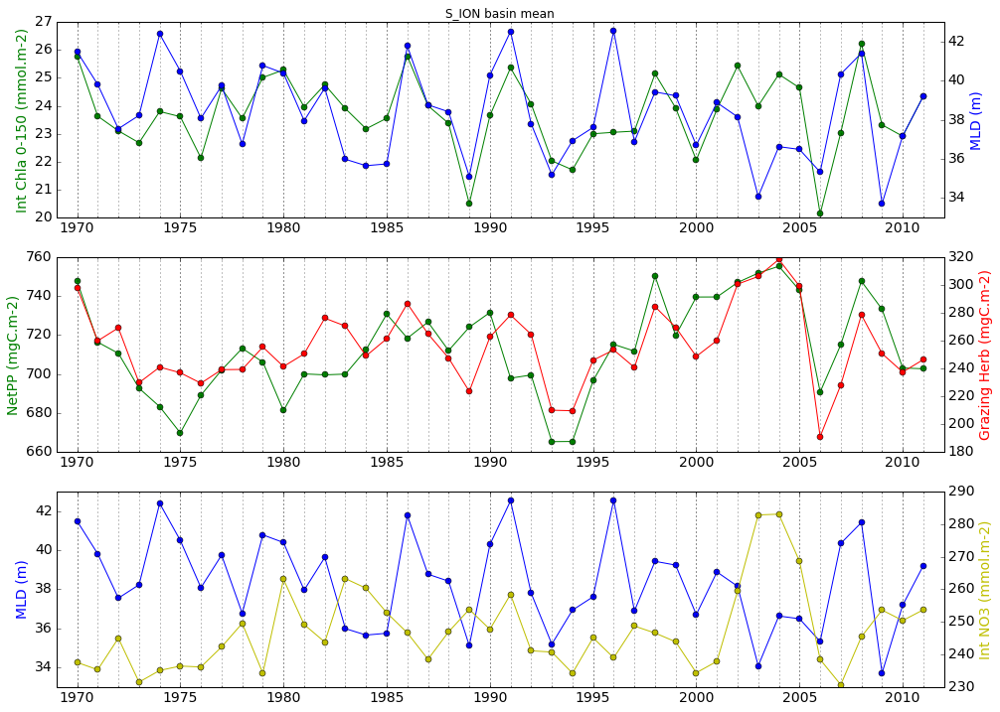

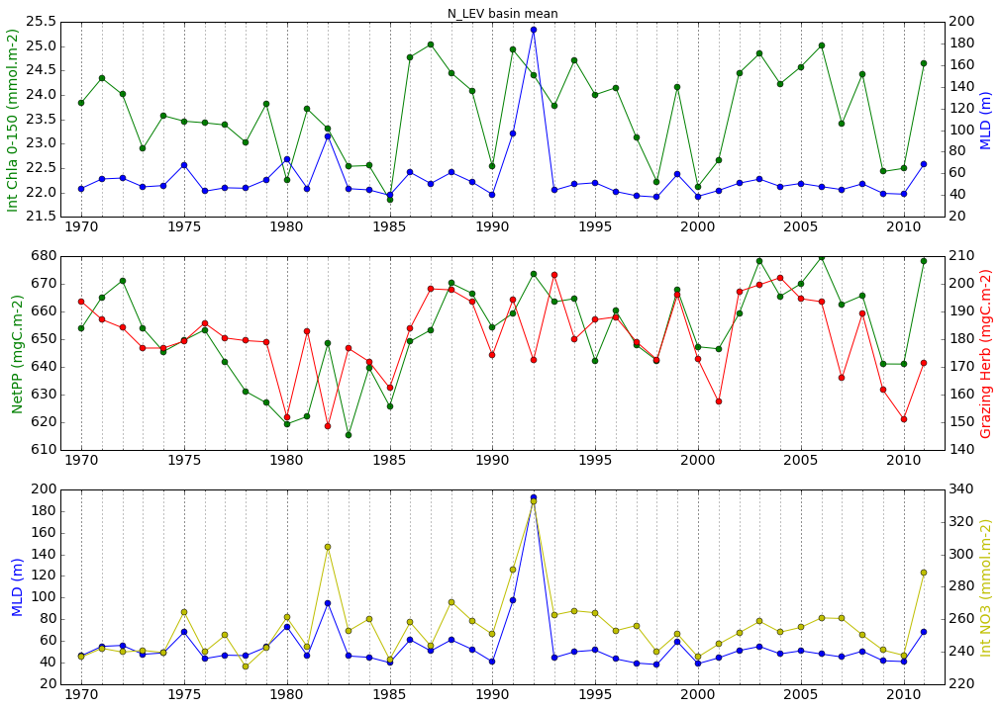

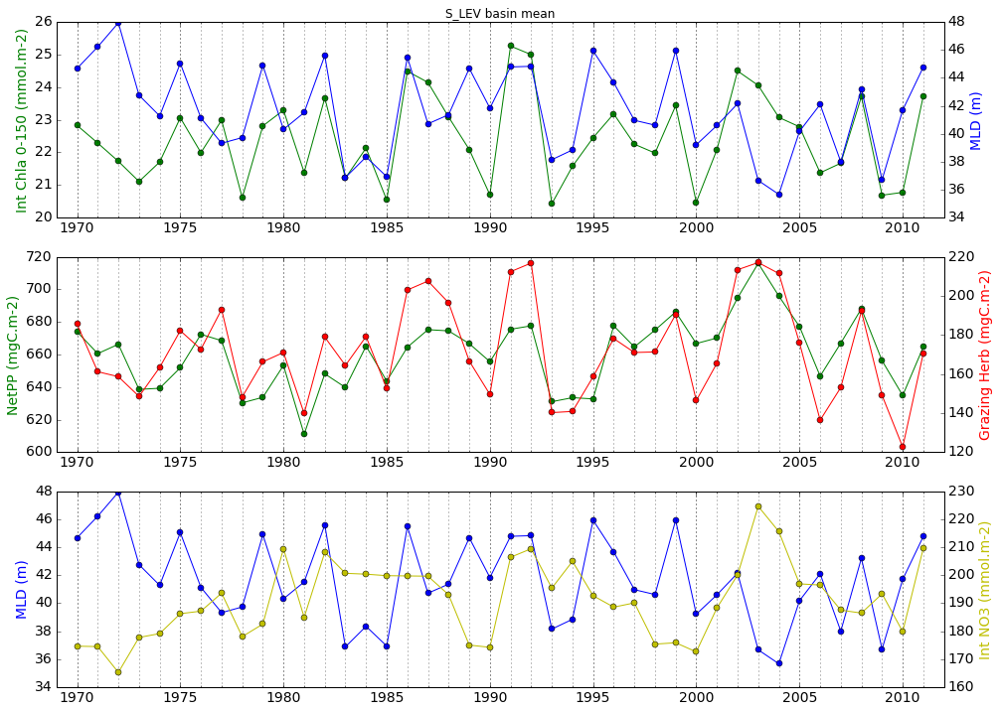

In [31]:
### On va commencer par une seule région ###
region_list = ['GOL', 'ALG', 'ALB', 'TYR', 'N_ION', 'S_ION', 'N_LEV', 'S_LEV']
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for basin in region_list:
    #c = 1
    fig = plt.figure(figsize=(16,12))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # chl_int x MLD
    ax1 = fig.add_subplot(311)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,1],'-o',color='g', label='chl150')
    plt.ylabel("Int Chla 0-150 (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()    
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,4],'-o',color='b', label='mld')
    ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.ylabel("Int Chla 0-150 (mmol.m-2)")
    eval('plt.title(\''+basin+' basin mean\')')
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # netppb x grazing
    ax1 = fig.add_subplot(312)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,5],'-o',color='g', label='netppb')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("NetPP (mgC.m-2)", fontsize=14, color = 'g')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid() 
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,3],'-o',color='r', label='graz herb')
    ax2.set_ylabel("Grazing Herb (mgC.m-2)", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # MLD x Nit150
    ax1 = fig.add_subplot(313)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,4],'-o',color='b', label='mld')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("MLD (m)", fontsize=14, color = 'b')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,6],'-o',color='y', label='nit150')
    ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_herb.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
## EXPLORATIONS ALG ALEX ###

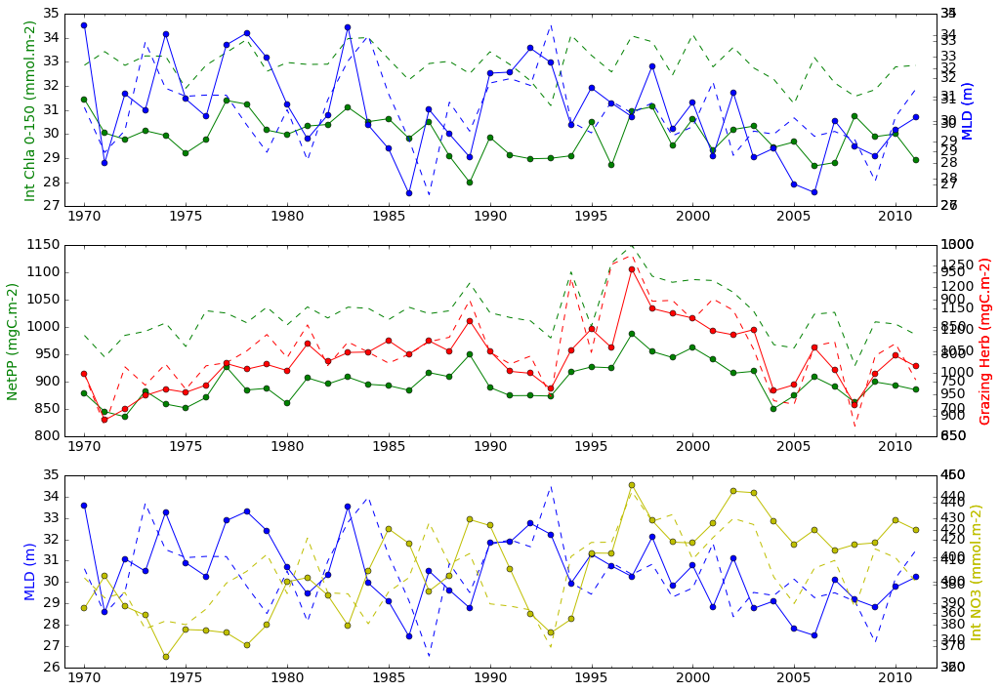

In [106]:
### On va commencer par une seule région ###
region_list = ['ALB', 'ALG']
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))

for basin in region_list:
    if basin == 'ALB':
        bastyle = '--'
    else:
        bastyle = '-o'    
    
    # chl_int x MLD
    ax1 = fig.add_subplot(311)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,1],bastyle,color='g', label='chl150')
    plt.ylabel("Int Chla 0-150 (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()    
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,4],bastyle,color='b', label='mld')
    ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.ylabel("Int Chla 0-150 (mmol.m-2)")
    #eval('plt.title(\''+basin+' basin mean\')')
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # netppb x grazing
    ax1 = fig.add_subplot(312)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,5],bastyle,color='g', label='netppb')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("NetPP (mgC.m-2)", fontsize=14, color = 'g')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid() 
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,3],bastyle,color='r', label='graz herb')
    ax2.set_ylabel("Grazing Herb (mgC.m-2)", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # MLD x Nit150
    ax1 = fig.add_subplot(313)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,4],bastyle,color='b', label='mld')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("MLD (m)", fontsize=14, color = 'b')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,6],bastyle,color='y', label='nit150')
    ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_herb.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### On va commencer par une seule région ###
region_list = ['ALB', 'ALG']
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))

for basin in region_list:
    if basin == 'ALB':
        bastyle = '--'
    else:
        bastyle = '-o'    
    
    # chl_int x MLD
    ax1 = fig.add_subplot(311)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,1],bastyle,color='g', label='chl150')
    plt.ylabel("Int Chla 0-150 (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()    
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,4],bastyle,color='b', label='mld')
    ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.ylabel("Int Chla 0-150 (mmol.m-2)")
    #eval('plt.title(\''+basin+' basin mean\')')
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # netppb x grazing
    ax1 = fig.add_subplot(312)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,5],bastyle,color='g', label='netppb')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("NetPP (mgC.m-2)", fontsize=14, color = 'g')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid() 
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,3],bastyle,color='r', label='graz herb')
    ax2.set_ylabel("Grazing Herb (mgC.m-2)", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    # MLD x Nit150
    ax1 = fig.add_subplot(313)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,vars()['df_'+basin][:,4],bastyle,color='b', label='mld')
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=60))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.ylabel("MLD (m)", fontsize=14, color = 'b')
    #ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.grid()
    ax2 = ax1.twinx()
    ax2.plot(dates,vars()['df_'+basin][:,6],bastyle,color='y', label='nit150')
    ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_herb.png\',bbox_inches=\'tight\',format=\'png\')')

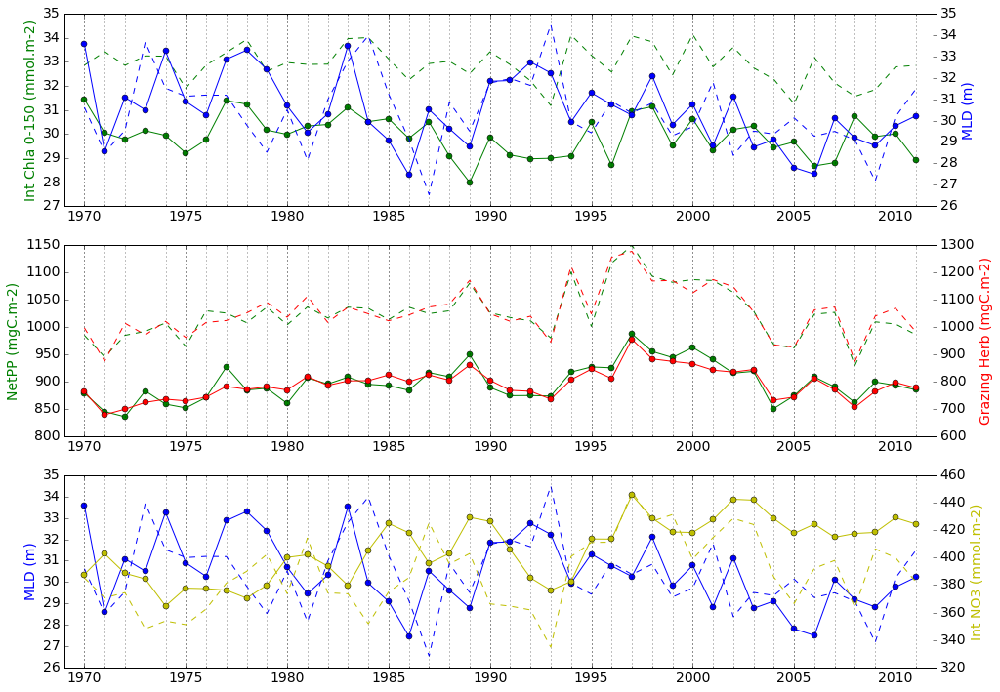

In [112]:
### On va commencer par une seule région ###
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))
spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
# chl_int x MLD
ax1 = fig.add_subplot(311)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,1],'--',color='g')
ax1.plot(dates,df_ALG[:,1],'-o',color='g', label='chl150')
plt.ylabel("Int Chla 0-150 (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB[:,4],'--',color='b')
ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
    
# netppb x grazing
ax1 = fig.add_subplot(312)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,5],'--',color='g')
ax1.plot(dates,df_ALG[:,5],'-o',color='g', label='netppb')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.ylabel("NetPP (mgC.m-2)", fontsize=14, color = 'g')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB[:,3],'--',color='r', label='graz herb')
ax2.plot(dates,df_ALG[:,3],'-o',color='r', label='graz herb')
ax2.set_ylabel("Grazing Herb (mgC.m-2)", fontsize=14, color = 'r')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
    
# MLD x Nit150
ax1 = fig.add_subplot(313)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,4],'--',color='b', label='mld')
ax1.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.ylabel("MLD (m)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
ax2.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_ALBALG.png\',bbox_inches=\'tight\',format=\'png\')')

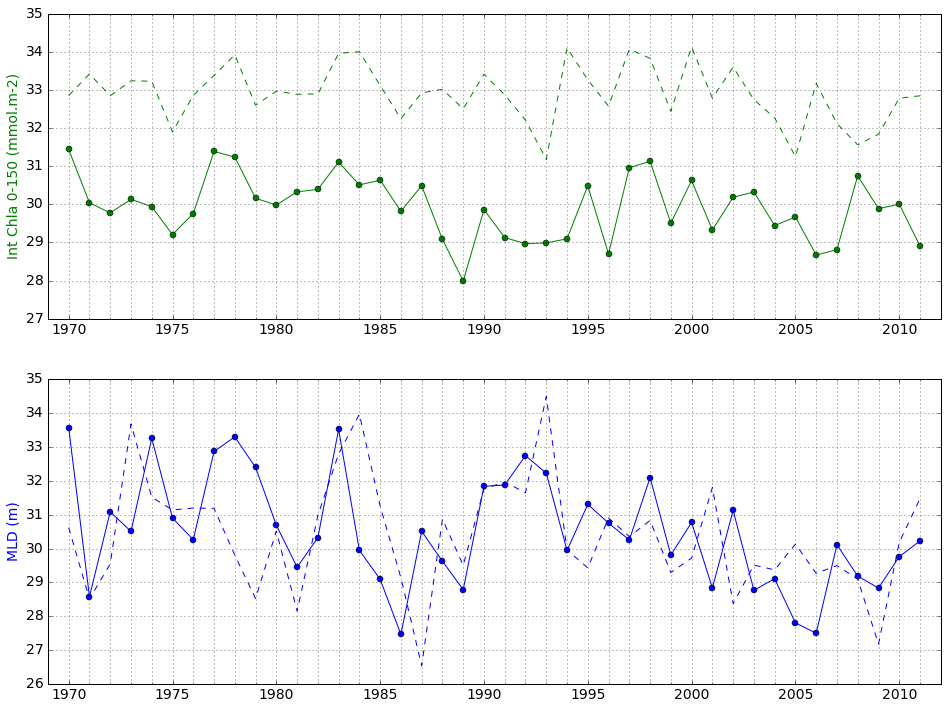

In [127]:
### On va commencer par une seule région ###
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))
spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
# chl_int x MLD
ax1 = fig.add_subplot(211)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,1],'--',color='g')
ax1.plot(dates,df_ALG[:,1],'-o',color='g', label='chl150')
plt.ylabel("Int Chla 0-150 (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
#ax2 = ax1.twinx()
#ax2.plot(dates,df_ALB[:,4],'--',color='b')
#ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
#ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
#plt.yticks(fontsize=14)
#plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.grid(axis='x', which='both')
plt.grid()
    
# MLD x Nit150
ax1 = fig.add_subplot(212)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,4],'--',color='b', label='mld')
ax1.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.ylabel("MLD (m)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
#ax2 = ax1.twinx()
#ax2.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
#ax2.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
#ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
#plt.yticks(fontsize=14)
#plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.grid(axis='x', which='both')
plt.grid()
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_ALBALG_IntChl_MLD.png\',bbox_inches=\'tight\',format=\'png\')')

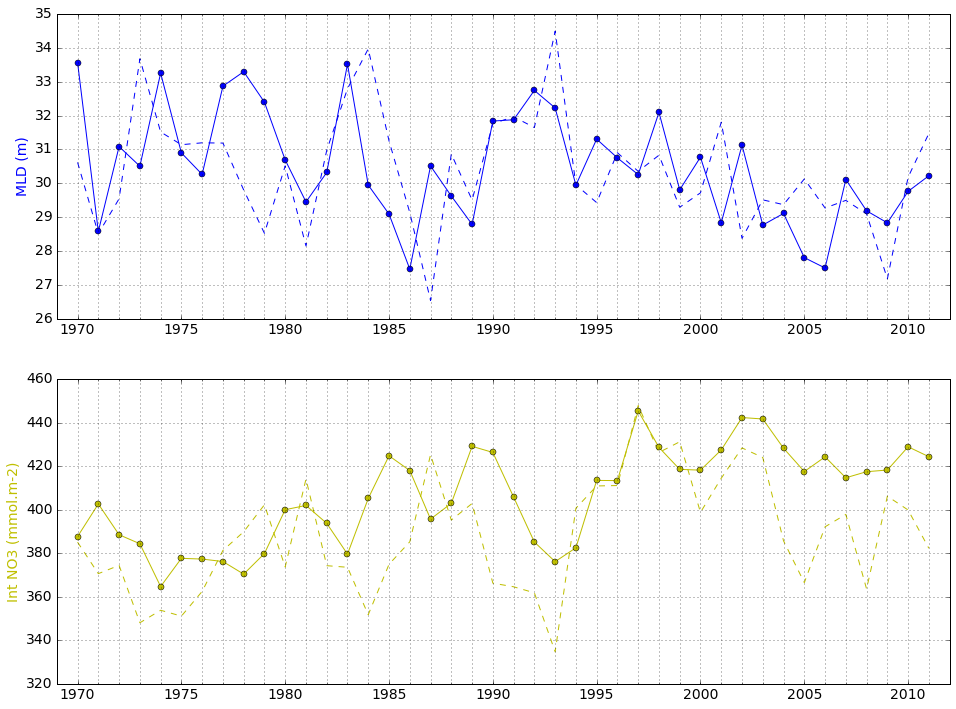

In [130]:
### On va commencer par une seule région ###
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))
spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
# chl_int x MLD
ax1 = fig.add_subplot(212)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
ax1.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
#ax2 = ax1.twinx()
#ax2.plot(dates,df_ALB[:,4],'--',color='b')
#ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
#ax2.set_ylabel("MLD (m)", fontsize=14, color = 'b')
#plt.yticks(fontsize=14)
#plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.grid(axis='x', which='both')
plt.grid()
    
# MLD x Nit150
ax1 = fig.add_subplot(211)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,4],'--',color='b', label='mld')
ax1.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.ylabel("MLD (m)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
#ax2 = ax1.twinx()
#ax2.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
#ax2.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
#ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
#plt.yticks(fontsize=14)
#plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.grid(axis='x', which='both')
plt.grid()
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_ALBALG_MLD_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### DEBITS ###

In [18]:
# 26/02 ouverture en boucle de tous les fichiers 
file_list = ['DON', 'DOP'] # 'Nit', 'Amm', 'DON', 'PON', 'Pho', 'DOP', 'POP', 'Sil'

for file in file_list:
    vars()['df_'+file] = pd.read_table('./debitnew/debitbio_section_Gibraltar'+file,sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                       'debssw','debiw','debdw'])
    vars()['df_'+file]['date'] = pd.to_datetime(vars()['df_'+file]['time'], format="%Y%m%d")
    vars()['df_'+file]['yy'] = pd.DatetimeIndex(vars()['df_'+file]['date']).year
    vars()['df_'+file]['mm'] = pd.DatetimeIndex(vars()['df_'+file]['date']).month
    
    yy_corr = np.zeros([len(vars()['df_'+file])])
    yy_corr[:] = np.nan
    vars()['df_'+file]['yy_corr'] = yy_corr 
    
    for o in np.arange(0, len(vars()['df_'+file])):
        if vars()['df_'+file]['mm'][o] >= 10:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]
        else:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]-1

print 'End of cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


End of cell


In [28]:
# 04/03 ouverture en boucle de tous les fichiers 
file_list = ['Nit', 'Amm', 'PON', 'Pho', 'POP'] # 'Nit', 'Amm', 'DON', 'PON', 'Pho', 'DOP', 'POP', 'Sil'

for file in file_list:
    vars()['df_'+file] = pd.read_table('./debitnew/debitbio_section_Gibraltar'+file,sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                       'debssw','debiw','debdw'])
    vars()['df_'+file]['date'] = pd.to_datetime(vars()['df_'+file]['time'], format="%Y%m%d")
    vars()['df_'+file]['yy'] = pd.DatetimeIndex(vars()['df_'+file]['date']).year
    vars()['df_'+file]['mm'] = pd.DatetimeIndex(vars()['df_'+file]['date']).month
    
    yy_corr = np.zeros([len(vars()['df_'+file])])
    yy_corr[:] = np.nan
    vars()['df_'+file]['yy_corr'] = yy_corr 
    
    for o in np.arange(0, len(vars()['df_'+file])):
        if vars()['df_'+file]['mm'][o] >= 10:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]
        else:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]-1
    print file

print 'End of cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Nit
Amm
PON
Pho
POP
End of cell


In [7]:
# 26/02 ouverture en boucle de tous les fichiers
file_list = ['Debit']

for file in file_list:
    vars()['df_'+file] = pd.read_table('./debitnew/debit_section_Gibraltar'+file,sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                       'debssw','debiw','debdw'])
    vars()['df_'+file]['date'] = pd.to_datetime(vars()['df_'+file]['time'], format="%Y%m%d")
    vars()['df_'+file]['yy'] = pd.DatetimeIndex(vars()['df_'+file]['date']).year
    vars()['df_'+file]['mm'] = pd.DatetimeIndex(vars()['df_'+file]['date']).month
    
    yy_corr = np.zeros([len(vars()['df_'+file])])
    yy_corr[:] = np.nan
    vars()['df_'+file]['yy_corr'] = yy_corr 
    
    for o in np.arange(0, len(vars()['df_'+file])):
        if vars()['df_'+file]['mm'][o] >= 10:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]
        else:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]-1

print 'End of cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


End of cell


In [29]:
year_list = np.arange(1970,2012)
#file_list = ['Nit', 'Amm', 'DON', 'PON', 'Pho', 'DOP', 'POP', 'Sil', 'Debit'] # 
file_list = ['Nit', 'Amm', 'PON', 'Pho', 'POP'] #

for file in file_list:
    print file
    count = 0
    vars()['AnnMean_'+file] = np.zeros([len(year_list)]) # ou len year_list pareil

    for y in year_list:
        vars()['AnnMean_'+file][count] =  vars()['df_'+file].groupby('yy_corr')['debsw'].mean()[y]
        count += 1

Nit
Amm
PON
Pho
POP


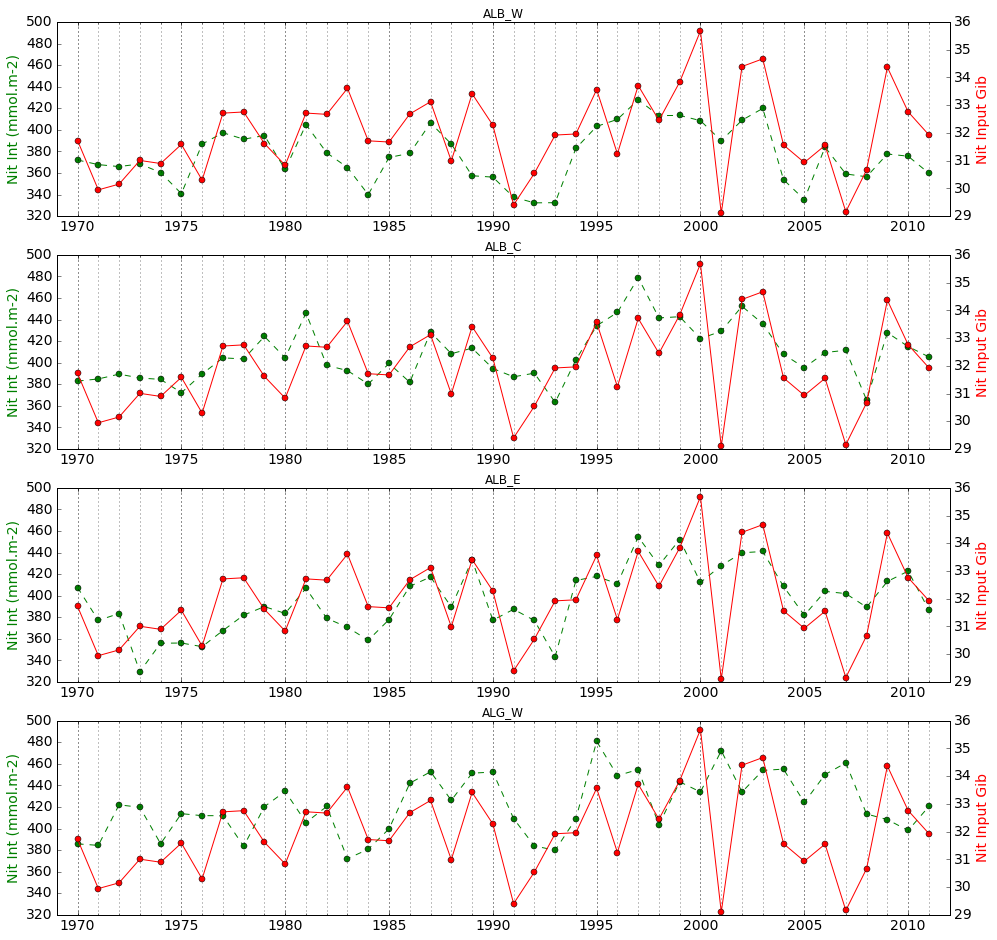

In [32]:
# 04/03 Nit

# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###
dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,16))
    
# ALB_W
ax1 = fig.add_subplot(411)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_Nit,'-o',color='r')
#ax2.plot(dates,df_ALB_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_W[:,9],'-o',color='b')
ax2.set_ylabel("Nit Input Gib", fontsize=14, color = 'r')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_W')
    
# ALB_C
ax1 = fig.add_subplot(412)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_C[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_Nit,'-o',color='r')
ax2.set_ylabel("Nit Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALB_C[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_C[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALB_C')
    
# ALB_E
ax1 = fig.add_subplot(413)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_E[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_Nit,'-o',color='r')
ax2.set_ylabel("Nit Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALB_E[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_E[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALB_E')

# ALG_W
ax1 = fig.add_subplot(414)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALG_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_Nit,'-o',color='r')
ax2.set_ylabel("Nit Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALG_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALG_W[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALG_W')

eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_NitInput.png\',bbox_inches=\'tight\',format=\'png\')')

In [35]:
nut_list

NameError: name 'nut_list' is not defined

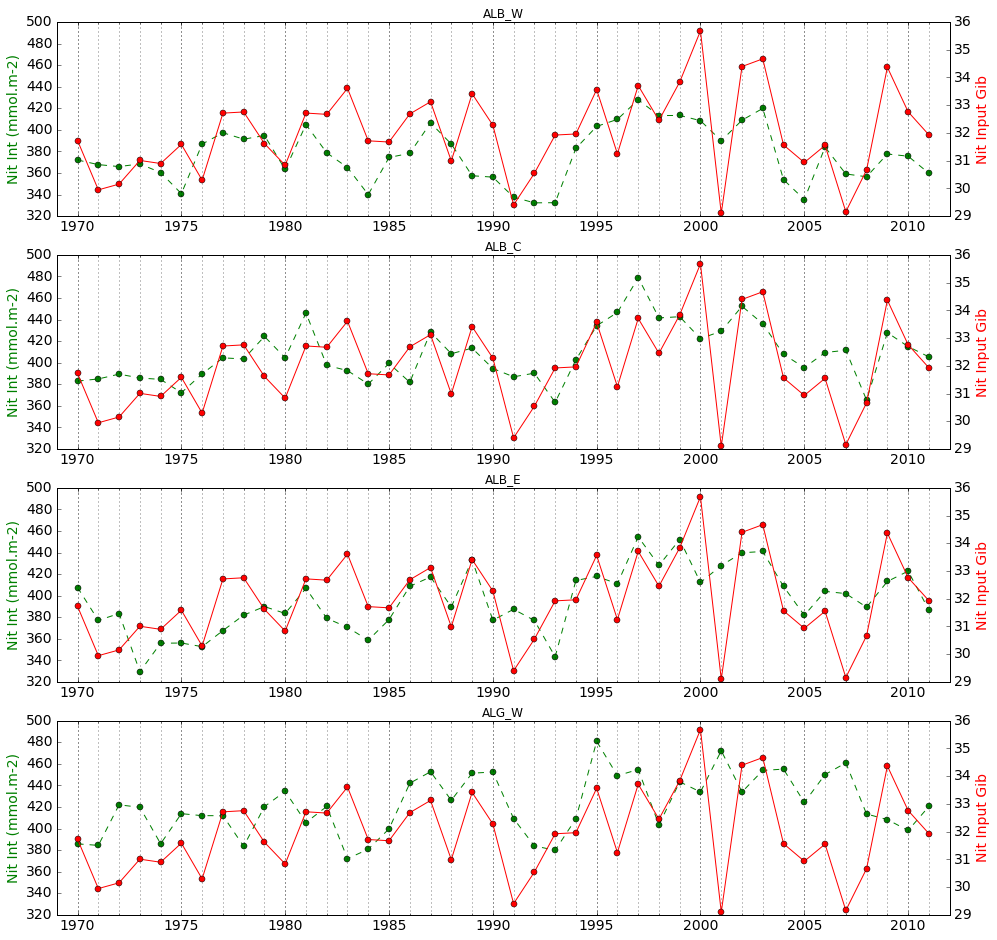

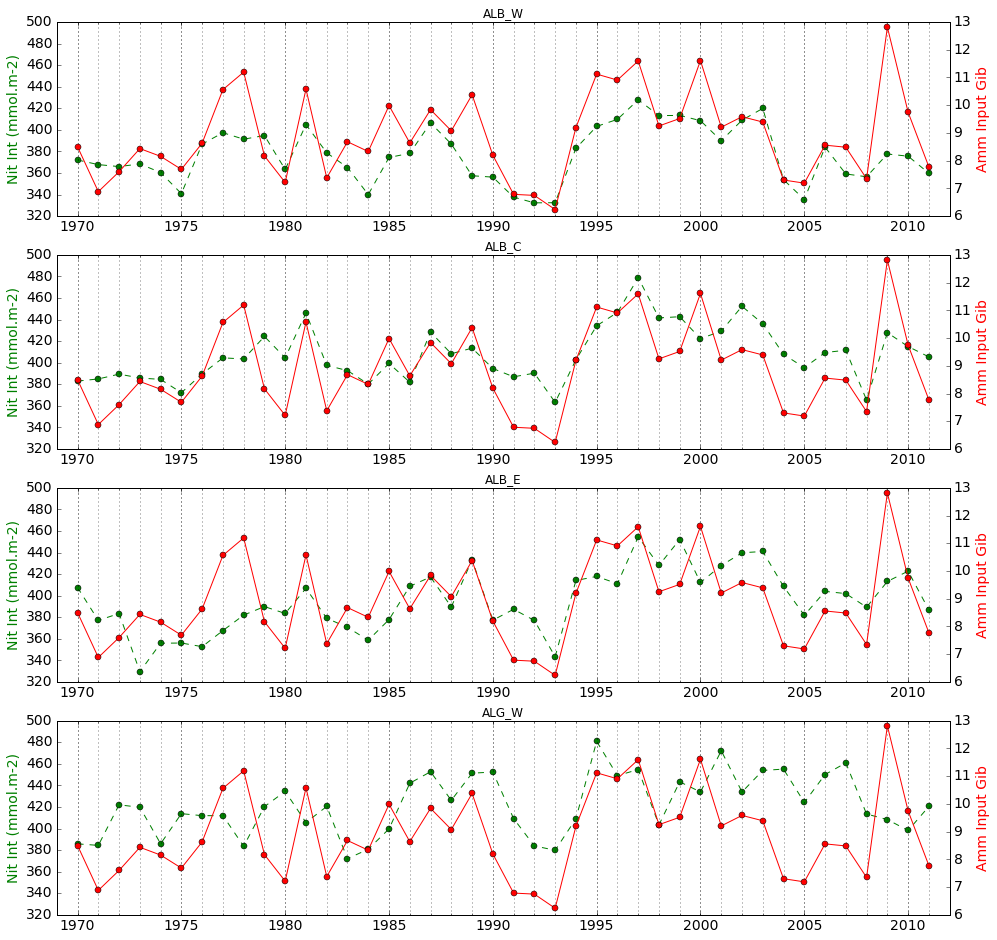

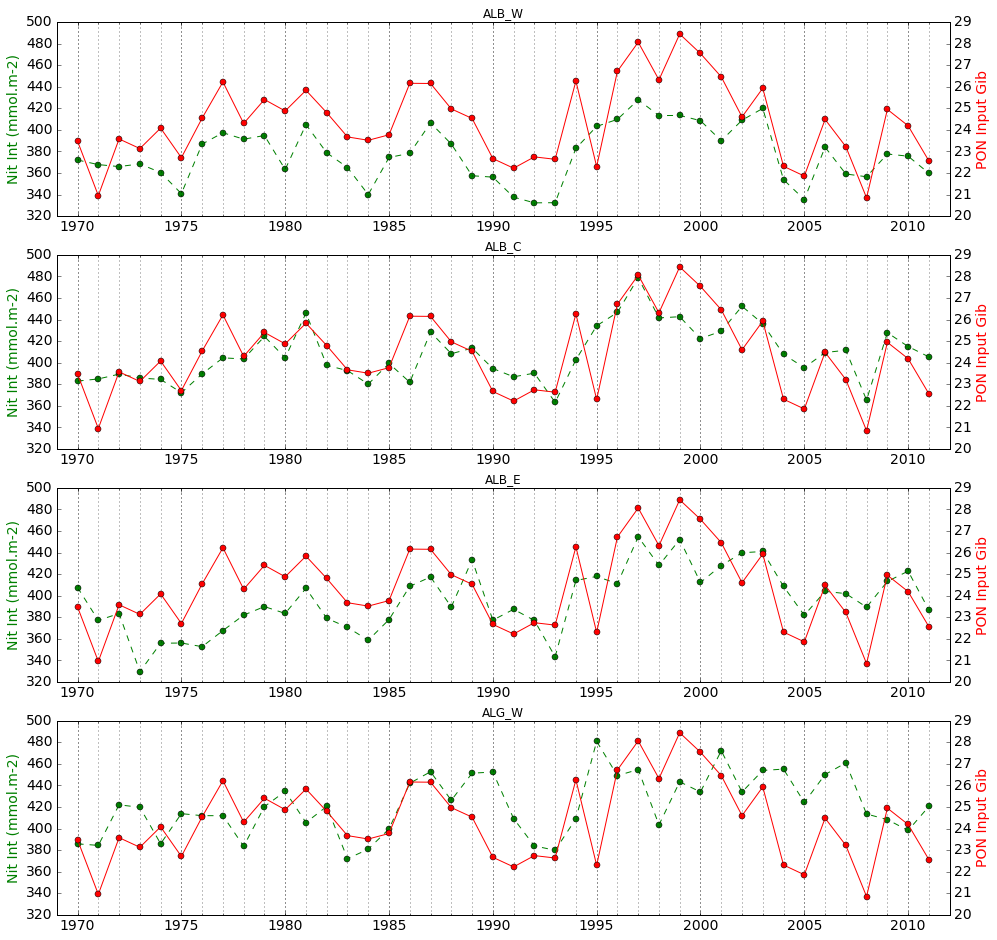

In [37]:
# 04/03 Plots for all nuts inputs

nut_list = ['Nit', 'Amm', 'PON'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

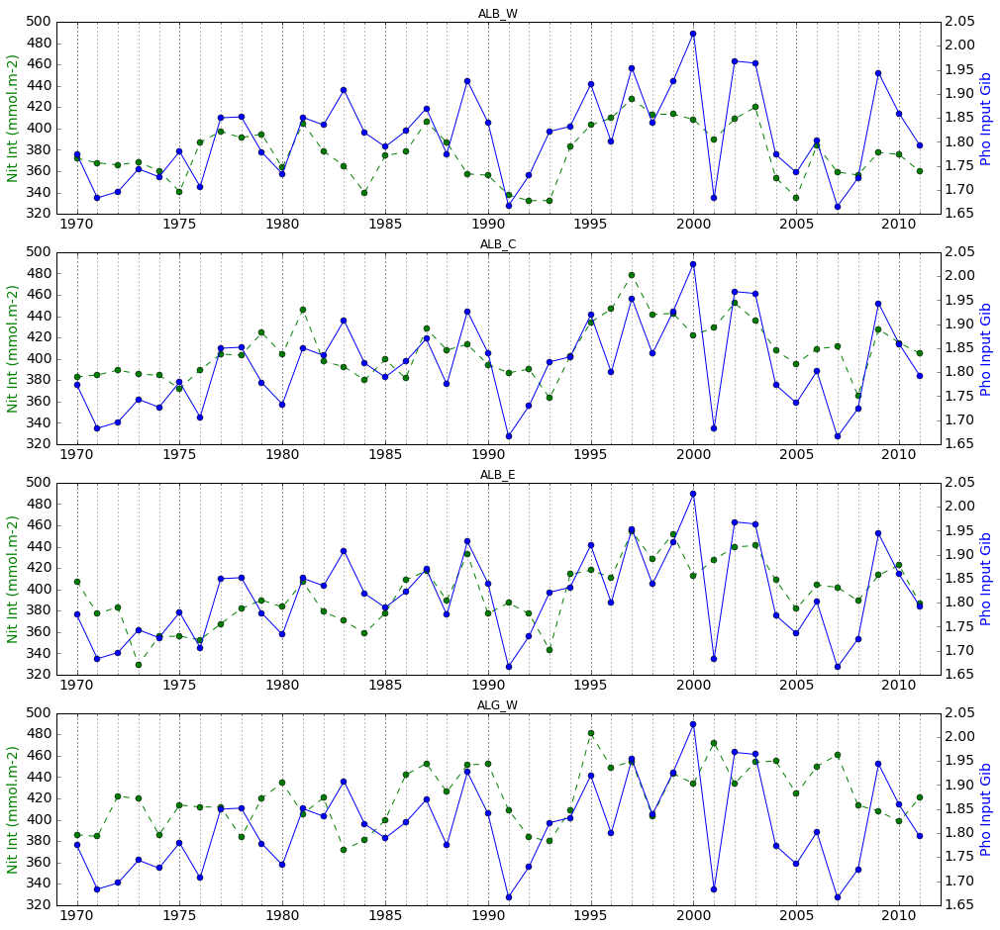

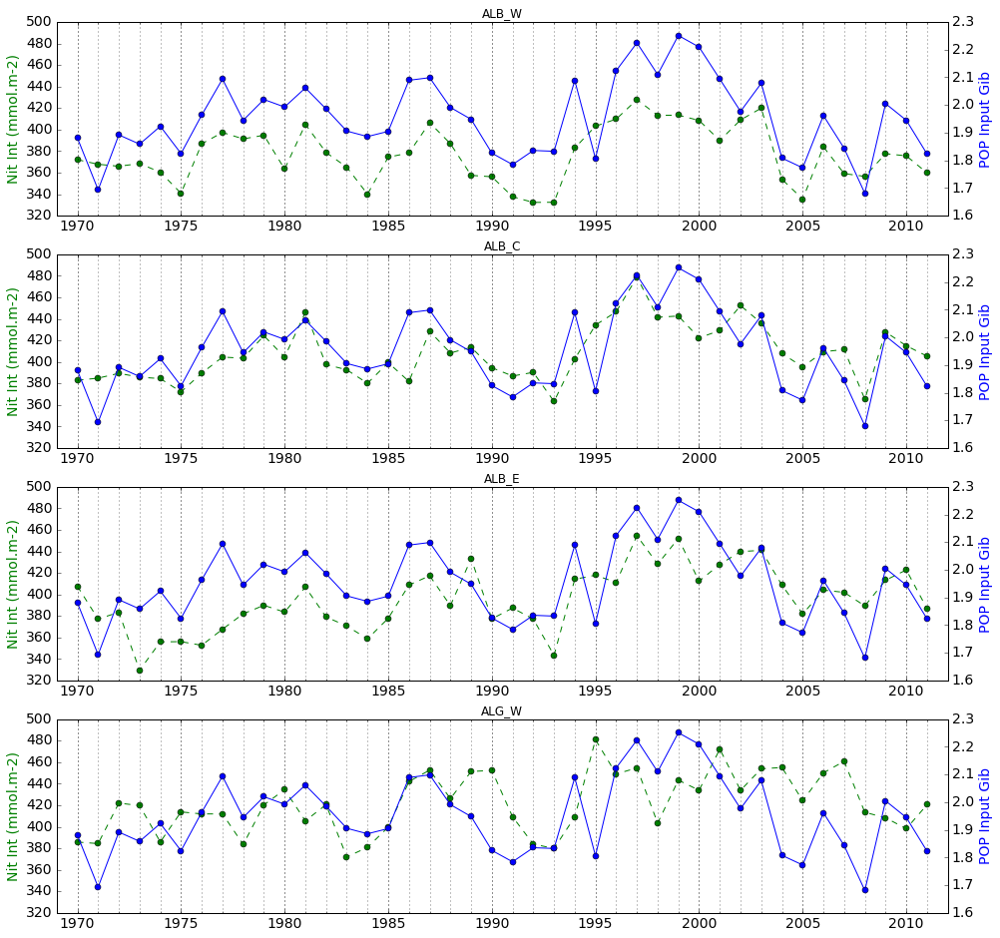

In [38]:
# 04/03 Same for all P inputs

nut_list = ['Pho', 'POP'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

In [44]:
np.shape(df_ALB_C)

(42, 10)

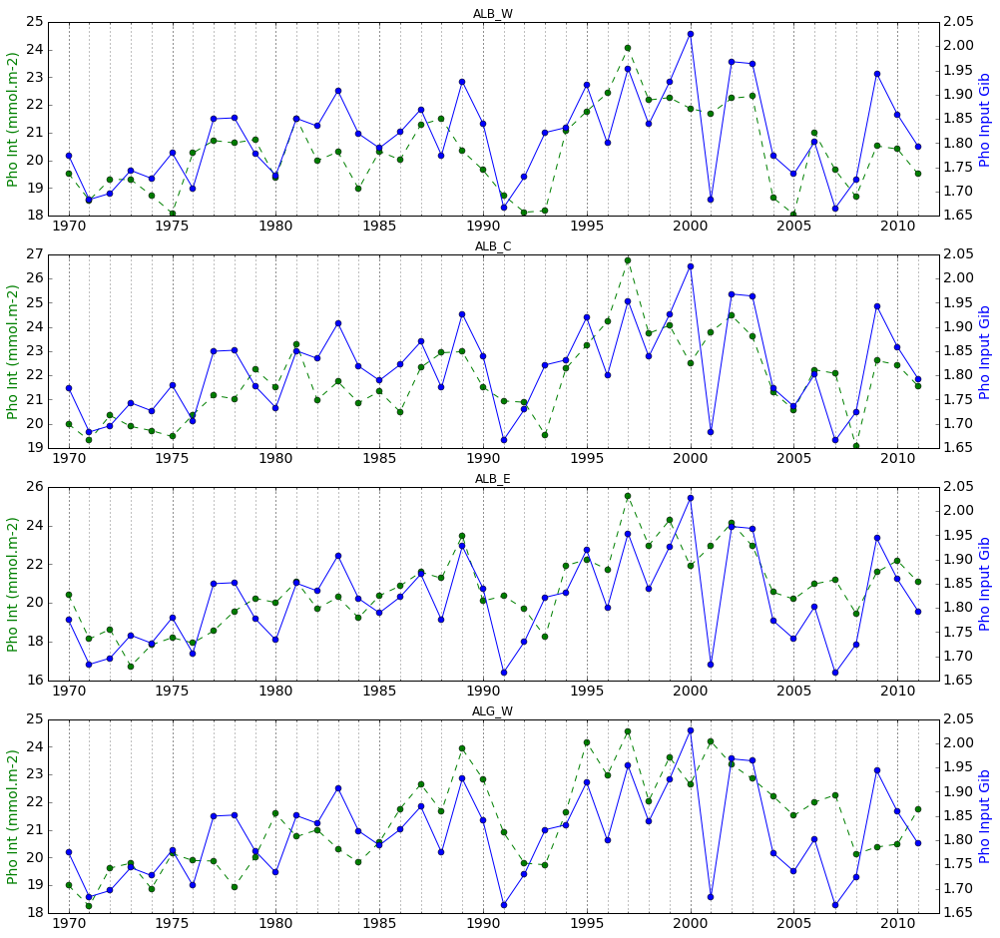

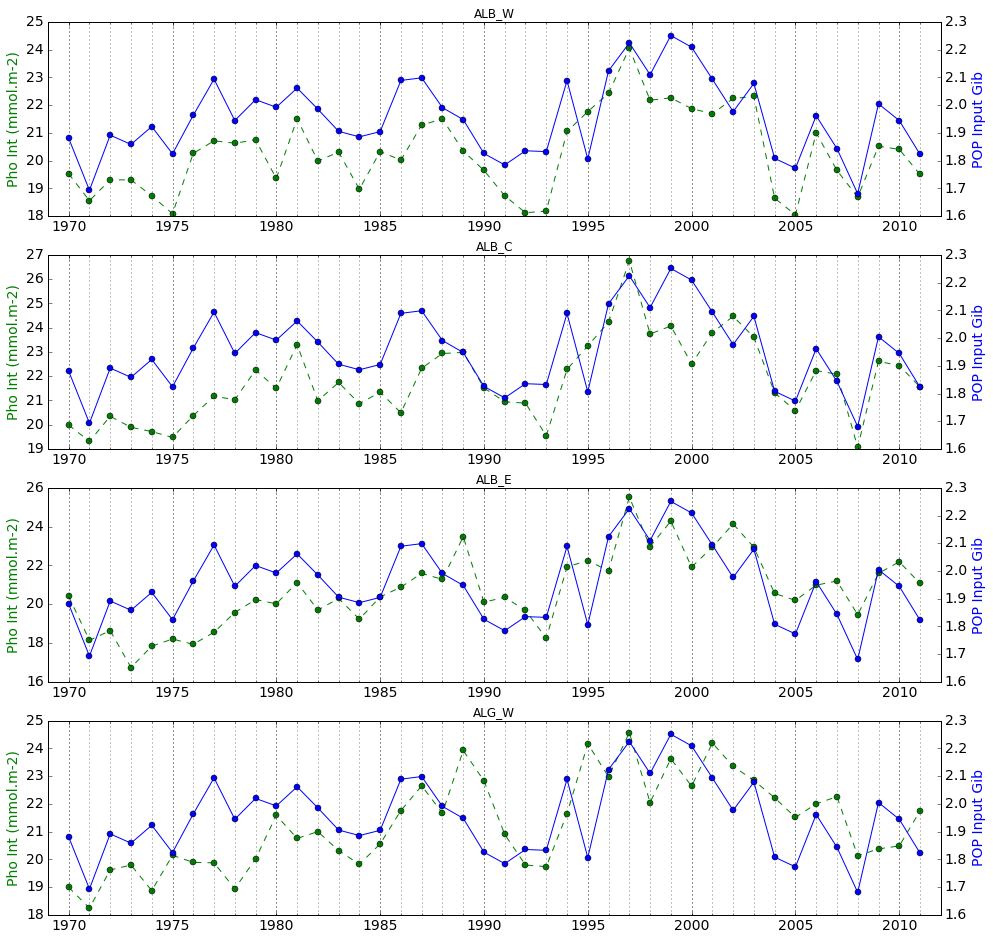

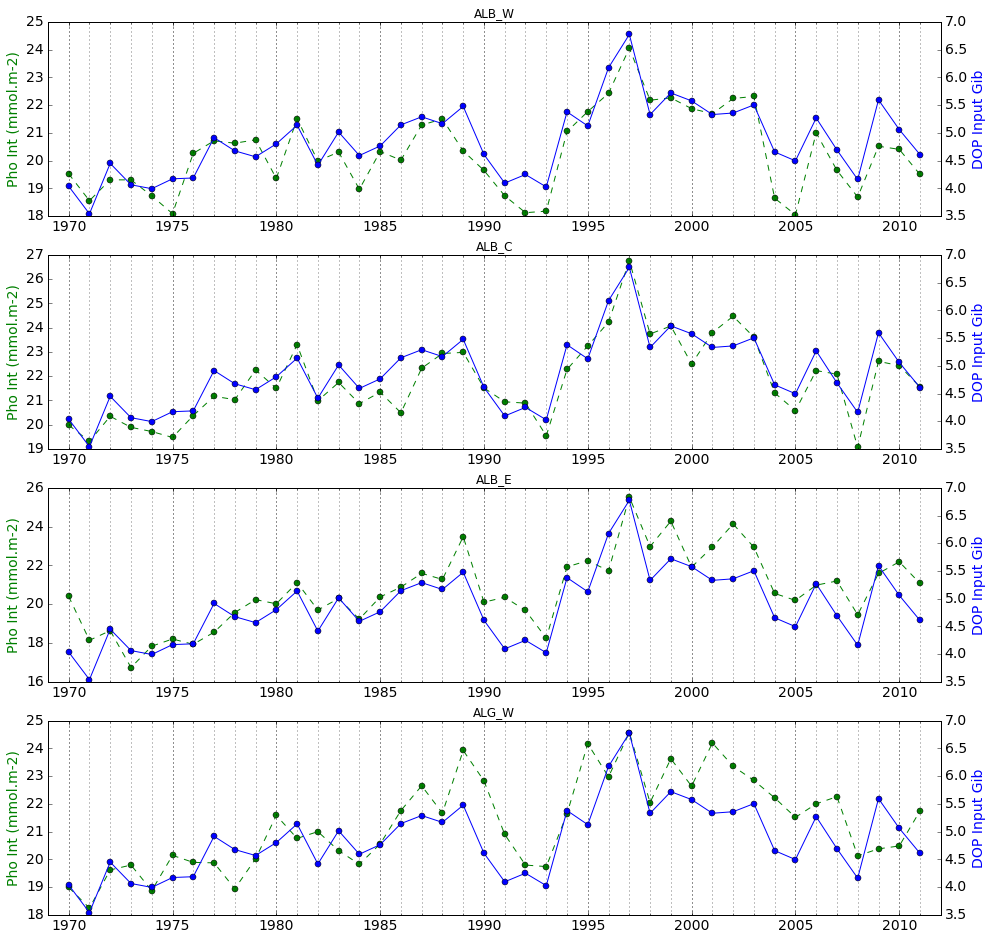

In [47]:
# 04/03 Same for all P inputs

nut_list = ['Pho', 'POP', 'DOP'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

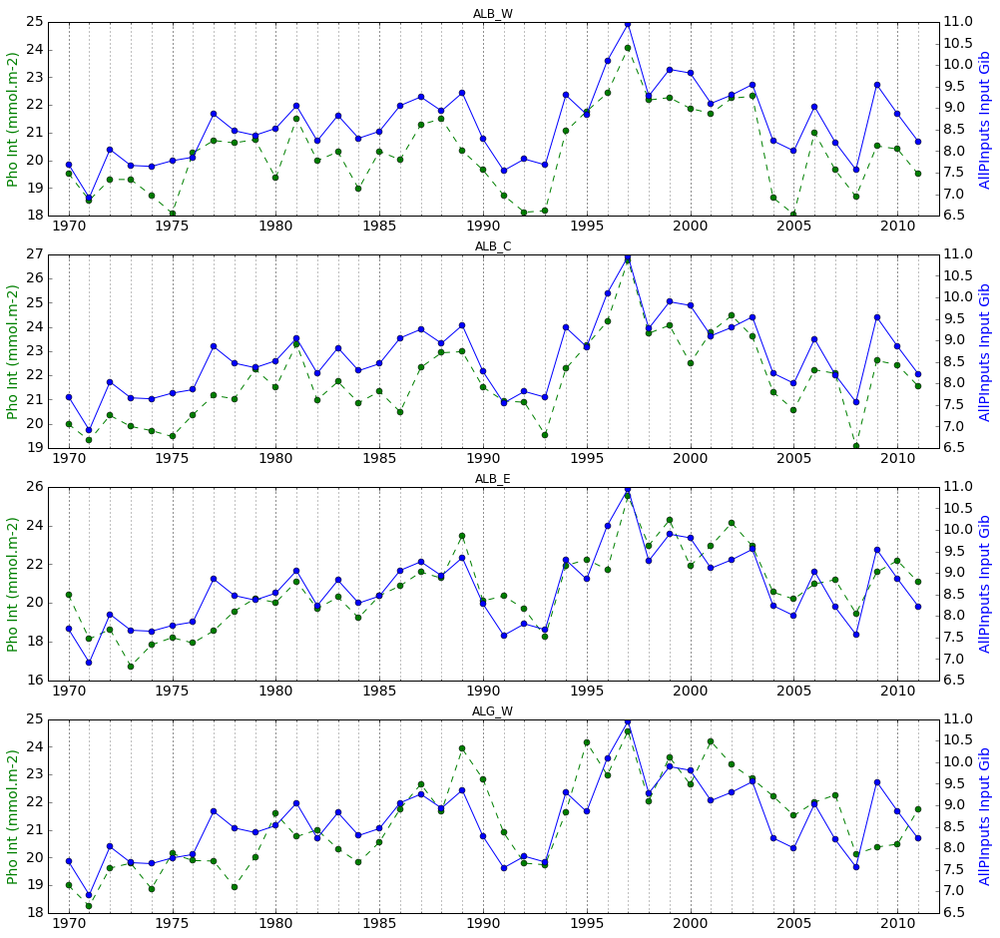

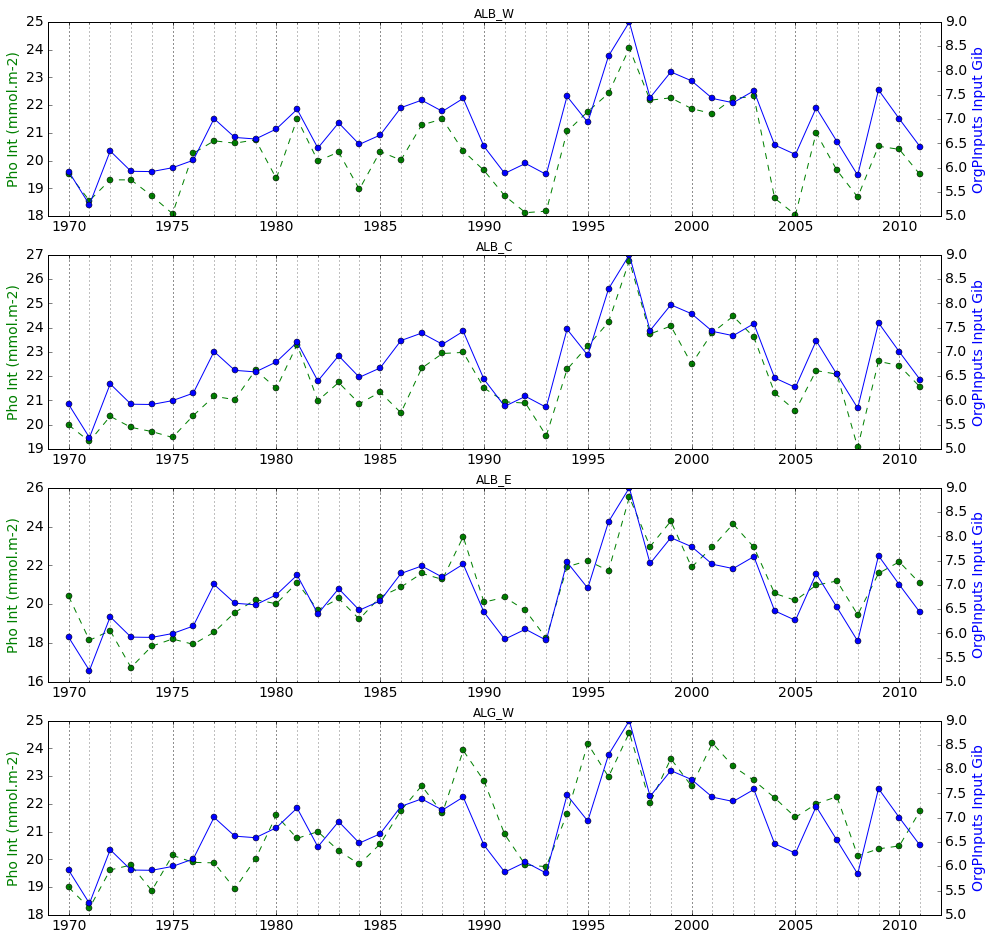

In [48]:
# 04/03 Same for all P inputs

AnnMean_AllPInputs = AnnMean_Pho+AnnMean_POP+AnnMean_DOP
AnnMean_OrgPInputs = AnnMean_POP+AnnMean_DOP
#AnnMean_InorgPInputs = AnnMean_Pho

nut_list = ['AllPInputs', 'OrgPInputs'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    #plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,8],'--o',color='g')
    plt.ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='b')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'b')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

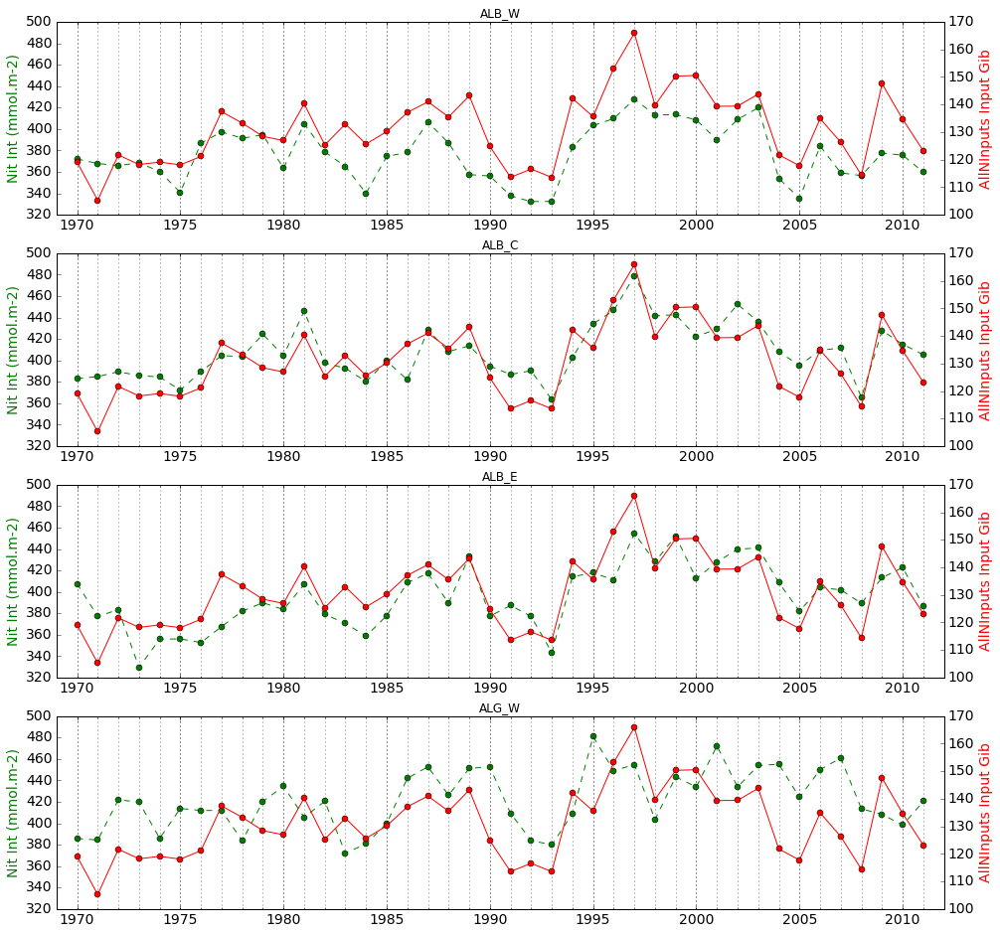

In [39]:
AnnMean_AllNInputs = AnnMean_Amm+AnnMean_DON+AnnMean_Nit+AnnMean_PON

# 04/03 Plots for all nuts inputs

nut_list = ['AllNInputs'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

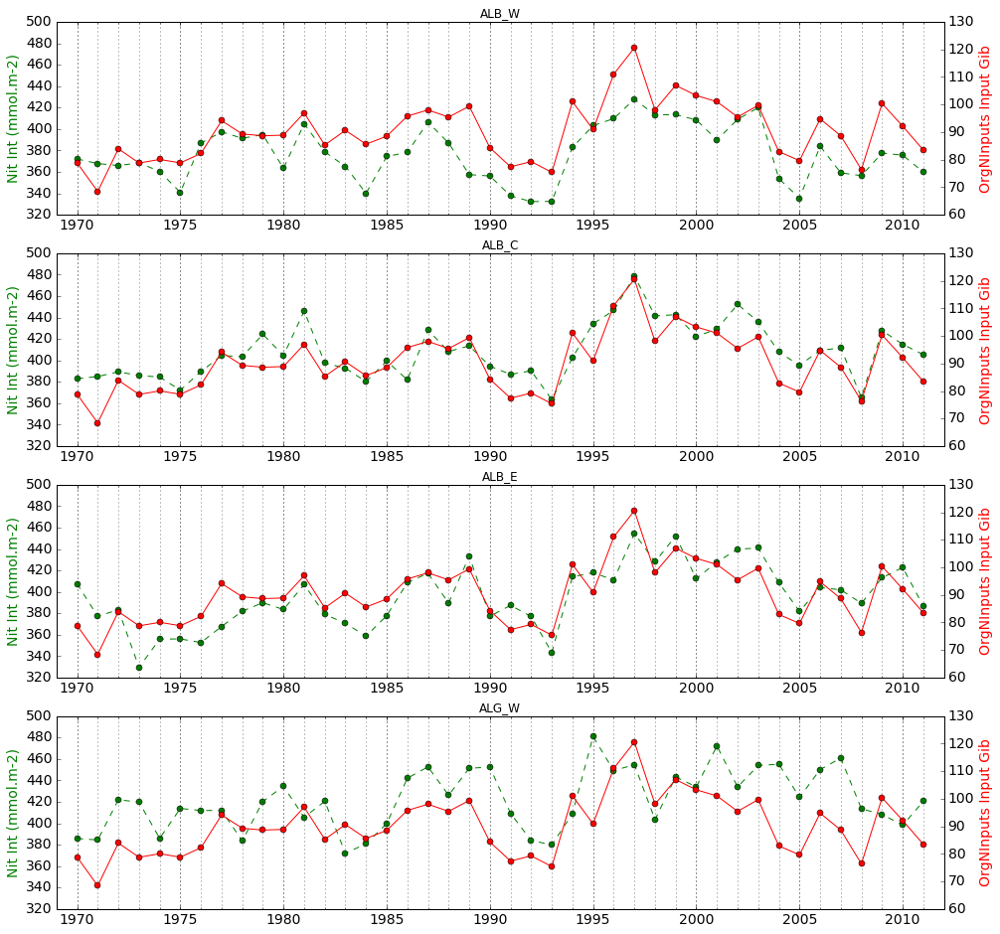

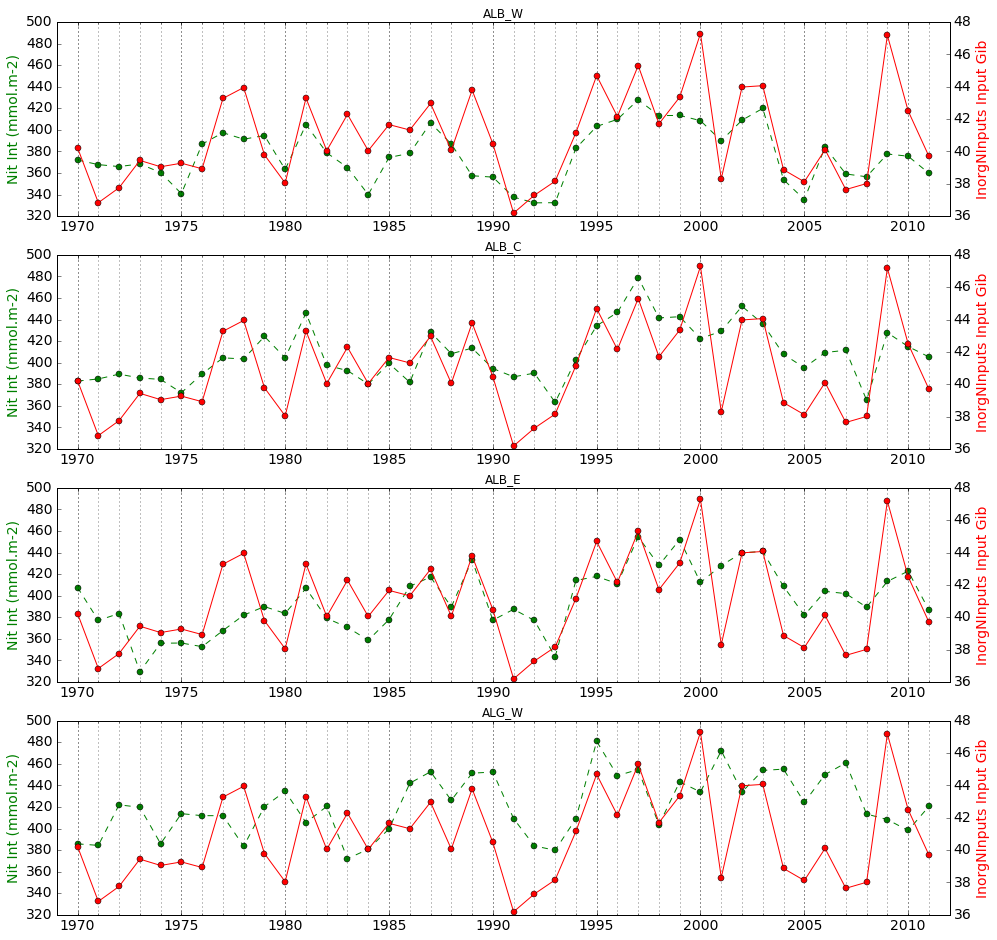

In [41]:
AnnMean_OrgNInputs = AnnMean_DON+AnnMean_PON
AnnMean_InorgNInputs = AnnMean_Amm+AnnMean_Nit


# 04/03 Plots for all nuts inputs

nut_list = ['OrgNInputs', 'InorgNInputs'] # , 'Pho', 'POP'

dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

for nut in nut_list:
    fig = plt.figure(figsize=(16,16))

    # ALB_W
    ax1 = fig.add_subplot(411)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    #plt.ylim([16,27])
    plt.grid(axis='x', which='both')
    plt.title('ALB_W')

    # ALB_C
    ax1 = fig.add_subplot(412)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_C')

    # ALB_E
    ax1 = fig.add_subplot(413)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALB_E')

    # ALG_W
    ax1 = fig.add_subplot(414)
    plt.grid(axis='x', which='both')
    ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
    plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.ylim([320,500])
    ax2 = ax1.twinx()
    ax2.plot(dates,-vars()['AnnMean_'+nut],'-o',color='r')
    ax2.set_ylabel(nut+" Input Gib", fontsize=14, color = 'r')
    plt.yticks(fontsize=14)
    plt.xticks(xticks_list,fontsize=14)
    plt.xlim(['1969-01-01', '2012-01-01'])
    plt.grid(axis='x', which='both')
    plt.title('ALG_W')

    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_'+nut+'_Input.png\',bbox_inches=\'tight\',format=\'png\')')

In [23]:
AnnMean_DON

array([-55.36179186, -47.46106323, -60.3471192 , -55.63713657,
       -55.97348661, -56.11194911, -57.67194556, -67.90202394,
       -65.0099606 , -63.23676469, -64.00269939, -71.12549805,
       -60.4970709 , -66.95406531, -62.08348609, -64.73690523,
       -69.6284454 , -71.86594799, -70.45814144, -74.85559294,
       -61.626418  , -55.17269219, -56.5349723 , -52.75475258,
       -74.77153207, -68.60490252, -84.28644335, -92.51488721,
       -71.7381685 , -78.51294783, -75.71138162, -74.57557836,
       -70.85036675, -73.77656138, -60.58174202, -57.7820817 ,
       -70.2858867 , -65.42777855, -55.52440071, -75.41156712,
       -67.93369819, -60.92396223])

In [16]:
np.shape(dates)
np.shape(AnnMean_Amm)

(42,)

In [18]:
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

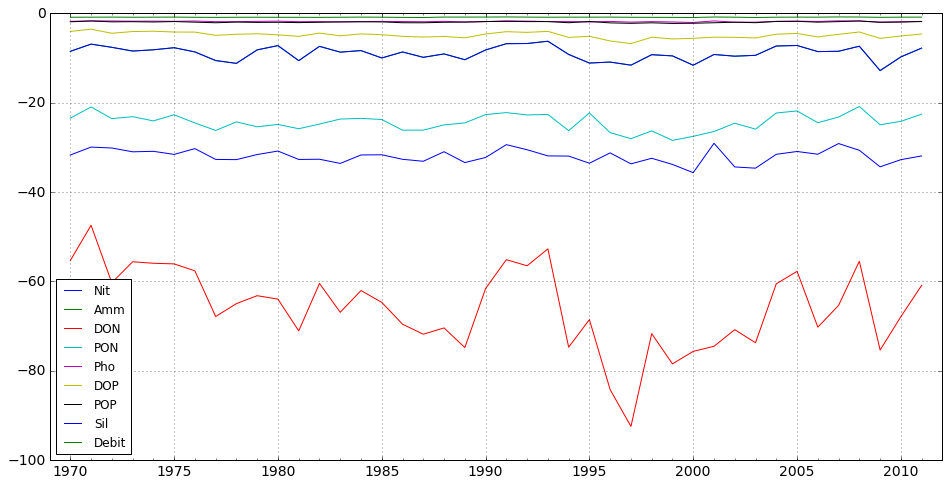

In [20]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

plt.plot(dates,AnnMean_Nit,label='Nit')
plt.plot(dates,AnnMean_Amm,label='Amm')
plt.plot(dates,AnnMean_DON,label='DON')
plt.plot(dates,AnnMean_PON,label='PON')
plt.plot(dates,AnnMean_Pho,label='Pho')
plt.plot(dates,AnnMean_DOP,label='DOP')
plt.plot(dates,AnnMean_POP,label='POP')
plt.plot(dates,AnnMean_Amm,label='Sil')
plt.plot(dates,AnnMean_Debit,label='Debit')

#plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')
    
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_InputGibsw_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

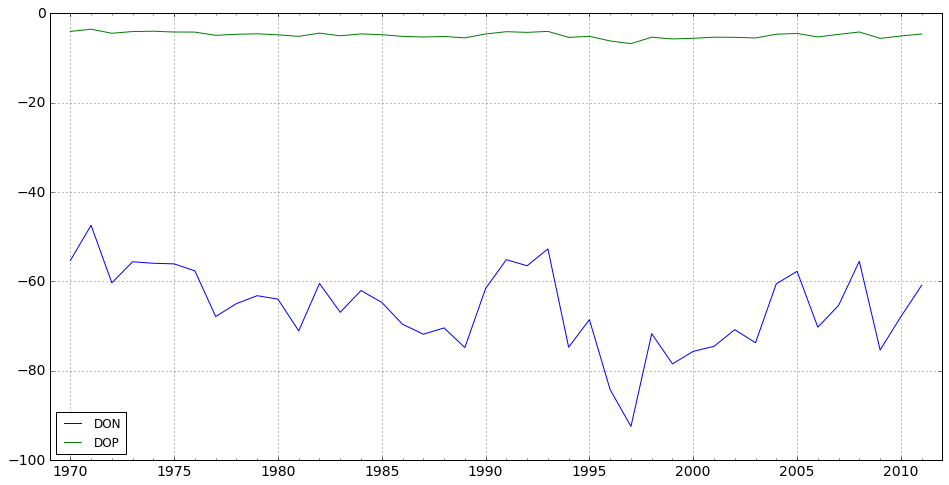

In [25]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

plt.plot(dates,AnnMean_DON,label='DON')
plt.plot(dates,AnnMean_DOP,label='DOP')

#plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')
    
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_InputGibsw_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

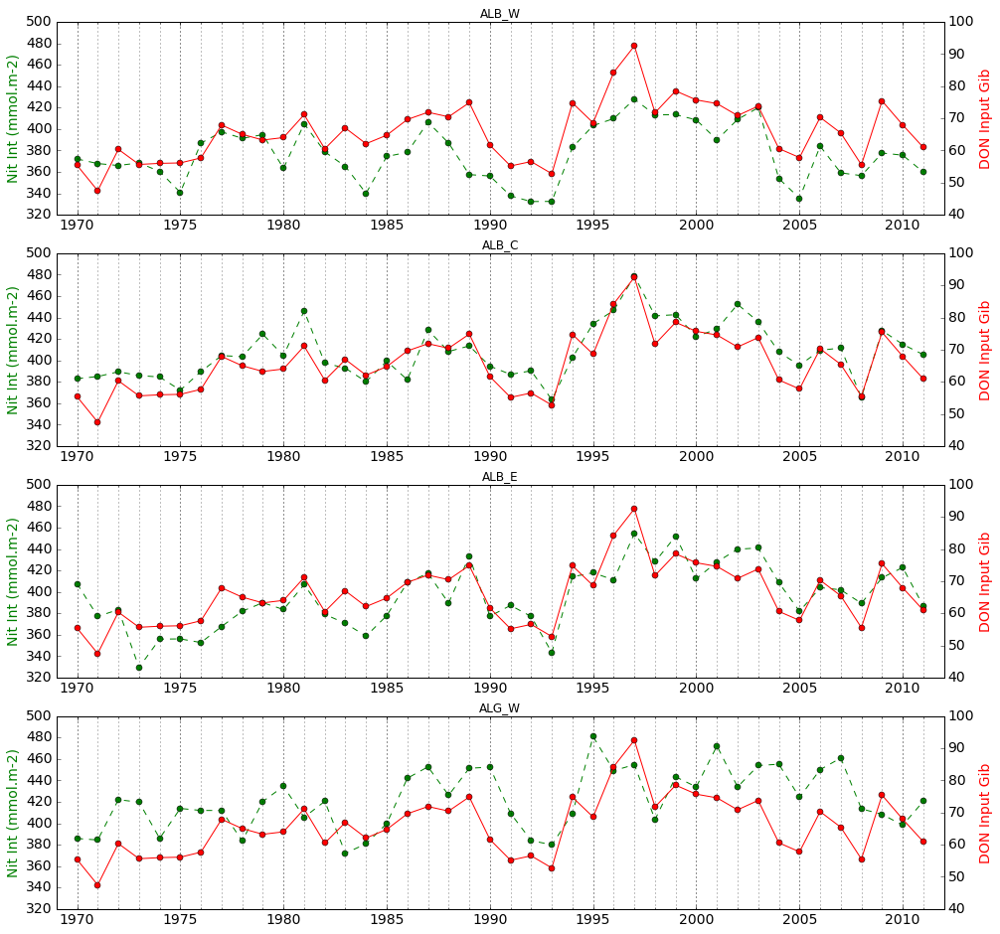

In [49]:
# 03/03

# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###
dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,16))
    
# ALB_W
ax1 = fig.add_subplot(411)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_DON,'-o',color='r')
#ax2.plot(dates,df_ALB_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_W[:,9],'-o',color='b')
ax2.set_ylabel("DON Input Gib", fontsize=14, color = 'r')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_W')
    
# ALB_C
ax1 = fig.add_subplot(412)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_C[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_C[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_DON,'-o',color='r')
ax2.set_ylabel("DON Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALB_C[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_C[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALB_C')
    
# ALB_E
ax1 = fig.add_subplot(413)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_E[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_E[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_DON,'-o',color='r')
ax2.set_ylabel("DON Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALB_E[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_E[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALB_E')

# ALG_W
ax1 = fig.add_subplot(414)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALG_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALG_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_DON,'-o',color='r')
ax2.set_ylabel("DON Input Gib", fontsize=14, color = 'r')
#ax2.plot(dates,df_ALG_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALG_W[:,9],'-o',color='b')
#ax2.set_ylabel("Pho Int (mmol.m-2)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
plt.title('ALG_W')

eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/GIB_INPUT/TRAJET_VS_DON_Input.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
# 03/03

# 27.02 On ajoute nit200 et pho_int pour checker si influence Gibraltar
### On va commencer par une seule région ###
dates = np.arange(1970,2012,1)
dates = pd.to_datetime(dates, format = '%Y')
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,16))
    
# ALB_W
ax1 = fig.add_subplot(411)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB_W[:,6],'--o',color='g')
#ax1.plot(dates,df_ALB_W[:,7],'-o',color='g')
plt.ylabel("Nit Int (mmol.m-2)", fontsize=14, color = 'g')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.ylim([320,500])
ax2 = ax1.twinx()
ax2.plot(dates,-AnnMean_DON,'--o',color='b')
#ax2.plot(dates,df_ALB_W[:,8],'--o',color='b')
#ax2.plot(dates,df_ALB_W[:,9],'-o',color='b')
ax2.set_ylabel("DON Input Gib", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.ylim([16,27])
plt.grid(axis='x', which='both')
plt.title('ALB_W')

In [22]:
np.shape(AnnMean_DON)
np.shape(dates)

(42,)

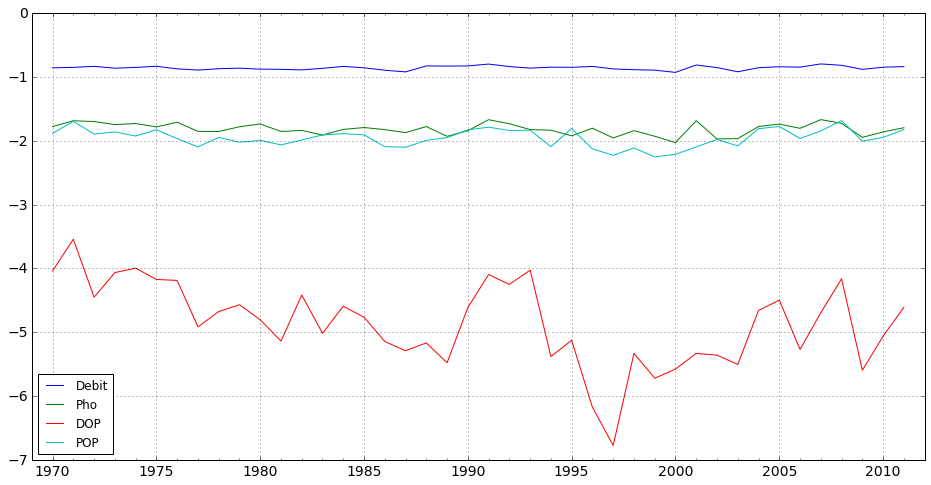

In [23]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

plt.plot(dates,AnnMean_Debit,label='Debit')
plt.plot(dates,AnnMean_Pho,label='Pho')
plt.plot(dates,AnnMean_DOP,label='DOP')
plt.plot(dates,AnnMean_POP,label='POP')

#plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/DEBITS/Debits_P.png\',bbox_inches=\'tight\',format=\'png\')')

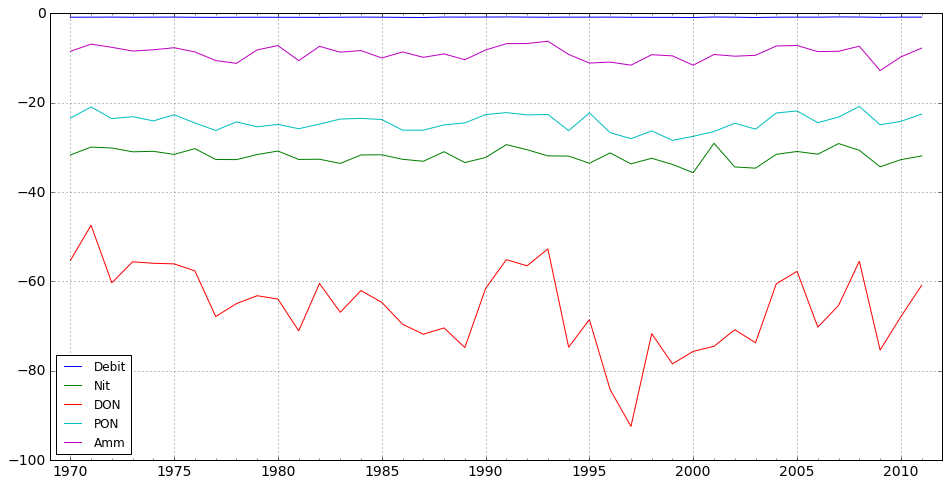

In [26]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

plt.plot(dates,AnnMean_Debit,label='Debit')
plt.plot(dates,AnnMean_Nit,label='Nit')
plt.plot(dates,AnnMean_DON,label='DON')
plt.plot(dates,AnnMean_PON,label='PON')
plt.plot(dates,AnnMean_Amm,label='Amm')

#plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/DEBITS/Debits_N.png\',bbox_inches=\'tight\',format=\'png\')')

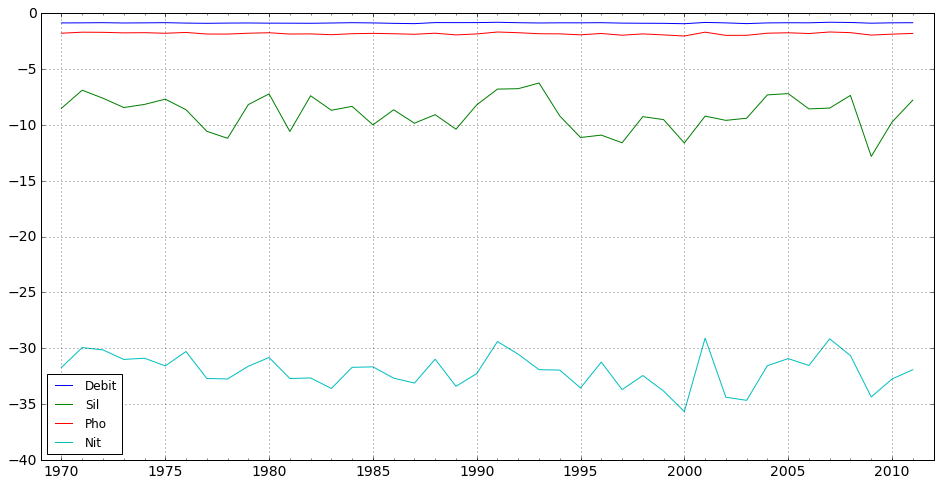

In [29]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

plt.plot(dates,AnnMean_Debit,label='Debit')
plt.plot(dates,AnnMean_Amm,label='Sil')
plt.plot(dates,AnnMean_Pho,label='Pho')
plt.plot(dates,AnnMean_Nit,label='Nit')

#plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid()
plt.legend(loc='best')
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/DEBITS/Debits_SiNitPho.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### dev following (to clean)

In [12]:
test = pd.read_table('./debitnew/debitbio_section_GibraltarNit',sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                                                              'debssw','debiw','debdw'])

In [13]:
test.head()

,time,debit,debpos,debneg,debsw,debssw,debiw,debdw
0,19700620,194.842575,213.096012,-18.253437,-13.666178,51.889743,156.619009,0.0
1,19700625,151.296148,175.565234,-24.269086,-18.438723,43.300892,126.433979,0.0
2,19700630,153.705719,176.172661,-22.466942,-21.972775,44.375166,131.303327,0.0
3,19700705,153.392666,178.641032,-25.248366,-24.248181,41.407289,136.233558,0.0
4,19700710,165.814690,188.952701,-23.138012,-18.553684,41.932033,142.436341,0.0


In [14]:
test['date'] = pd.to_datetime(test['time'], format="%Y%m%d")
test['yy'] = pd.DatetimeIndex(test['date']).year
test['mm'] = pd.DatetimeIndex(test['date']).month
test.head()

,time,debit,debpos,debneg,debsw,debssw,debiw,debdw,date,yy,mm
0,19700620,194.842575,213.096012,-18.253437,-13.666178,51.889743,156.619009,0.0,1970-06-20,1970,6
1,19700625,151.296148,175.565234,-24.269086,-18.438723,43.300892,126.433979,0.0,1970-06-25,1970,6
2,19700630,153.705719,176.172661,-22.466942,-21.972775,44.375166,131.303327,0.0,1970-06-30,1970,6
3,19700705,153.392666,178.641032,-25.248366,-24.248181,41.407289,136.233558,0.0,1970-07-05,1970,7
4,19700710,165.814690,188.952701,-23.138012,-18.553684,41.932033,142.436341,0.0,1970-07-10,1970,7


In [153]:
len(test)

3140

In [15]:
yy_corr = np.zeros([len(test)])
yy_corr[:] = np.nan
test['yy_corr'] = yy_corr 
    
for o in np.arange(0, len(test)):
    if test['mm'][o] >= 10:
        test['yy_corr'][o] = test['yy'][o]
    else:
        test['yy_corr'][o] = test['yy'][o]-1

print 'End of Cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


End of Cell


In [17]:
o
test

,time,debit,debpos,debneg,debsw,debssw,debiw,debdw,date,yy,mm,yy_corr
0,19700620,194.842575,213.096012,-18.253437,-13.666178,51.889743,156.619009,0.0,1970-06-20,1970,6,1969.0
1,19700625,151.296148,175.565234,-24.269086,-18.438723,43.300892,126.433979,0.0,1970-06-25,1970,6,1969.0
2,19700630,153.705719,176.172661,-22.466942,-21.972775,44.375166,131.303327,0.0,1970-06-30,1970,6,1969.0
3,19700705,153.392666,178.641032,-25.248366,-24.248181,41.407289,136.233558,0.0,1970-07-05,1970,7,1969.0
4,19700710,165.814690,188.952701,-23.138012,-18.553684,41.932033,142.436341,0.0,1970-07-10,1970,7,1969.0
5,19700715,158.027999,177.452193,-19.424194,-18.161076,43.243331,132.945744,0.0,1970-07-15,1970,7,1969.0
6,19700720,141.129715,169.324052,-28.194337,-28.194337,41.415551,127.908500,0.0,1970-07-20,1970,7,1969.0
7,19700725,154.202348,182.079241,-27.876894,-25.876466,41.012766,139.066047,0.0,1970-07-25,1970,7,1969.0
8,19700730,164.631903,184.031066,-19.399163,-17.910642,42.396624,140.145921,0.0,1970-07-30,1970,7,1969.0
9,19700804,153.122414,181.388688,-28.266275,-28.266275,39.173471,142.215217,0.0,1970-08-04,1970,8,1969.0


In [18]:
year_list

NameError: name 'year_list' is not defined

In [21]:
year_list = np.arange(1970,2012)

count = 0
test_AnnMean = np.zeros([len(df_ALB)]) # ou len year_list pareil

for y in year_list:
    test_AnnMean[count] =  test.groupby('yy_corr')['debsw'].mean()[y]
    count += 1

(1969, 2012)

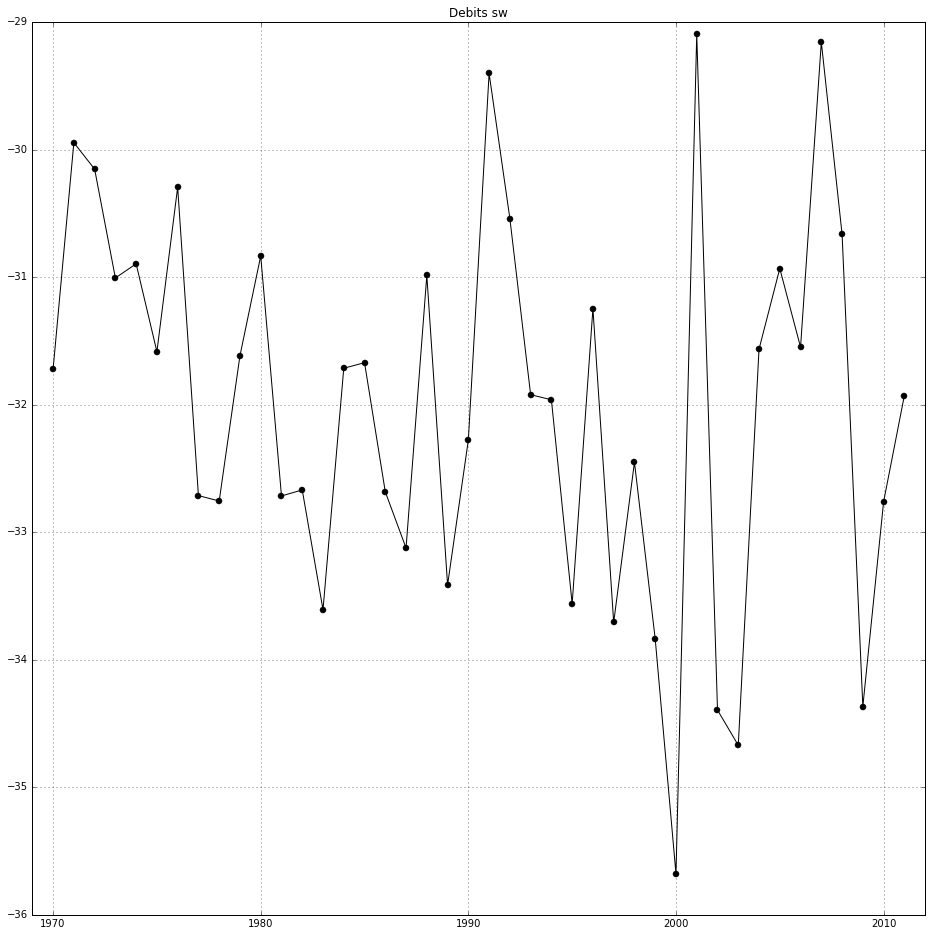

In [27]:
# figure  
plt.figure(figsize=(16,16))
plt.plot(year_list, test_AnnMean, '-ok')
plt.grid(True)
plt.title('Debits sw')
plt.xlim([1969,2012])

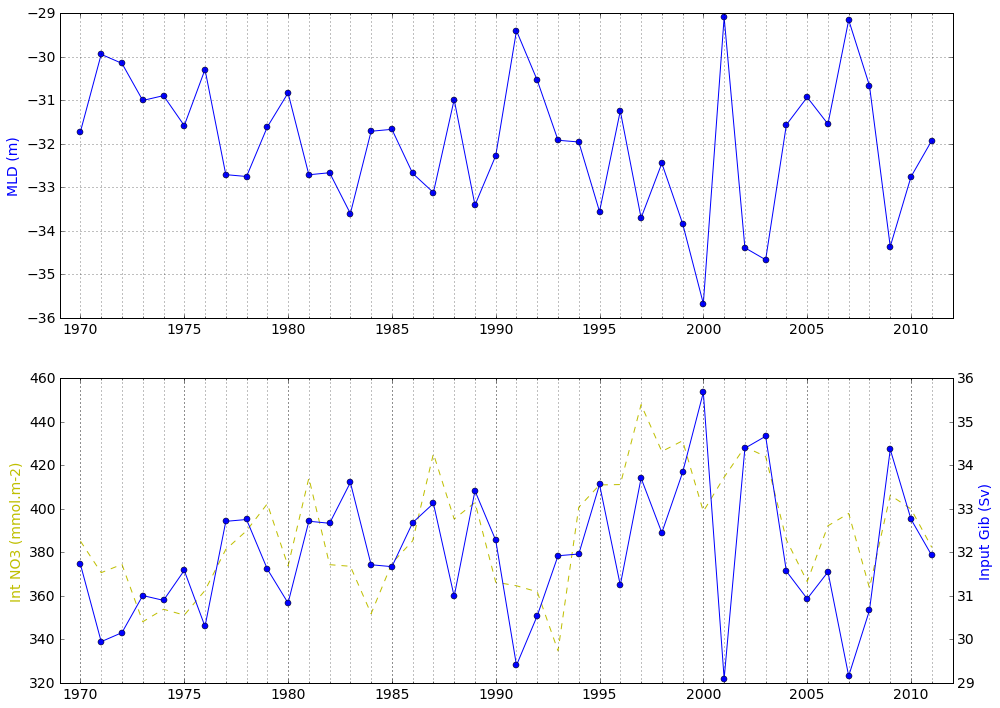

In [36]:
### On va commencer par une seule région ###
xticks_list = np.arange(1970,2011,5)
xticks_list = pd.to_datetime(xticks_list, format='%Y')

fig = plt.figure(figsize=(16,12))
spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
# chl_int x MLD
ax1 = fig.add_subplot(212)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
#ax1.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,-test_AnnMean,'-o',color='b', label='mld')
#ax2.plot(dates,df_ALB[:,4],'--',color='b')
#ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax2.set_ylabel("Input Gib", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
#plt.grid()
    
# MLD x Nit150
ax1 = fig.add_subplot(211)
plt.grid(axis='x', which='both')
ax1.plot(dates,test_AnnMean,'-o',color='b', label='mld')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.ylabel("MLD (m)", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
#ax2 = ax1.twinx()
#ax2.plot(dates,df_ALB[:,6],'--',color='y', label='nit150')
#ax2.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
#ax2.set_ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
#plt.yticks(fontsize=14)
#plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
#plt.grid(axis='x', which='both')
plt.grid()
    
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_ALBALG_MLD_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

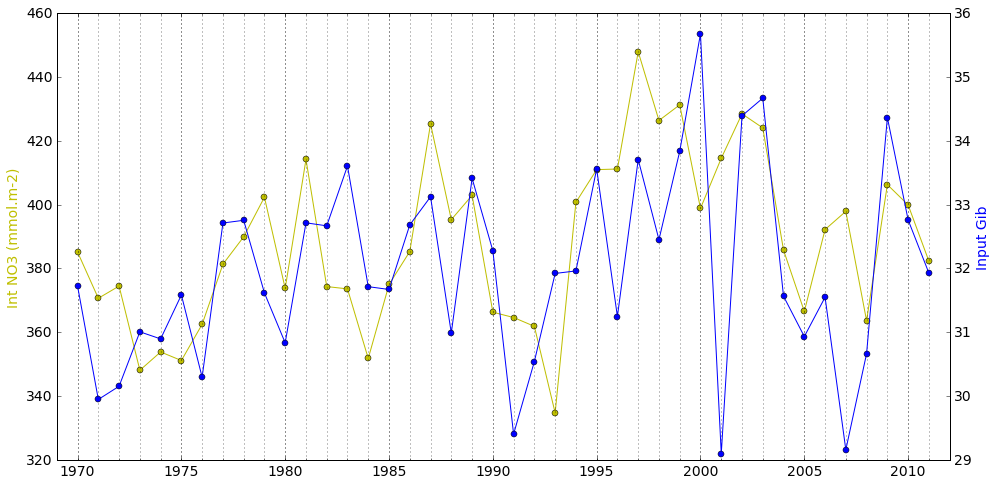

In [42]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

# chl_int x MLD
ax1 = fig.add_subplot(111)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,6],'-o',color='y', label='nit150')
#ax1.plot(dates,df_ALG[:,6],'-o',color='y', label='nit150')
plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,-test_AnnMean,'-o',color='b', label='mld')
#ax2.plot(dates,df_ALB[:,4],'--',color='b')
#ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax2.set_ylabel("Input Gib", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
#plt.grid()
    
eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_InputGibsw_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

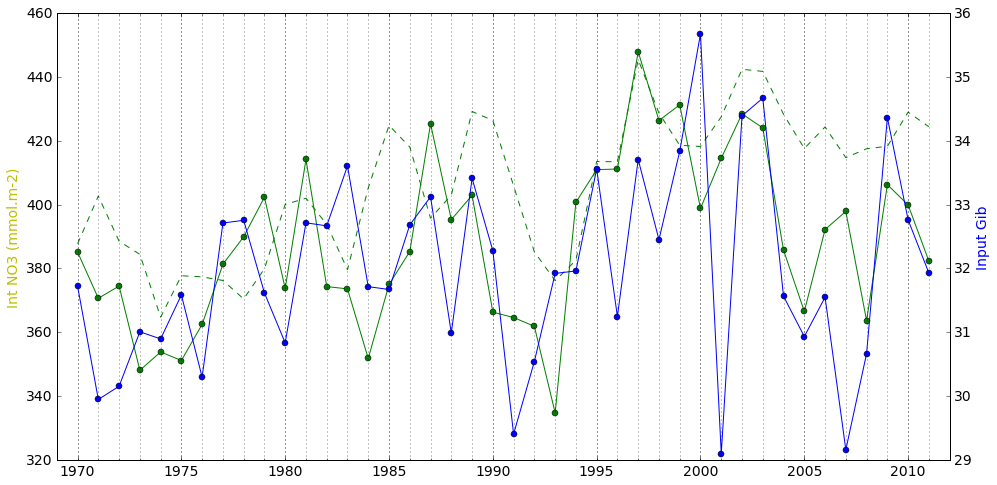

In [60]:
### On va commencer par une seule région ###

fig = plt.figure(figsize=(16,8))

# chl_int x MLD
ax1 = fig.add_subplot(111)
plt.grid(axis='x', which='both')
ax1.plot(dates,df_ALB[:,6],'-o',color='g', label='nit150')
ax1.plot(dates,df_ALG[:,6],'--',color='g', label='nit150')
plt.ylabel("Int NO3 (mmol.m-2)", fontsize=14, color = 'y')
ax = plt.gca()
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
ax2 = ax1.twinx()
ax2.plot(dates,-test_AnnMean,'-o',color='b', label='mld')
#ax2.plot(dates,df_ALB[:,4],'--',color='b')
#ax2.plot(dates,df_ALG[:,4],'-o',color='b', label='mld')
ax2.set_ylabel("Input Gib", fontsize=14, color = 'b')
plt.yticks(fontsize=14)
plt.xticks(xticks_list,fontsize=14)
plt.xlim(['1969-01-01', '2012-01-01'])
plt.grid(axis='x', which='both')
#plt.grid()
    
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/FEV2019_FIGS/REGIONS/2y_TS_IAV_'+basin+'_InputGibsw_NitInt.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
# Few stats

In [51]:
import scipy.stats as scp

In [53]:
scp.pearsonr(np.arange(0,10), np.arange(1,11))

(1.0, 0.0)

In [54]:
scp.spearmanr(np.arange(0,10), np.arange(1,11))

SpearmanrResult(correlation=0.99999999999999989, pvalue=6.646897422032013e-64)

In [56]:
# Test entre IntNO3 ALB et ALG

scp.spearmanr(df_ALB[:,6],df_ALG[:,6]) # Corrélation significative entre nos 2 séries

SpearmanrResult(correlation=0.55951705696458953, pvalue=0.00011705220651445848)

In [61]:
# Comparaison avec Pearson

scp.pearsonr(df_ALB[:,6],df_ALG[:,6]) # Corrélation significative entre nos 2 séries

(0.57136340860166268, 7.7503791790007549e-05)

In [59]:
# Test entre IntNO3 ALB et Input Nit Gibraltar

scp.spearmanr(df_ALB[:,6],-test_AnnMean) # Corrélation significative entre nos 2 séries

SpearmanrResult(correlation=0.54071793209626451, pvalue=0.00021827530014701958)

In [62]:
# Comparaison avec Pearson 

scp.pearsonr(df_ALB[:,6],-test_AnnMean)

(0.49552573172157466, 0.00084771494297713329)

In [ ]:
###################

In [3]:
# Loading MLD from Caroline's file
file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'

mld_caro = read_csv(file_path+'result_mld_alldays', sep='\s+',names=['y','m','d','NWE','SWE','ION','LEV'])

for region in region_list:
    vars()['mld_caro_'+region] = pd.DataFrame(mld_caro[region])
    
np.shape(mld_caro_NWE) # (2445, 1)
#mld_caro_NWE

(2445, 1)

In [4]:
### MLD ###
#file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

for region in region_list:
    full_list2 = os.listdir(file_path)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        if fnmatch.fnmatch(our_file, 'MLD_Mean_' + region + '.csv'):  # modified to try on some files
            vars()['MLD_csv_'+region] = read_csv(file_path+our_file)
            vars()['MLD_Mean_' + region] = pd.DataFrame(vars()['MLD_csv_'+region]['var'])
            vars()['MLD_Mean_' + region]['date'] = vars()['MLD_csv_'+region]['date']
            vars()['MLD_Mean_' + region]['date'] = pd.to_datetime(vars()['MLD_Mean_' + region]['date'],format='%Y-%m-%d')
            vars()['MLD_Mean_' + region]['yy'] = pd.DatetimeIndex(vars()['MLD_Mean_' + region]['date']).year
            
np.shape(MLD_Mean_ION) # (2445, 3)

(2445, 3)

In [5]:
### 22/06 Loading Stratif Index

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/STRATIF_INDEX/'

for region in region_list:
    print 'Region:', region
    full_list2 = os.listdir(file_path)
    full_list2.sort()

    short_list = list()
    
    for our_file in full_list2:
        if fnmatch.fnmatch(our_file, 'stratif_moy_' + region + '*.dat'):  # modified to try on some files
            short_list = np.append(short_list, our_file)
            
    print short_list
    print ' '
    
    if len(short_list) == 1:
        vars()['SI_'+region] = pd.read_table(file_path+our_file, delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        
    else:
        print 'short list > 1 file, short_list dim shape =', np.shape(short_list)
        print ' '
        first_file_SI = pd.read_table(file_path+short_list[0], delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        second_file_SI = pd.read_table(file_path+short_list[1], delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        vars()['SI_'+region] = pd.DataFrame(second_file_SI['date'])
        
        # Temporal array to compute the weighted SI
        temp_SI = np.zeros(len(second_file_SI))
        temp_SI[:] = np.nan
        temp_SI = pd.DataFrame(temp_SI, columns= ['SI'])
        
        # Actually computing it
        for i in np.arange(0,len(second_file_SI)):
            temp_SI['SI'][i] = ((first_file_SI['SI'][i]*first_file_SI['nb_pts'][i])+\
                                (second_file_SI['SI'][i]*second_file_SI['nb_pts'][i]))/\
                                (first_file_SI['nb_pts'][i]+second_file_SI['nb_pts'][i])
                
        # Putting the data in the right DataFrame        
        vars()['SI_'+region]['SI'] = temp_SI['SI']
        
print 'END of cell'

Region: NWE
['stratif_moy_NWE.dat']
 
Region: SWE
['stratif_moy_SWE.dat']
 
Region: ION
['stratif_moy_ION1.dat' 'stratif_moy_ION2.dat']
 
short list > 1 file, short_list dim shape = (2,)
 
Region: LEV
['stratif_moy_LEV1.dat' 'stratif_moy_LEV2.dat']
 
short list > 1 file, short_list dim shape = (2,)
 
END of cell


In [59]:
region_list

['NWE', 'SWE', 'ION', 'LEV']

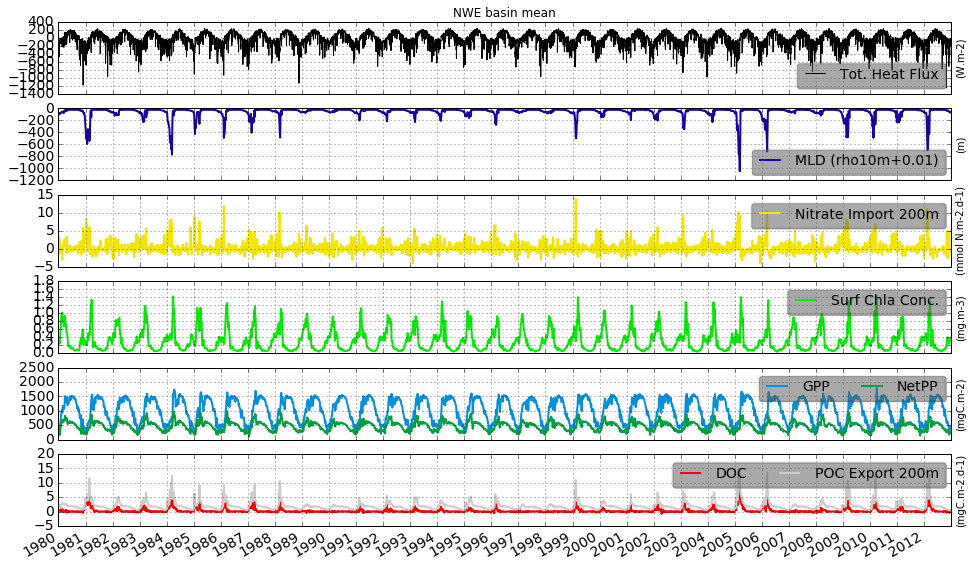

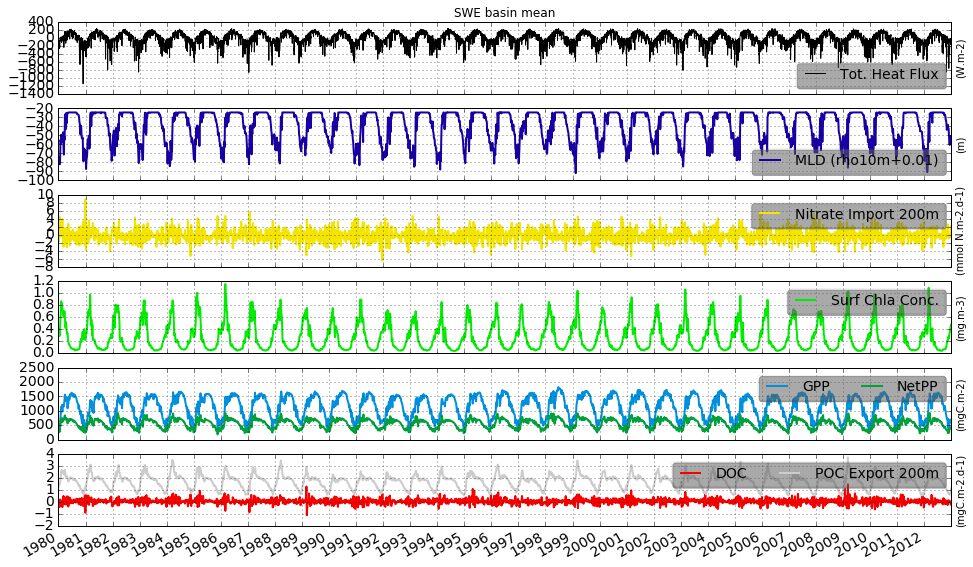

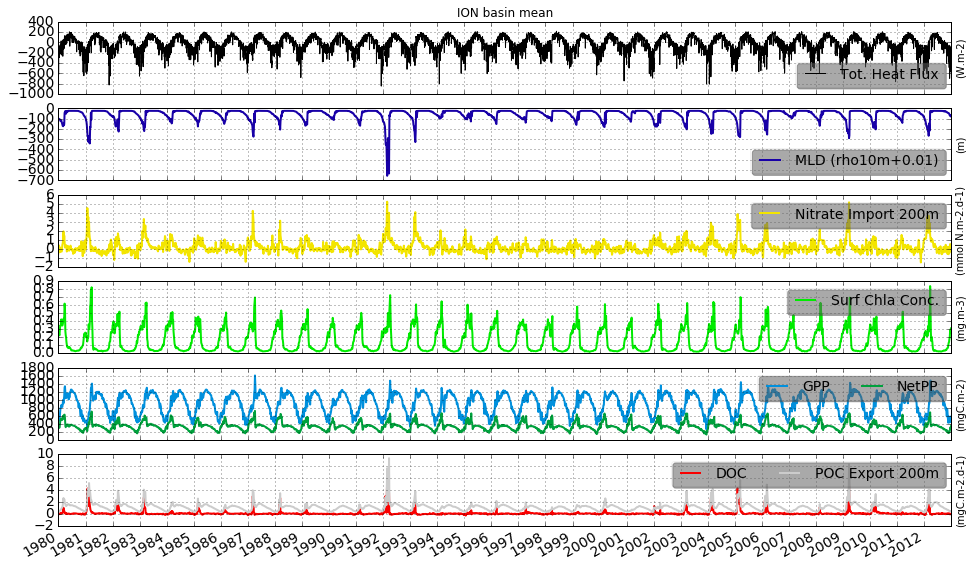

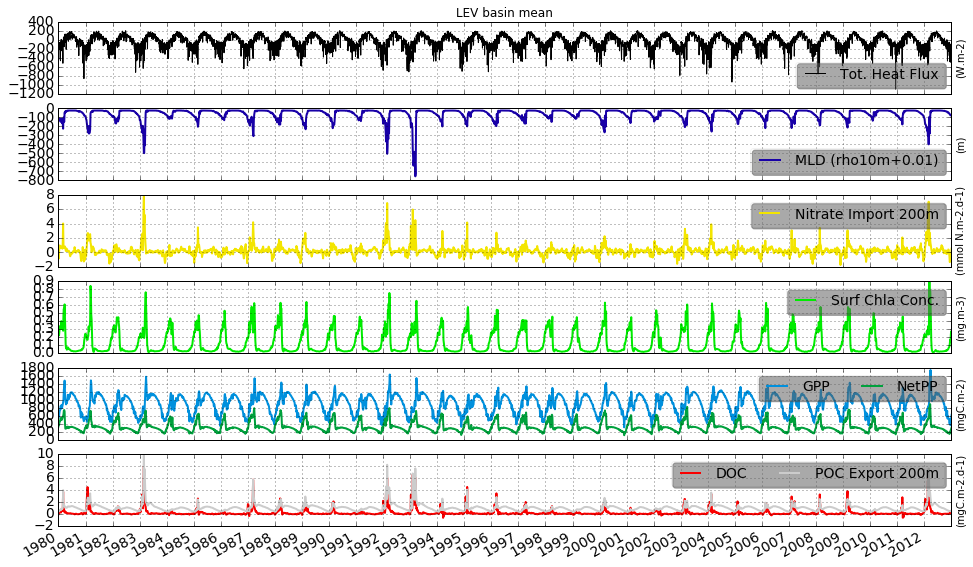

In [57]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/'+basin+'_TS_Interann_Variab'+'.png\',bbox_inches=\'tight\',format=\'png\')')

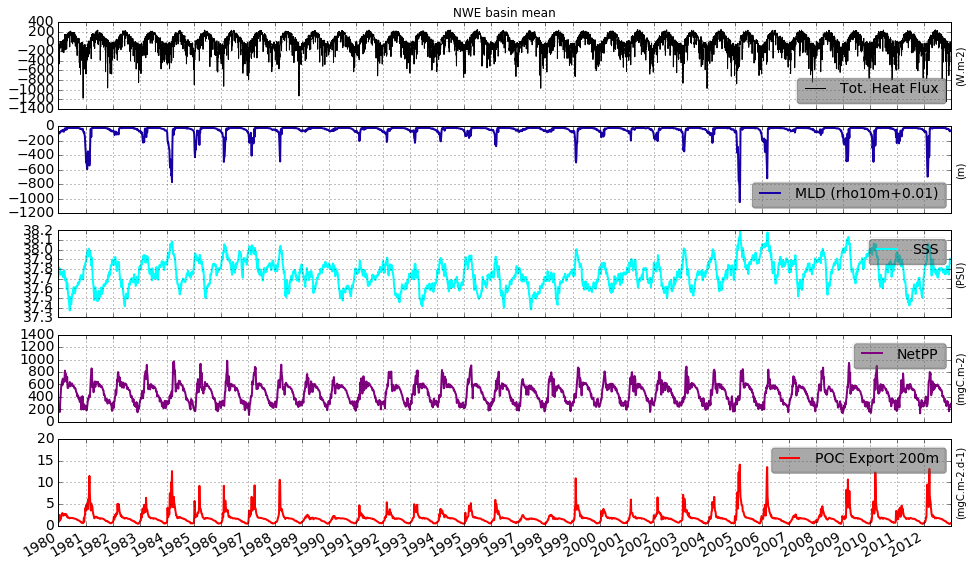

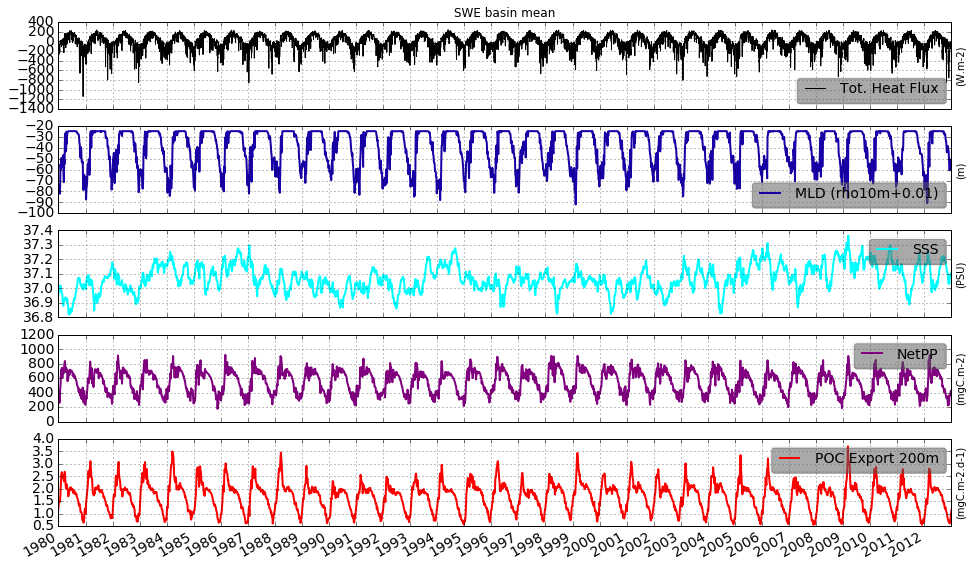

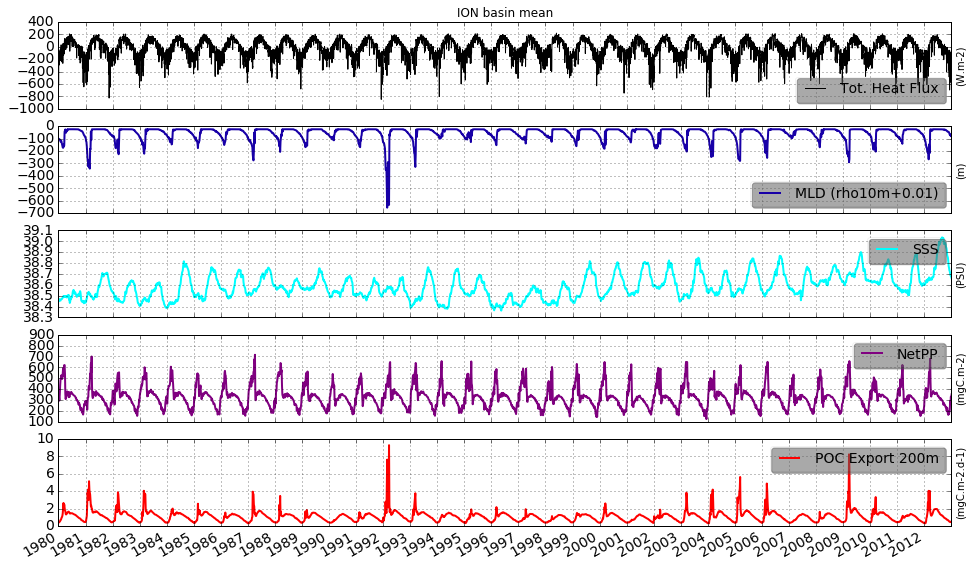

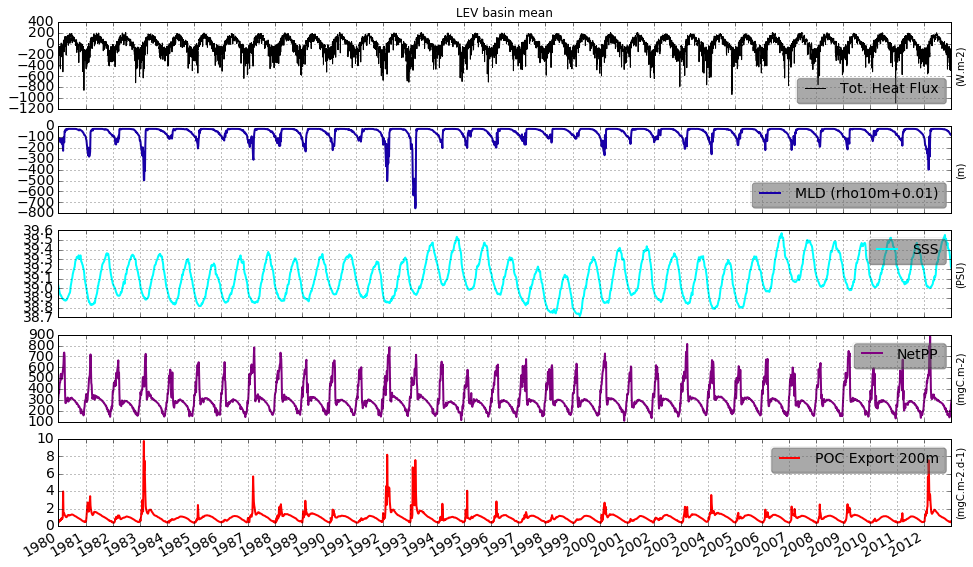

In [76]:
# 18/12/2018 TEEEEST
#nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']
nut_list = ['netppb', 'chl_tot', 'export_nit_sw', 'sal', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    #plt.subplot(6, 1, 1)
    plt.subplot(5, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    #plt.subplot(6, 1, 2)
    plt.subplot(5, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    #plt.subplot(6, 1, 5)
    plt.subplot(5, 1, 4)
    #plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color='purple', label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    

    
    #plt.subplot(6, 1, 3)
    plt.subplot(5, 1, 3)
    #plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    our_sal = np.append(np.nan,vars()['sal_'+basin]['sal'])
    plt.plot(dates2, our_sal,color='cyan', label='SSS',linewidth=2) #color=next(our_colormap)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(PSU)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #plt.subplot(6, 1, 6)
    plt.subplot(5, 1, 5)
    #plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color='y', label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color='r', label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/DEC_2018_FIGS/'+basin+'_TS_Interann_Variab'+'2.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color='green', label='Surf Chla Conc.',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

In [ ]:
plt.plot(vars()['sal_'+basin]['date'],vars()['sal_'+basin]['sal'], '-b', label='SSS')

In [62]:
np.shape(sal_LEV)

(3142, 2)

In [67]:
sal_ION[0:5]

,date,sal
0,1970-01-01,38.492859
1,1970-01-02,38.512691
2,1970-01-03,38.508606
3,1970-01-04,38.506161
4,1970-01-05,38.517937


In [56]:
#file_path2 = '../DATA/LONG_SIMS/Best_BoostW/VarInt/'
file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for region in region_list:
    full_list2 = os.listdir(file_path2)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        for nutrient in nut_list:
            if fnmatch.fnmatch(our_file, nutrient + '_2D_' + region + '.csv'):  # modified to try on some files
                vars()[nutrient + '_csv'] = read_csv(file_path2+our_file)
                vars()[nutrient + '_2D_' + region] = pd.DataFrame(vars()[nutrient + '_csv']['var'])
                vars()[nutrient + '_2D_' + region]['date'] = vars()[nutrient + '_csv']['date']
                vars()[nutrient + '_2D_' + region]['date'] = pd.to_datetime(vars()[nutrient + '_2D_' + region]['date'],format='%Y-%m-%d')
                vars()[nutrient + '_2D_' + region]['yy'] = pd.DatetimeIndex(vars()[nutrient + '_2D_' + region]['date']).year
                
dates2 = vars()[nutrient + '_csv']['date']
dates2 = pd.to_datetime(dates2, format='%Y-%m-%d')

In [66]:
np.shape(export_doc200_csv)
export_doc200_csv[0:5]

,Unnamed: 0,date,var
0,0,1970-06-15,NaN
1,1,1970-06-20,-0.034202
2,2,1970-06-25,-0.004339
3,3,1970-06-30,-0.001973
4,4,1970-07-05,0.002023


In [8]:
np.shape(dates2) # (3143,)
np.shape(MLD_Mean_ION) # (2445, 3)

(3143,)

In [10]:
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['socelowf','soceshwf'] # 

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*heatflux.nc'): 
        list_len.append(file)
            
len(list_len) # 528

528

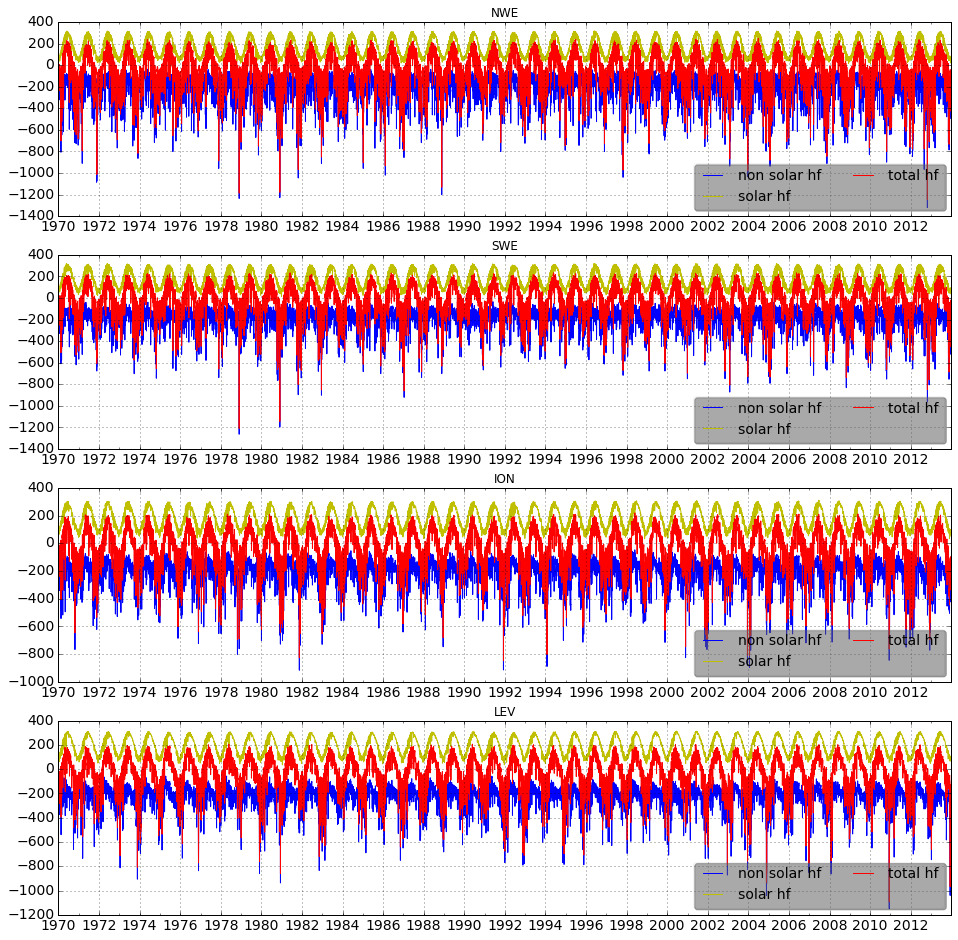

In [11]:
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['socelowf','soceshwf'] # 

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*heatflux.nc'): 
        list_len.append(file)
            
len(list_len) # 528

import datetime
import time
import matplotlib.dates as mdates

test = np.arange(0,16071) # nb days 01/01/1970 -> 31/12/2013 ; 12419 if starts 01/01/1980
size = np.shape(test)
dates = range(0, size[0])
for o in range(0, size[0]):
    dates[o] = datetime.datetime.fromtimestamp(time.mktime(datetime.datetime.strptime
                                                           ("01/01/1970", "%d/%m/%Y").timetuple())+int(test[o])*86400)

# 
plt.figure(figsize=(16,16))
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    vars()['heat_flux_'+basin] = pd.DataFrame(dates, columns=['date'])
    vars()['heat_flux_'+basin]['nonsolar_hf'] = vars()['all_df_socelowf_'+basin]
    vars()['heat_flux_'+basin]['solar_hf'] = vars()['all_df_soceshwf_'+basin]
    vars()['heat_flux_'+basin]['total_hf'] = vars()['heat_flux_'+basin]['nonsolar_hf']+vars()['heat_flux_'+basin]['solar_hf']
    
    # figure
    plt.subplot(len(region_list), 1, c)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['nonsolar_hf'], '-b', label='non solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'], '-r', label='total hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    #plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/All_Heat_Fluxes_4basins'+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [12]:
# 18/12/2018 Test SSS Time Series
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['sal'] # 

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*sal.nc'): 
        list_len.append(file)
            
len(list_len) # 528

3143

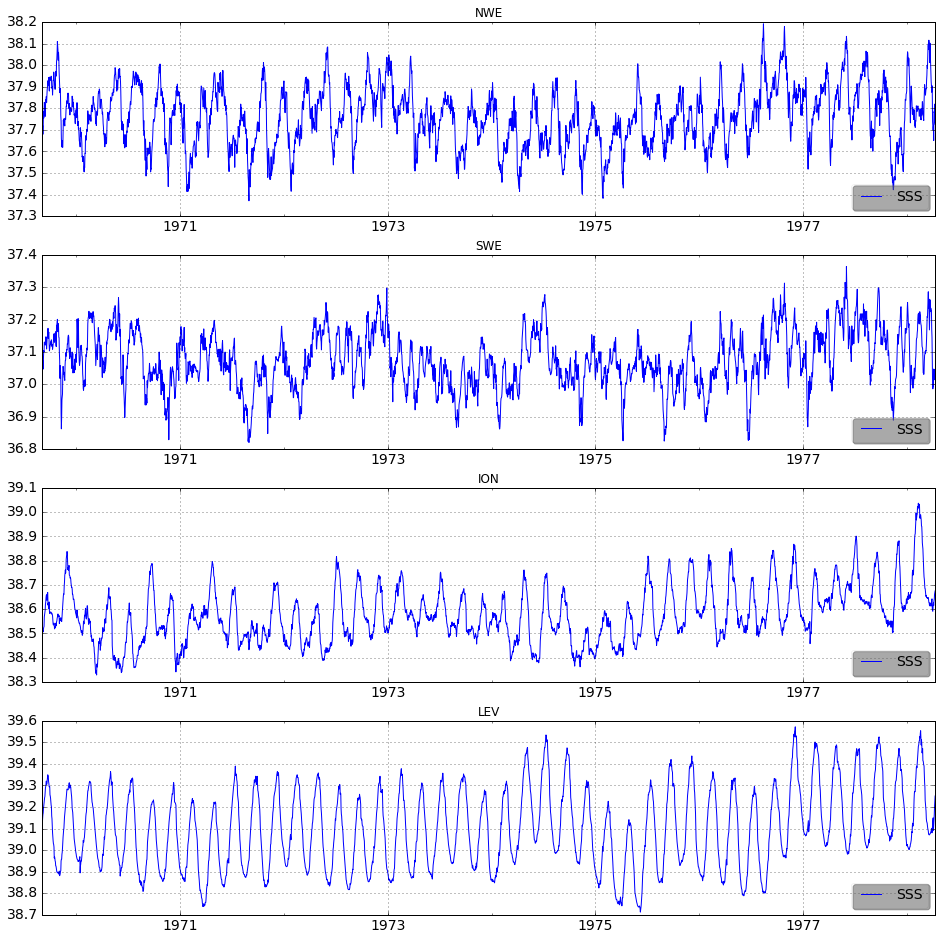

In [54]:
# 18/12/2018 Test SSS Time Series
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['sal'] #

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*sal.nc'):
        list_len.append(file)

len(list_len) # 528

import datetime
import time
import matplotlib.dates as mdates

#test = np.arange(0,16071) # nb days 01/01/1970 -> 31/12/2013 ; 12419 if starts 01/01/1980
test = np.arange(0,3142) # nb of sal files

size = np.shape(test)
dates = range(0, size[0])
for o in range(0, size[0]):
    dates[o] = datetime.datetime.fromtimestamp(time.mktime(datetime.datetime.strptime
                                                           ("01/01/1970", "%d/%m/%Y").timetuple())+int(test[o])*86400)

#
plt.figure(figsize=(16,16))
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone

            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan

            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))

            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    vars()['sal_'+basin] = pd.DataFrame(dates, columns=['date'])
    vars()['sal_'+basin]['sal'] = vars()['all_df_sal_'+basin]

    # figure
    plt.subplot(len(region_list), 1, c)
    plt.plot(vars()['sal_'+basin]['date'],vars()['sal_'+basin]['sal'], '-b', label='SSS')

    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    #plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1

#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/All_Heat_Fluxes_4basins'+'.png\',bbox_inches=\'tight\',format=\'png\')')                                                                               

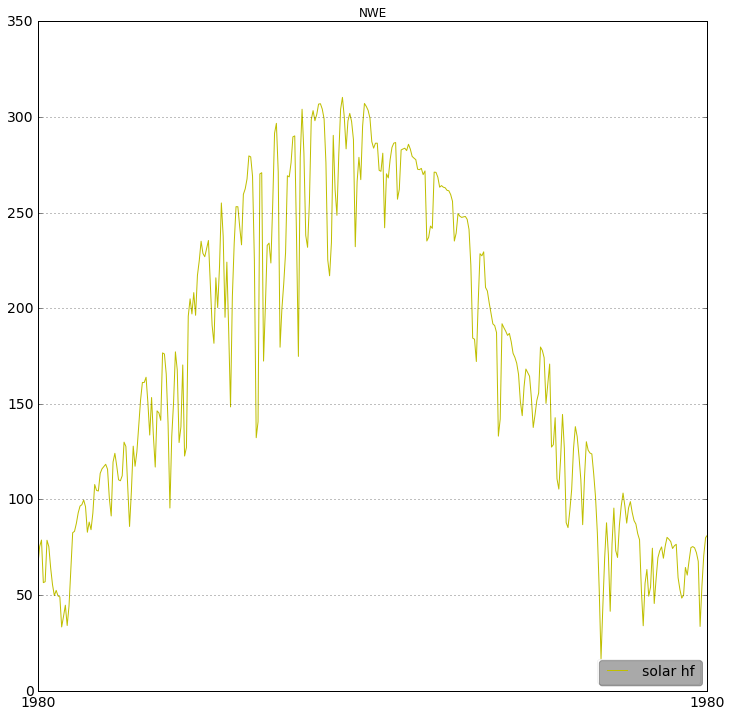

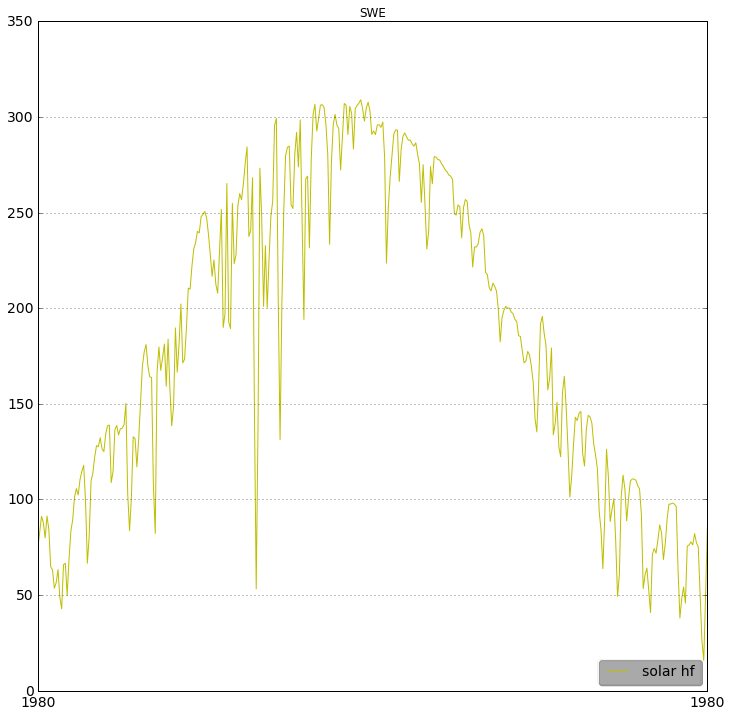

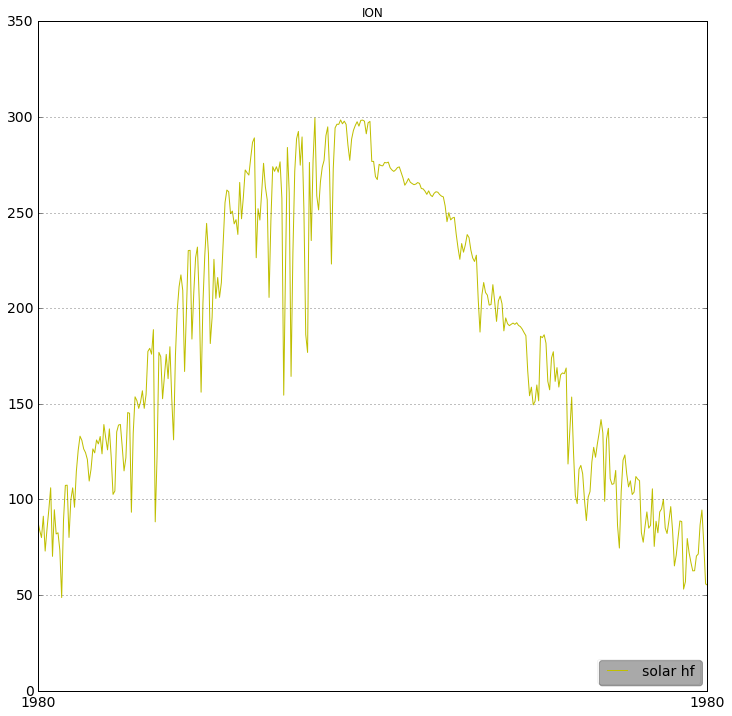

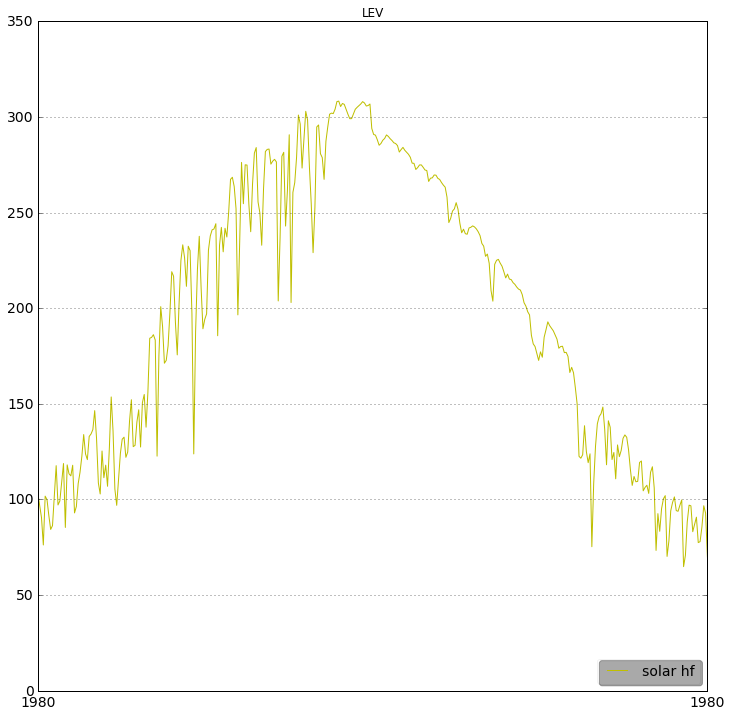

In [6]:
# 04/07 Test
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    plt.figure(figsize=(12,12))
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '1980-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1

In [ ]:
# 11/07 removing trends and seasonality

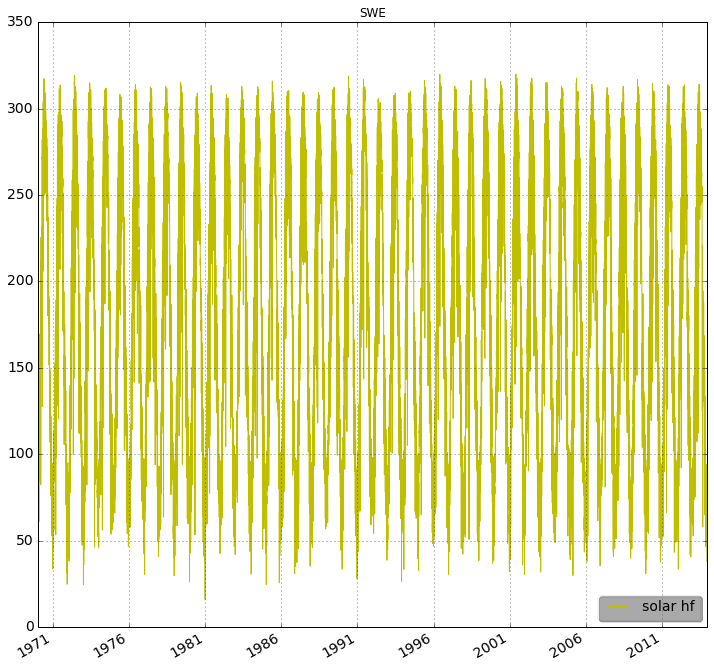

In [15]:
# 11/07 Test
c = 1
region_list = ['SWE']

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    plt.figure(figsize=(12,12))
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    #ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    #plt.xlim(['1980-01-01', '1983-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1

In [39]:
heat_flux_ION.head()

,date,nonsolar_hf,solar_hf,total_hf
0,1970-01-01,-192.691986,93.045540,-99.646446
1,1970-01-02,-170.618073,95.909370,-74.708702
2,1970-01-03,-124.898567,84.043167,-40.855400
3,1970-01-04,-108.406273,99.966942,-8.439331
4,1970-01-05,-117.185165,104.665497,-12.519669


In [10]:
type(heat_flux_SWE['date']) # pandas.core.series.Series

pandas.core.series.Series

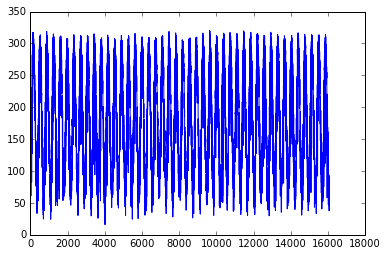

In [16]:
# same plot as before but with pyplot
pyplot.plot(heat_flux_SWE['solar_hf'])

In [ ]:
#from pandas import Series
from matplotlib import pyplot
#series = Series.from_csv('daily-minimum-temperatures.csv', header=0)
X = heat_flux_SWE['solar_hf']
diff = list()
days_in_year = 365

for i in range(days_in_year, len(X)):
    value = X[i] - X[i - days_in_year]
    diff.append(value)
pyplot.plot(diff)
pyplot.show()

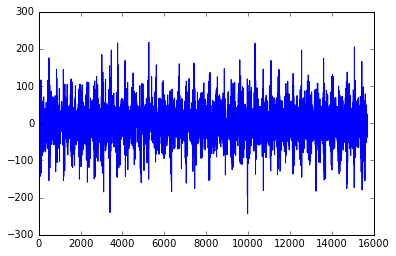

In [24]:
#from pandas import Series
from matplotlib import pyplot
#series = Series.from_csv('daily-minimum-temperatures.csv', header=0)
X = heat_flux_SWE['solar_hf']
diff = list()
days_in_year = 365

for i in range(days_in_year, len(X)):
    #print i, i - days_in_year
    value = X[i] - X[i - days_in_year]
    diff.append(value)
pyplot.plot(diff)
pyplot.show()

Coefficients: [ -6.52187243e-02   1.94684150e+02]


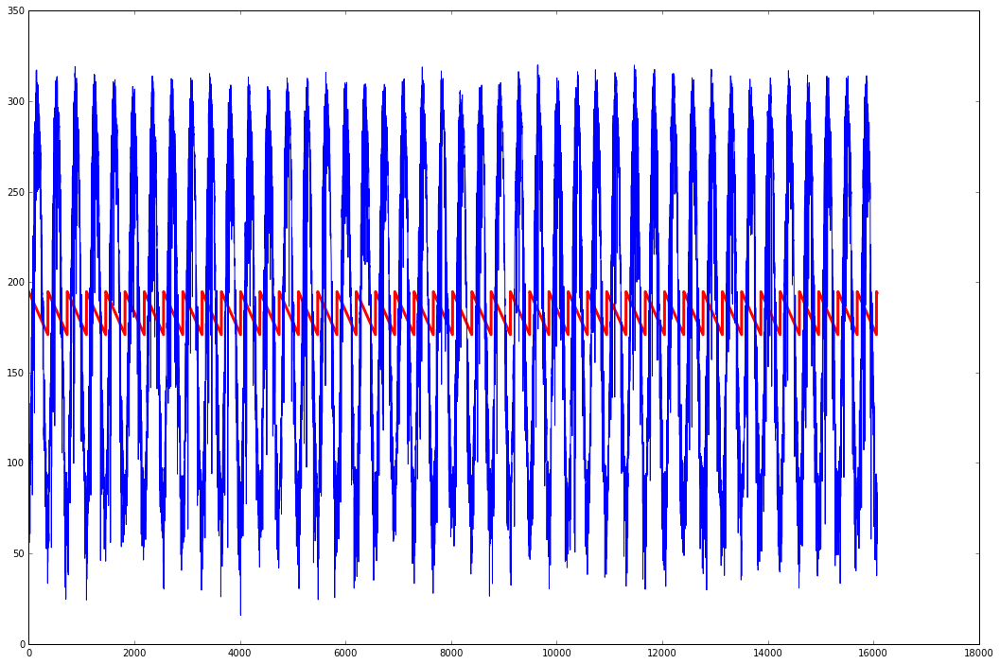

In [35]:
# Test model 

#from pandas import Series
from matplotlib import pyplot
from numpy import polyfit
#series = heat_flux_SWE
# fit polynomial: x^2*b1 + x*b2 + ... + bn
X = [i%365 for i in range(0, len(series))]
y = heat_flux_SWE['solar_hf'] # series.values
degree = 1
coef = polyfit(X, y, degree)
print('Coefficients: %s' % coef)
# create curve
curve = list()
for i in range(len(X)):
    value = coef[-1]
    for d in range(degree):
        value += X[i]**(degree-d) * coef[d]
        curve.append(value)
# plot curve over original data
plt.figure(figsize=(18,12))
pyplot.plot(curve, color='red', linewidth=3)

pyplot.plot(heat_flux_SWE['solar_hf'])
pyplot.show()

In [ ]:
# marche pas...

In [110]:
# 12/07/2018

date_1d = pd.date_range("19800101", freq='1D',periods=12220)
# date_1d[12215:] # ok DatetimeIndex(['2013-06-11', '2013-06-12', '2013-06-13', '2013-06-14', '2013-06-15'], [..]

year_list = np.arange(1980,2013)
region_names3 = ['SWE']

for region in region_names3:
    vars()[region+'_series'] = pd.DataFrame(date_1d, columns=['date'])
    vars()[region+'_series']['var'] = vars()['heat_flux_'+region]['solar_hf'] #[region+'_df'][0]
    vars()[region+'_series']['date'] = pd.to_datetime(vars()[region+'_series']['date'],format='%Y-%m-%d')
    vars()[region+'_series']['interp'] = pd.Series.interpolate(vars()[region+'_series']['var']) # method=linear
    vars()[region+'_series']['mm'] = pd.DatetimeIndex(vars()[region+'_series']['date']).month
    vars()[region+'_series']['yy'] = pd.DatetimeIndex(vars()[region+'_series']['date']).year
    
    vars()['man_df_'+region] = np.zeros([365,34])
    vars()['man_df_'+region][:] = np.nan
    vars()['man_df_'+region] = pd.DataFrame(vars()['man_df_'+region], columns=['1980','1981','1982','1983','1984',\
                                                                               '1985','1986','1987','1988','1989',\
                                                                               '1990','1991','1992','1993','1994',\
                                                                               '1995','1996','1997','1998','1999',\
                                                                               '2000','2001','2002','2003','2004',\
                                                                               '2005','2006','2007','2008','2009',\
                                                                               '2010','2011', '2012', '2013'])

    all_len = np.zeros([len(year_list)])
    all_len[:] = np.nan

    for year in year_list:
        vars()['our_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
        all_len[year-year_list[0]] = len(vars()['our_df_'+region])
    print ' '
    print all_len

    for year in year_list:
        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
        vars()[region+'_df_'+str(year)] = np.zeros([365])
        vars()[region+'_df_'+str(year)][:] = np.nan

        if all_len[year-year_list[0]] == 366:
            print year
            vars()['new_df_'+region] = vars()['temp_df_'+region].drop(vars()['temp_df_'+region].index[59])
            vars()[region+'_df_'+str(year)][:] = vars()['new_df_'+region]['interp']
            vars()['man_df_'+region][str(year)] = vars()[region+'_df_'+str(year)]

        else:
            vars()[region+'_df_'+str(year)][:] = vars()['temp_df_'+region]['interp']
            vars()['man_df_'+region][str(year)] = vars()[region+'_df_'+str(year)]
    
#    year_list2 = [1970]
#    #c = 0
#
#    for year in year_list2:
#        vars()[region+'_df_'+str(year)] = np.zeros([365])
#        vars()[region+'_df_'+str(year)] = np.nan
#        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
#
#    vars()['man_df_'+region]['1970'][165:] = vars()['temp_df_'+region]['interp']

    year_list2 = [2013]
    #c = 0

    for year in year_list2:
        vars()[region+'_df_'+str(year)] = np.zeros([365])
        vars()[region+'_df_'+str(year)] = np.nan
        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]

    vars()['man_df_'+region]['2013'][0:166] = vars()['temp_df_'+region]['interp']
    
print ' '
print 'END OF COMPUTING'

 
[ 366.  365.  365.  365.  366.  365.  365.  365.  366.  365.  365.  365.
  366.  365.  365.  365.  366.  365.  365.  365.  366.  365.  365.  365.
  366.  365.  365.  365.  366.  365.  365.  365.  366.]
1980
1984
1988
1992
1996
2000
2004
2008
2012
 
END OF COMPUTING


In [112]:
# Computing a mean annual cycle

for region in region_names3:
    vars()[region+'_nanmean'] = np.zeros([365]) # preallocating the mean array
    
    for i in np.arange(1, len(vars()['man_df_'+region])+1):
        moy_temp = np.nanmean(vars()['man_df_'+region][i-1:i])
        vars()[region+'_nanmean'][i-1] = moy_temp
        moy_temp = None
    
    vars()['man_df_'+region]['mean'] = vars()[region+'_nanmean']
    vars()['man_df_'+region]['day'] = np.arange(1, 366)

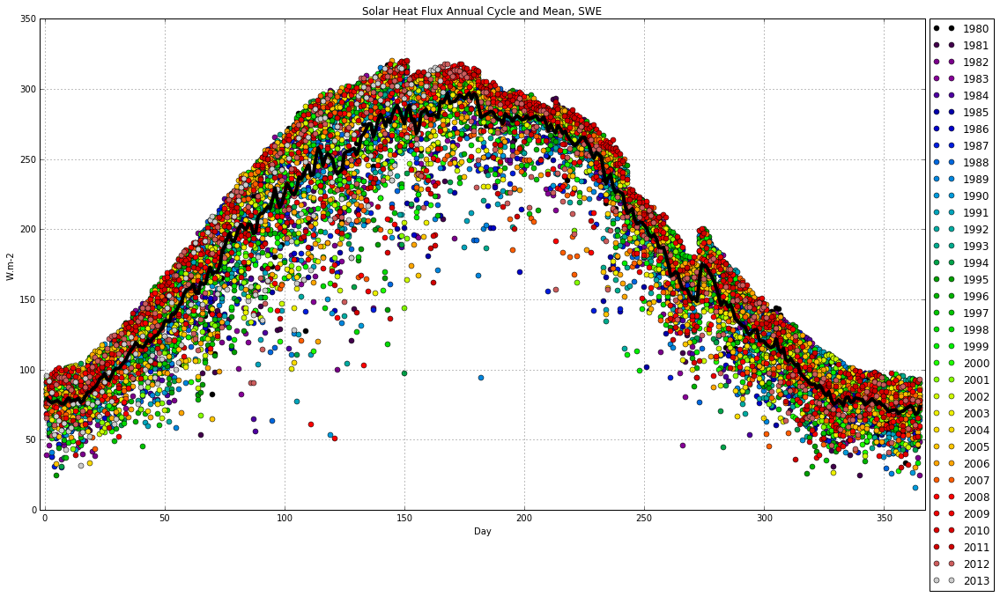

In [138]:
## FIG ANNUAL MEAN CYCLES

for region in region_names3:
    year_list = np.arange(1980,2014)
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(year_list))))
    plt.figure(figsize=[18,10])

    for year in year_list:    
        temp_col = next(our_colormap)
        plt.plot(vars()['man_df_'+region]['day'], vars()['man_df_'+region][str(year)], 'o',color=temp_col,label=str(year), linewidth=3)
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1.005, 1), loc=2, borderaxespad=0.,fontsize=12)
        plt.xlim([-2,367])
        plt.ylabel('W.m-2')
        plt.xlabel('Day')

    plt.plot(vars()['man_df_'+region]['day'], vars()['man_df_'+region]['mean'], '-k',label='mean', linewidth=4)
    plt.title('Solar Heat Flux Annual Cycle and Mean, '+region)

In [120]:
# Calcul des anomalies

for region in region_names3:
    # preallocating arrays
    vars()['anom_df_'+region] = np.zeros([365,34])
    vars()['anom_df_'+region][:] = np.nan
    vars()['anom_df_'+region] = pd.DataFrame(vars()['anom_df_'+region], columns=['1980','1981','1982','1983','1984',\
                                                                               '1985','1986','1987','1988','1989',\
                                                                               '1990','1991','1992','1993','1994',\
                                                                               '1995','1996','1997','1998','1999',\
                                                                               '2000','2001','2002','2003','2004',\
                                                                               '2005','2006','2007','2008','2009',\
                                                                               '2010','2011', '2012', '2013'])

    year_list = np.arange(1980,2014)

    for year in year_list:
        for d in np.arange(0,365):
            if np.isnan(vars()['man_df_'+region][str(year)][d]) == False:
                anom_temp = (vars()['man_df_'+region][str(year)][d])-(vars()['man_df_'+region]['mean'][d])
                vars()['anom_df_'+region][str(year)][d] = anom_temp
                anom_temp = None

In [122]:
anom_df_SWE.head()

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,1.489669,-5.563531,-4.286347,-40.710938,-11.113793,11.020866,11.412322,6.773361,-1.895547,-5.461831,...,7.070754,-5.816750,2.482650,-5.440728,-11.629563,-3.139519,-3.318734,11.811988,-14.165963,15.736045
1,-20.879767,-24.428992,8.335900,-31.675494,-0.130309,6.011354,13.713464,-15.168467,10.632035,-20.228736,...,16.687074,-8.834418,11.694459,-8.983016,2.609758,15.620889,8.852868,10.646959,-1.707129,14.275148
2,-38.447392,-17.486890,1.114989,-16.496781,4.559745,7.915618,11.593314,-38.388375,9.426566,-35.075753,...,15.265853,-1.708619,10.977271,-5.678262,9.548934,20.403022,14.639220,11.671851,-23.383496,7.096114
3,1.784256,-17.542019,3.126175,-9.399925,7.148163,12.068428,9.589096,-46.361847,2.716324,-25.489853,...,6.644432,-18.127930,-1.718071,5.523323,-3.519035,20.809372,13.173027,17.420090,-17.069931,-23.647018
4,5.819961,3.047432,-3.572937,-24.346543,11.627456,15.259002,5.856910,-26.766396,8.387779,11.183891,...,-3.994599,-45.285565,-9.767647,-3.679428,-5.136856,22.152603,4.239746,18.608658,11.508560,-11.191208


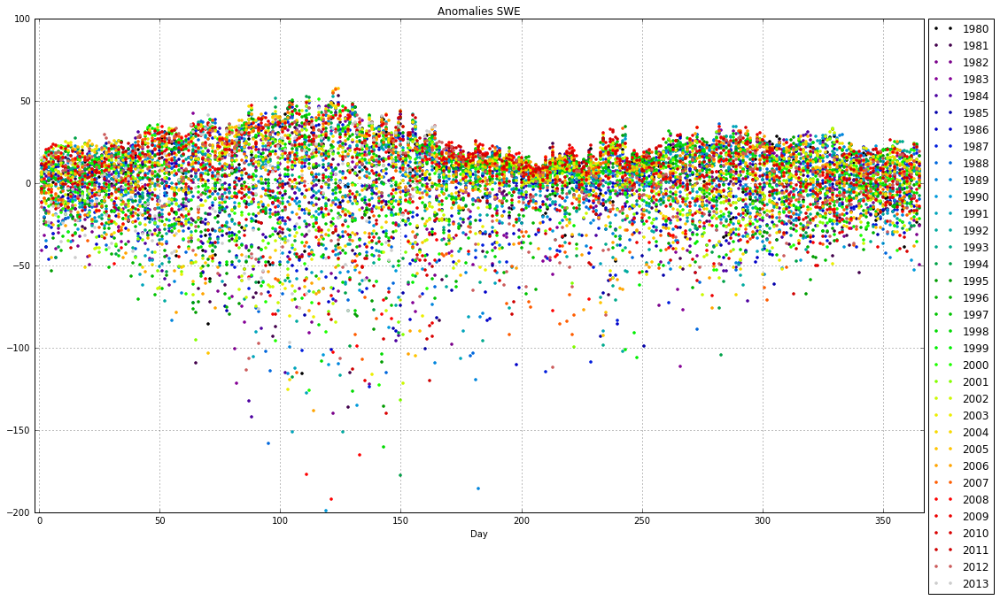

In [139]:
for region in region_names3:
    year_list = np.arange(1980,2014)
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(year_list))))
    plt.figure(figsize=[18,10])

    for year in year_list:    
        temp_col = next(our_colormap)
        plt.plot(vars()['man_df_'+region]['day'], vars()['anom_df_'+region][str(year)],'.',color=temp_col,label=str(year)) #,linewidth=4
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1.005, 1), loc=2, borderaxespad=0.,fontsize=12)
        plt.xlim([-2,367])
        plt.xlabel('Day')
    plt.title('Anomalies '+region)

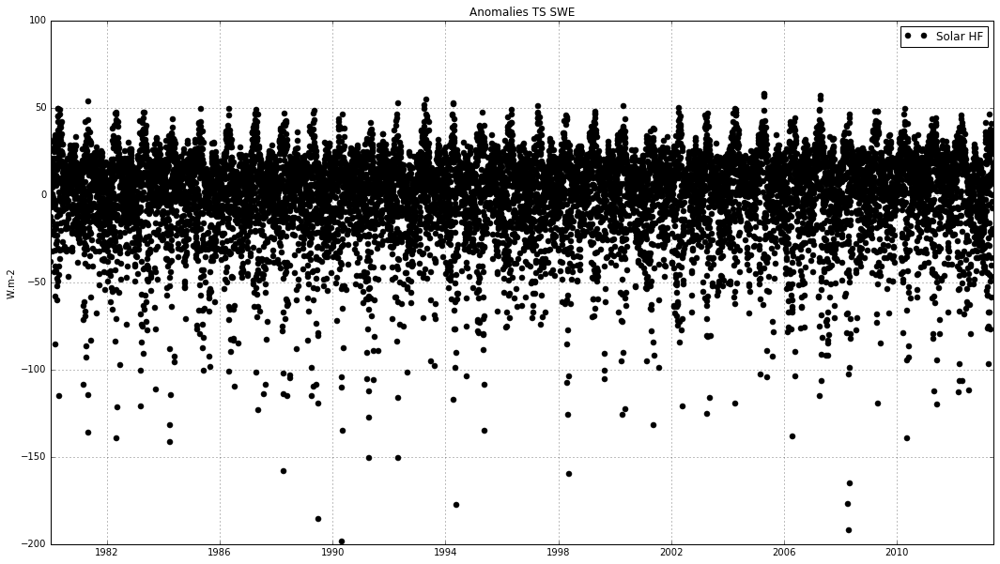

In [149]:
all_days = pd.date_range("19800101", freq='1D',periods=12410)

for region in region_names3:
    vars()['all_arr_'+region] = []

    for year in year_list:
        temp_arr = vars()['anom_df_'+region][str(year)]
        vars()['all_arr_'+region] = np.append(vars()['all_arr_'+region], temp_arr)
        
for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days, vars()['all_arr_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('Anomalies TS ' + region)

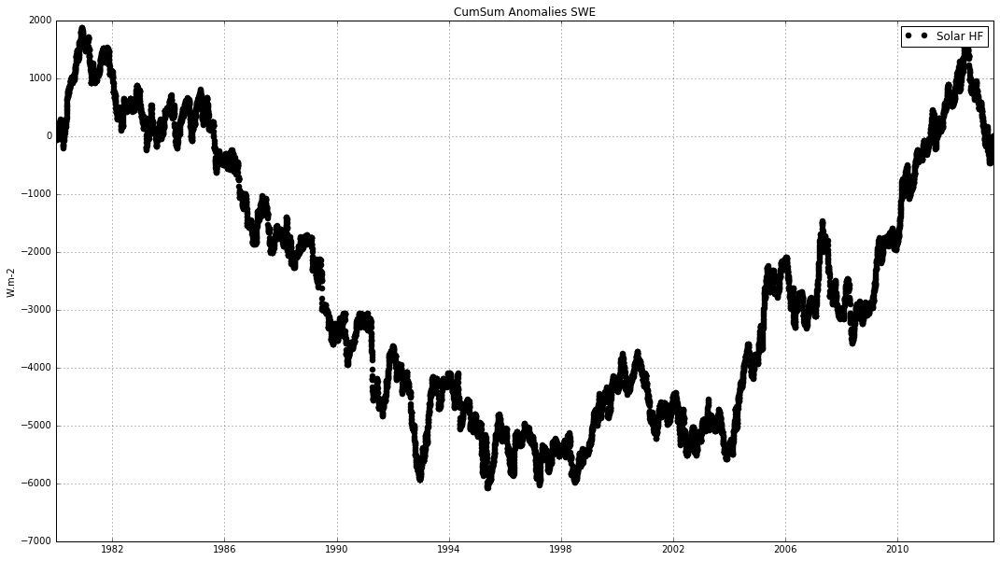

In [151]:
# cumsum
cumsum_SWE = np.cumsum(all_arr_SWE)
np.shape(cumsum_SWE)

for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days, vars()['cumsum_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('CumSum Anomalies ' + region)

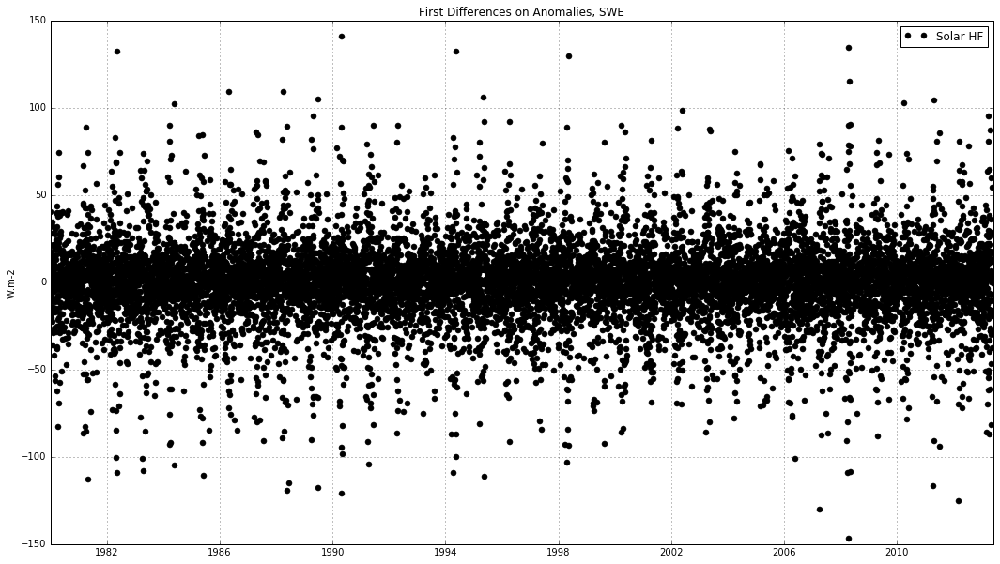

In [159]:
# diff
diff_SWE = np.diff(all_arr_SWE)

for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days[1:], vars()['diff_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('First Differences on Anomalies, ' + region)

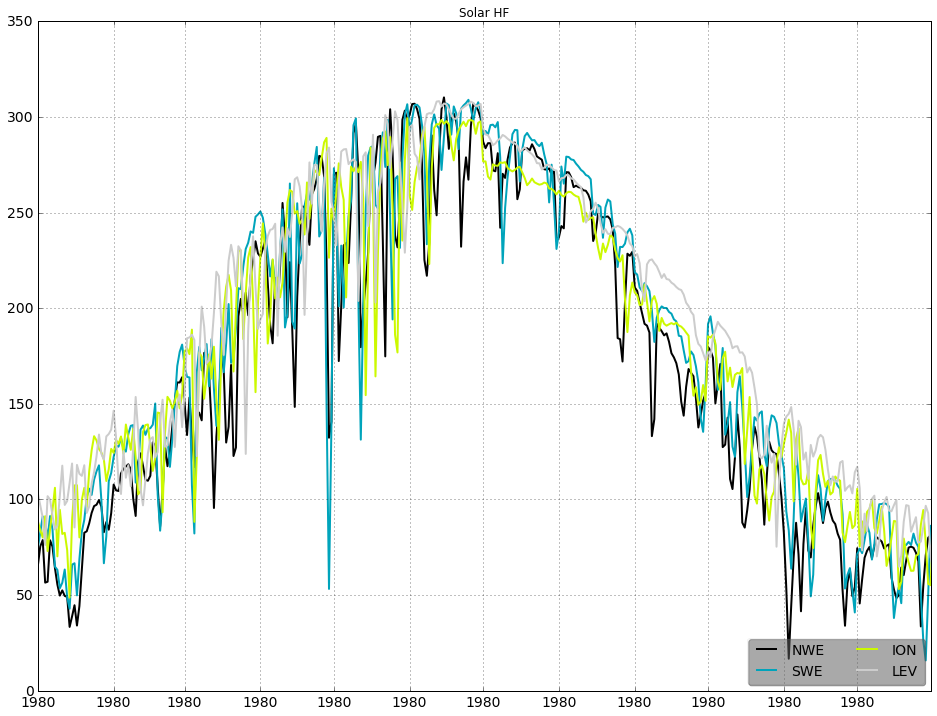

In [15]:
# 04/07 Test (OLD)

spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, len(region_list))))
plt.figure(figsize=(16,12))
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    #plt.figure(figsize=(12,12))
    #plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], color=next(our_colormap), label=basin,linewidth=2)
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    #ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=0.5))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '1980-12-31'])
    plt.grid(True)
    plt.title('Solar HF')
    c += 1

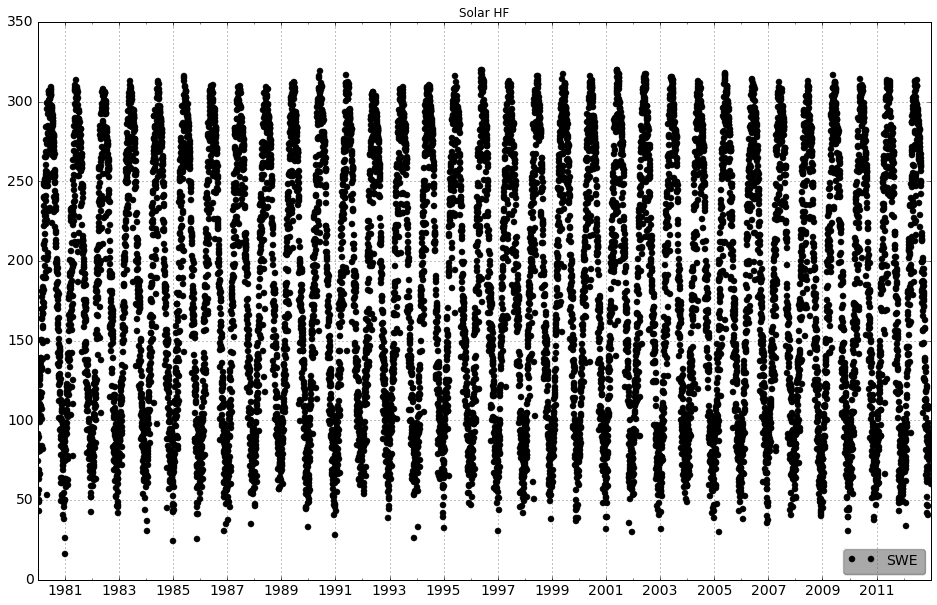

In [19]:
# 04/07 Test

spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, len(region_list))))
plt.figure(figsize=(16,10))
c = 1
region_list2 = ['SWE']
for region in region_list2:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    #plt.figure(figsize=(12,12))
    #plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'],'o', color=next(our_colormap), label=basin,linewidth=2)
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid(True)
    plt.title('Solar HF')
    c += 1

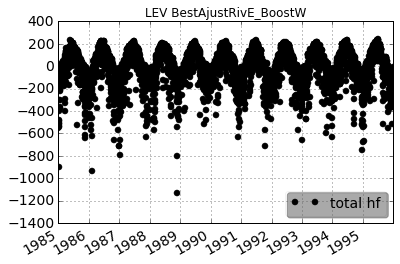

In [14]:
plt.figure() # figsize=(16,10)
# heatflux
plt.plot(heat_flux_NWE['date'],heat_flux_NWE['total_hf'],'ok', label='total hf')
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
plt.gcf().autofmt_xdate()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.xlim(['1985-01-01', '1995-12-31'])
plt.grid()
leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
leg.get_frame().set_alpha(0.05)
eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

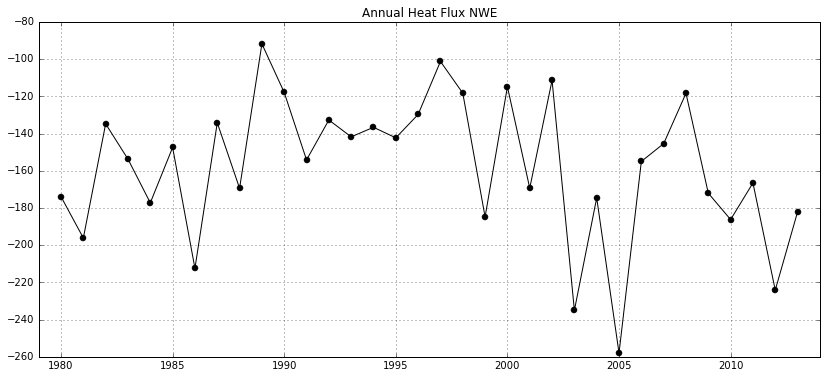

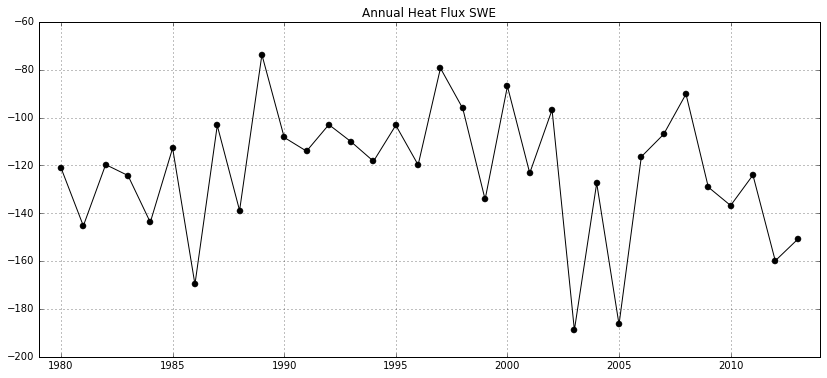

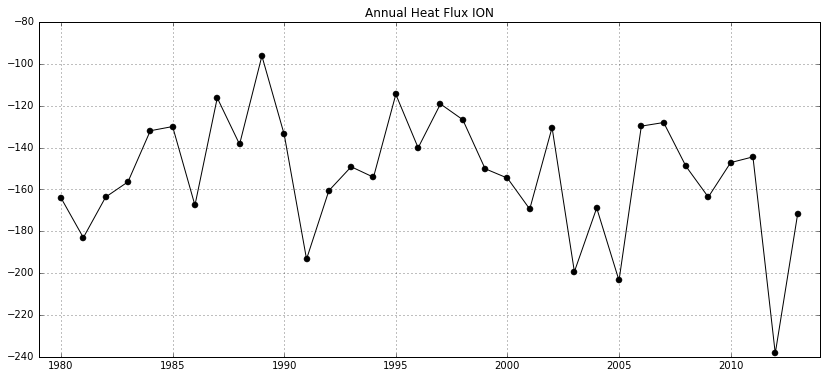

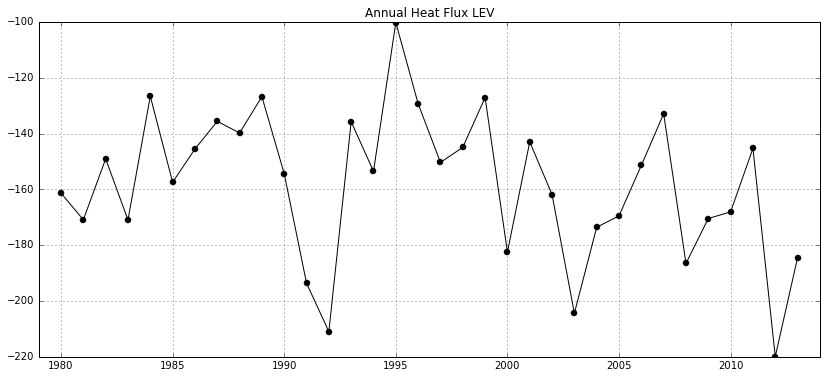

In [21]:
# annual heat flux
year_list = np.arange(1980,2014)

for basin in region_list:
    vars()['hf2_'+basin] = vars()['heat_flux_'+basin]
    vars()['hf2_'+basin]['yy'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).year
    vars()['hf2_'+basin]['mm'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).month
    
# Keeping only winter values
for basin in region_list:
    vars()['hf3_'+basin] = vars()['hf2_'+basin].loc[(vars()['hf2_'+basin]['mm']==1)|(vars()['hf2_'+basin]['mm']==2)|(vars()['hf2_'+basin]['mm']==12)]
    count = 0
    vars()['hf_mean_DJF_'+basin] = np.zeros([34])
    for y in year_list:
        vars()['hf_mean_DJF_'+basin][count] =  vars()['hf3_'+basin].groupby('yy')['total_hf'].mean()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, vars()['hf_mean_DJF_'+basin], '-ok')
    plt.grid(True)
    eval('plt.title(\'Annual Heat Flux '+basin+'\')')
    plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [22]:
np.shape(hf_mean_DJF_NWE) # (34,)

testt = np.vstack([hf_mean_DJF_NWE,hf_mean_DJF_SWE,hf_mean_DJF_ION,hf_mean_DJF_LEV])
np.shape(testt) # (4, 34)

hf_mean_DJF = testt.transpose()
hf_mean_DJF

# FINALLY
np.savetxt('hf_DJF_4zones.txt',hf_mean_DJF,delimiter=' ')  # => YES!

In [82]:
### CREATING A NEW MLD DJF txt FILE ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'

MLD_DJF_df = pd.read_table(file_path+'result_mld_DJF',names=['year','month','day','NWE','SWE','ION','LEV'],delimiter='\s+')
#MLD_DJF_df.head()

#np.shape(MLD_DJF_df) #(613,7)
yy_corr = np.zeros([613])
yy_corr[:] = np.nan

for o in np.arange(0,len(MLD_DJF_df)):
    if MLD_DJF_df['month'][o] == 12:
        yy_corr[o] = MLD_DJF_df['year'][o]+1
    else:
        yy_corr[o] = MLD_DJF_df['year'][o]
#yy_corr

MLD_DJF_df['yy_corr'] = yy_corr
MLD_DJF_df.head()
#MLD_DJF_df.tail(n=20) # seems ok!

,year,month,day,NWE,SWE,ION,LEV,yy_corr
0,1979,12,5,44.94510,54.02661,64.91634,71.97735,1980.0
1,1979,12,10,48.49299,54.64935,67.77658,72.52191,1980.0
2,1979,12,15,56.92070,58.77721,73.97026,86.76366,1980.0
3,1979,12,20,65.34586,56.65700,76.74568,81.42103,1980.0
4,1979,12,25,63.35500,63.54916,83.93745,93.28457,1980.0


In [83]:
region_list
year_list

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013])

(1979, 2014)

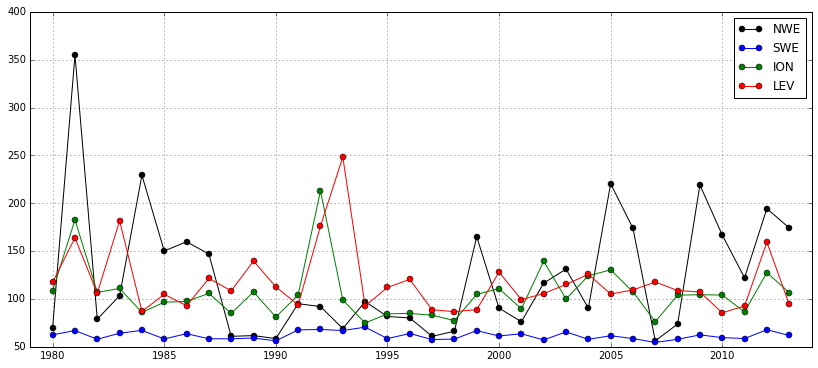

In [94]:
col_list = ['k','b','g','r']
count_col=0
plt.figure(figsize=(14,6))

# Keeping only winter values
for basin in region_list:
    count = 0
    vars()['MLD_mean_DJF_'+basin] = np.zeros([34])
    for y in year_list:
        vars()['MLD_mean_DJF_'+basin][count] =  MLD_DJF_df.groupby('yy_corr')[basin].mean()[y]
        count += 1
        
    # figure
    plt.plot(year_list, vars()['MLD_mean_DJF_'+basin], '-o',color=col_list[count_col],label=basin)
    #print count_col
    count_col += 1
plt.grid(True)    
plt.legend()
    #eval('plt.title(\'Annual Heat Flux '+basin+'\')')
plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')
    
# Saving txt file
MLD_stack = np.vstack([MLD_mean_DJF_NWE,MLD_mean_DJF_SWE,MLD_mean_DJF_ION,MLD_mean_DJF_LEV])
np.shape(MLD_stack) # (4, 34)


MLD_mean_DJF = MLD_stack.transpose()
MLD_mean_DJF
# FINALLY
#np.savetxt('MLD_DJF_4zones_Alex.txt',MLD_mean_DJF,delimiter=' ')  # => YES!

In [115]:
### Loop on ppb netppb and org ###
# mean, then min and max
var_list = ['ppb', 'netppb', 'export_nit_sw', 'export_pho_sw']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            # NO DJF!!!
            #vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            #vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            #vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            vars()[var+'_2D_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_2D_'+basin]['date']).month
            count = 0
            vars()[var+'_'+treatment+'_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            #print var+'_'+treatment+'_'+basin
            
for var in var_list:
    for treatment in treat_list:
        # Saving txt file
        temp_stack = np.vstack([vars()[var+'_'+treatment+'_NWE'],vars()[var+'_'+treatment+'_SWE'],vars()[var+'_'+treatment+'_ION'],vars()[var+'_'+treatment+'_LEV']])
        print 'temp_stack', np.shape(temp_stack) # (4, 34)

        vars()[var+'_'+treatment+'_tocorr'] = temp_stack.transpose()
        temp_stack = None
        # FINALLY
        eval('np.savetxt(\''+var+'_'+treatment+'_tocorr_4zones.txt\','+var+'_'+treatment+'_tocorr,delimiter=\' \')')  # => YES!

temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)


In [ ]:
export_doc200_2D_ION

In [7]:
### Loop on Org C ###
# mean, then min and max
var_list = ['export_doc200', 'export_poc200']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            vars()[var+'_2D_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_2D_'+basin]['date']).month
            count = 0
            vars()[var+'_'+treatment+'_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            
for var in var_list:
    for treatment in treat_list:
        # Saving txt file
        temp_stack = np.vstack([vars()[var+'_'+treatment+'_NWE'],vars()[var+'_'+treatment+'_SWE'],vars()[var+'_'+treatment+'_ION'],vars()[var+'_'+treatment+'_LEV']])
        #print 'temp_stack', np.shape(temp_stack) # (4, 34)

        vars()[var+'_'+treatment+'_tocorr'] = temp_stack.transpose()
        temp_stack = None
        # FINALLY
        #eval('np.savetxt(\''+var+'_'+treatment+'_tocorr_4zones.txt\','+var+'_'+treatment+'_tocorr,delimiter=\' \')')  # => YES!
    
print 'END of CELL'

END of CELL


In [16]:
# Export OC
for region in region_list:
    vars()['export_OC_'+region] = vars()['export_doc200_2D_'+region]
    vars()['export_OC_'+region]['var2'] = vars()['export_doc200_2D_'+region]['var'] + vars()['export_poc200_2D_'+region]['var']

In [126]:
export_OC_ION = export_doc200_2D_ION
export_OC_ION['var'] = export_OC_ION['var']+export_poc200_2D_ION['var']
export_OC_ION.tail() # OK!

,var,date,yy,mm
3138,3.457333,2013-05-30,2013,5
3139,3.348259,2013-06-04,2013,6
3140,3.250882,2013-06-09,2013,6
3141,3.231087,2013-06-14,2013,6
3142,3.299715,2013-06-15,2013,6


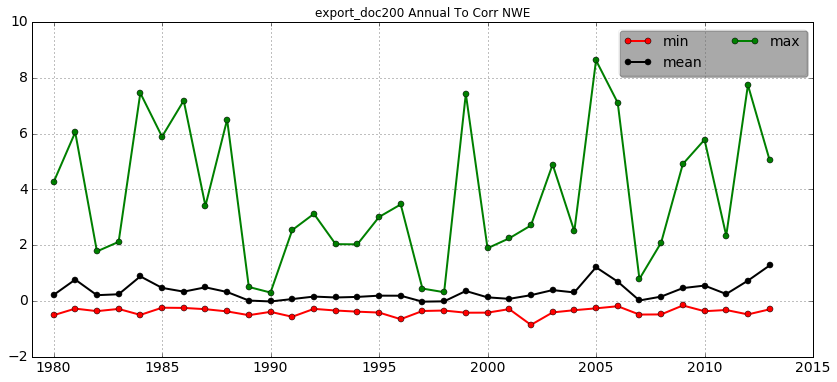

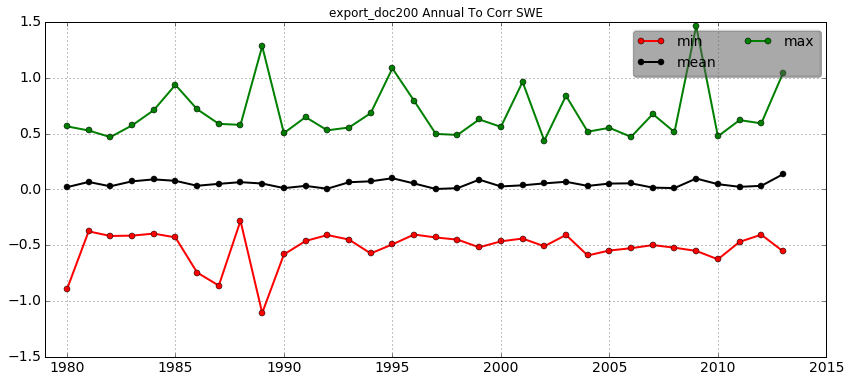

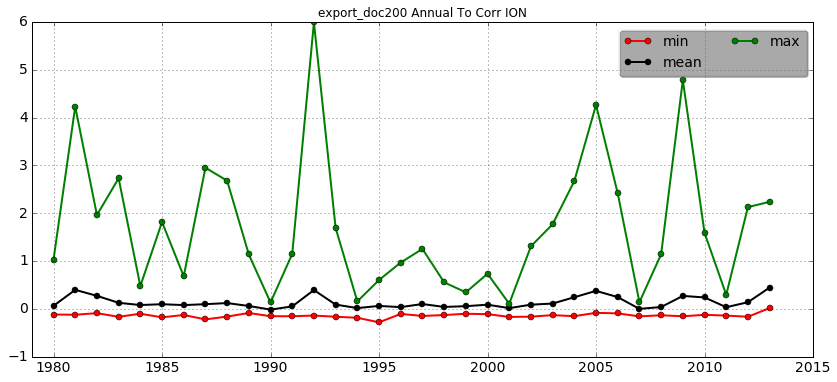

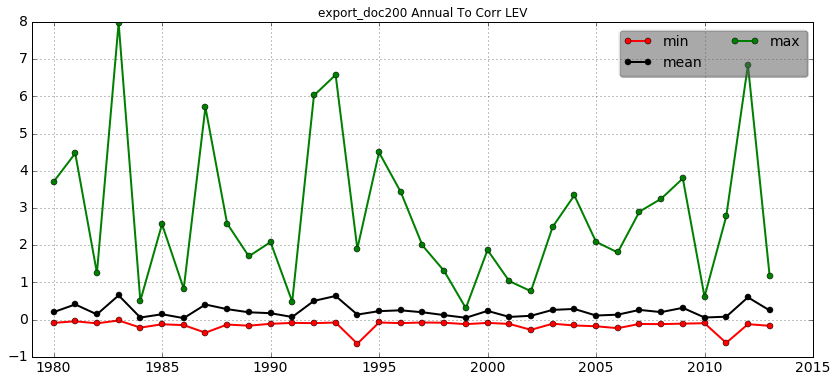

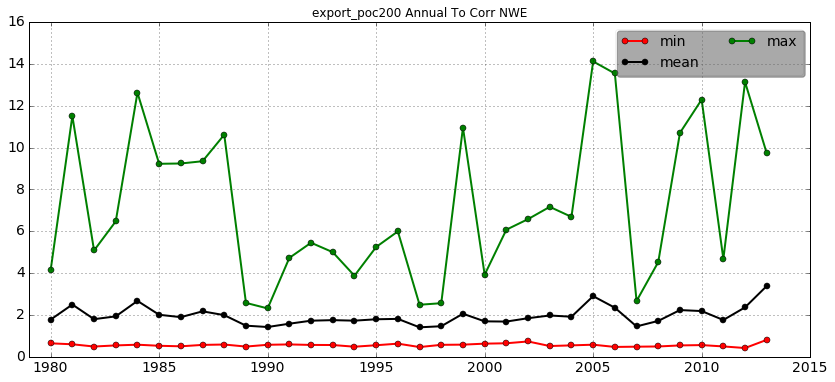

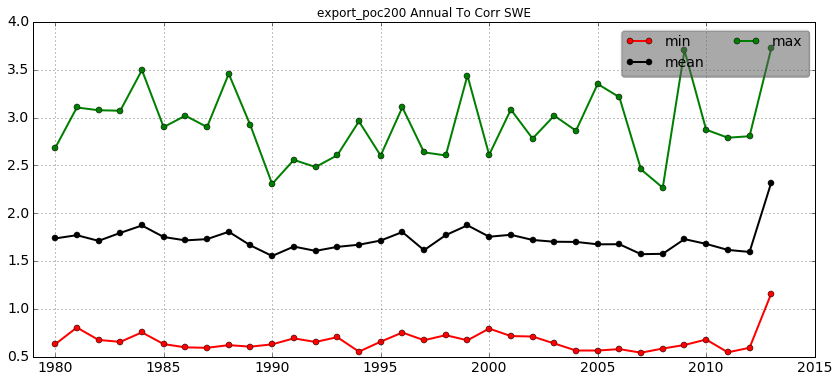

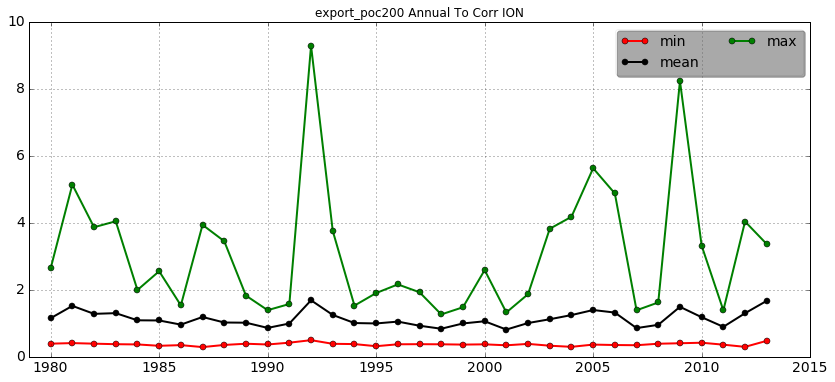

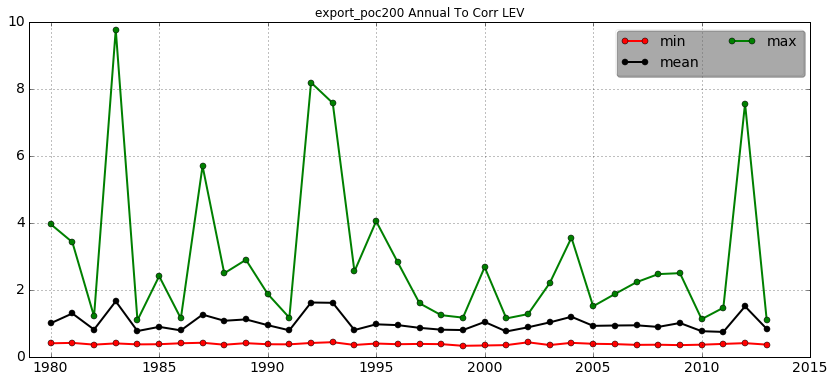

In [117]:
# All 3 series on the same fig
for var in var_list:
    for basin in region_list:
        plt.figure(figsize=(14,6))
        # figure
        plt.plot(year_list, vars()[var+'_min_'+basin], '-or', label='min', linewidth=2)
        plt.plot(year_list, vars()[var+'_mean_'+basin], '-ok', label='mean', linewidth=2)
        plt.plot(year_list, vars()[var+'_max_'+basin], '-og', label='max', linewidth=2)
        plt.grid(True)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+var+' Annual To Corr '+basin+'\')')
        plt.xlim([1979,2015])

In [100]:
ppb_2D_ION

,var,date,yy,mm
0,NaN,1970-06-15,1970,6
1,1618.830078,1970-06-20,1970,6
2,1791.677612,1970-06-25,1970,6
3,1542.425659,1970-06-30,1970,6
4,1306.631104,1970-07-05,1970,7
5,1334.444214,1970-07-10,1970,7
6,1555.195435,1970-07-15,1970,7
7,1555.783936,1970-07-20,1970,7
8,1452.172974,1970-07-25,1970,7
9,1383.546143,1970-07-30,1970,7


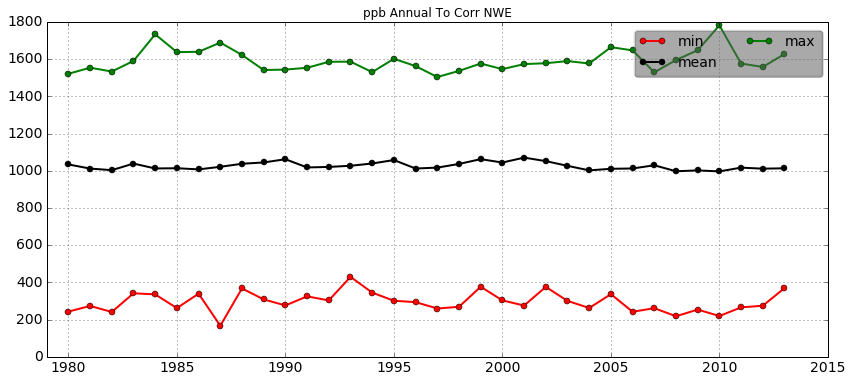

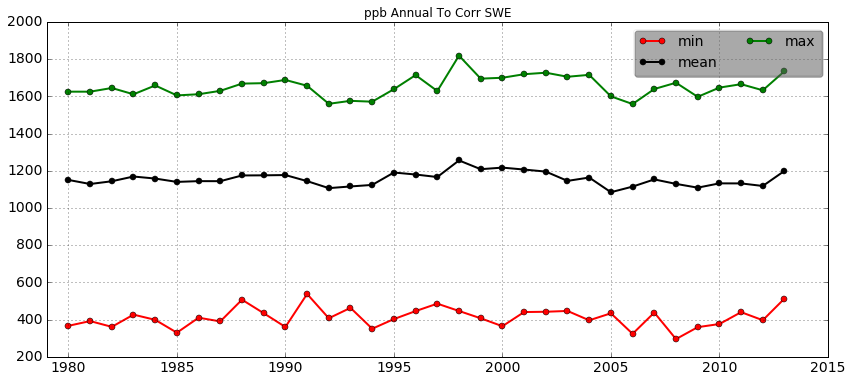

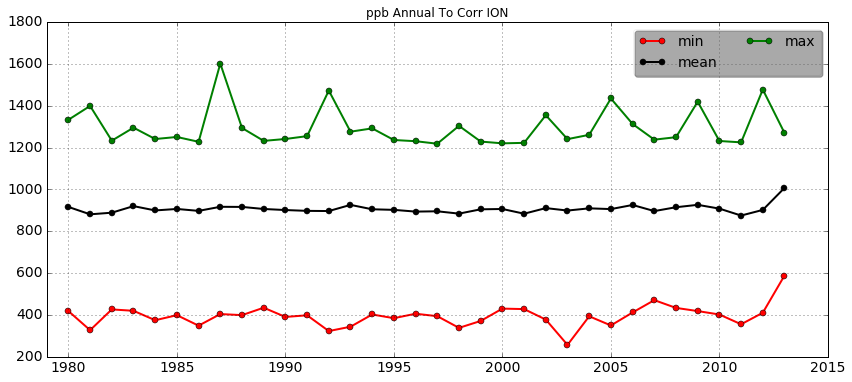

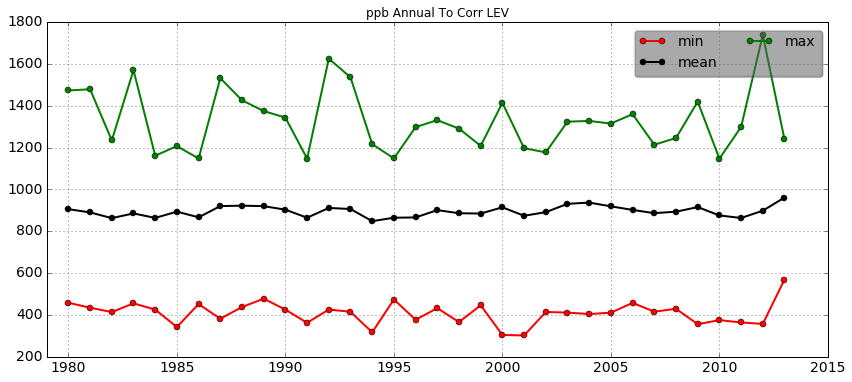

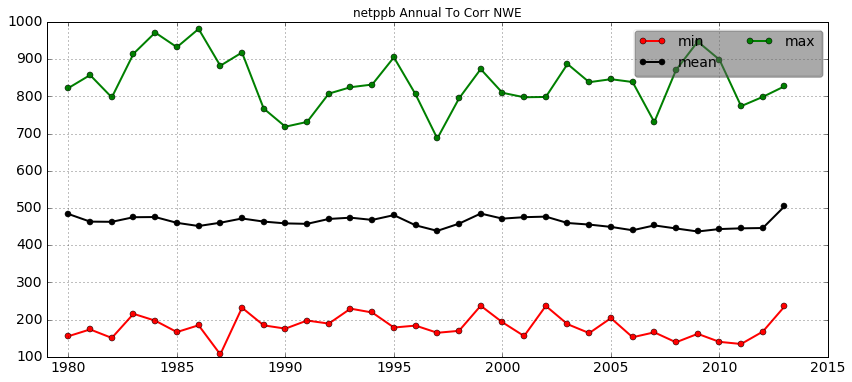

...

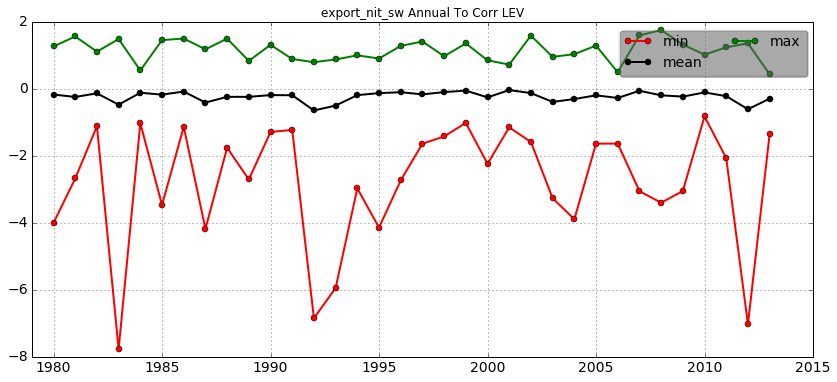

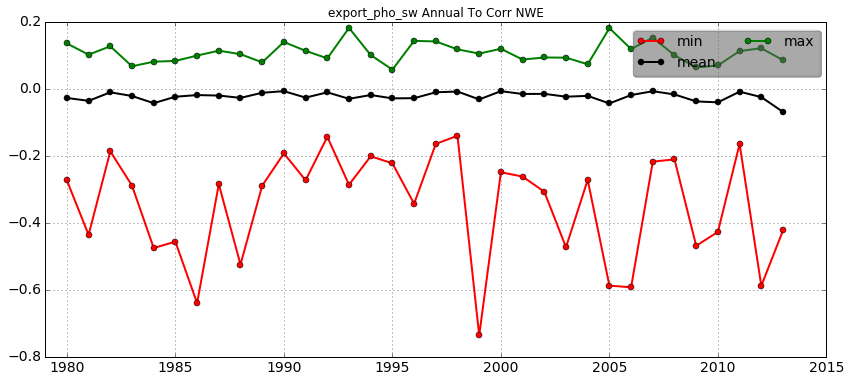

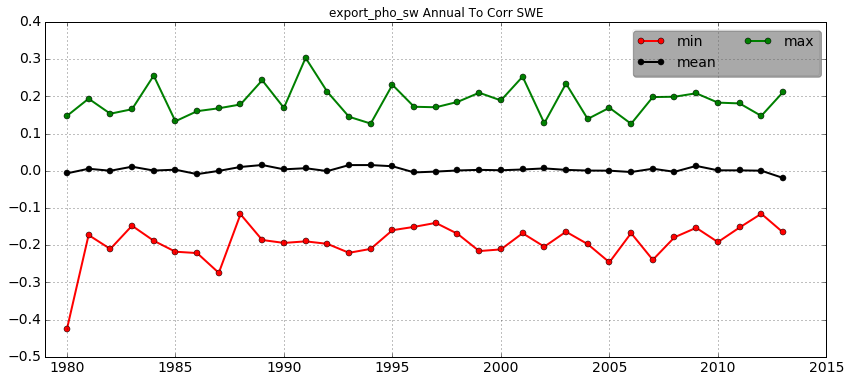

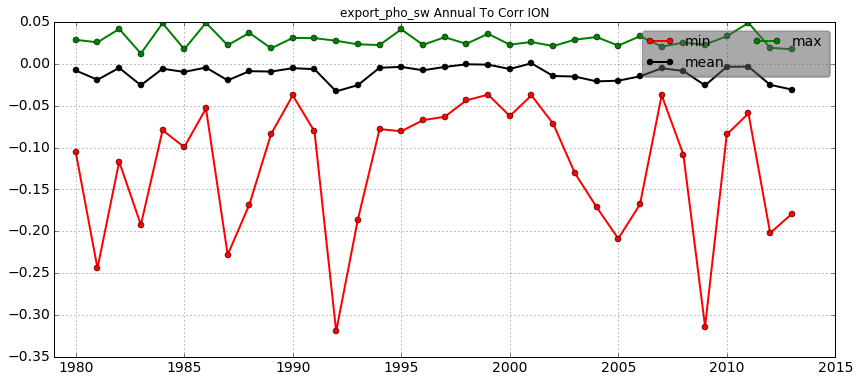

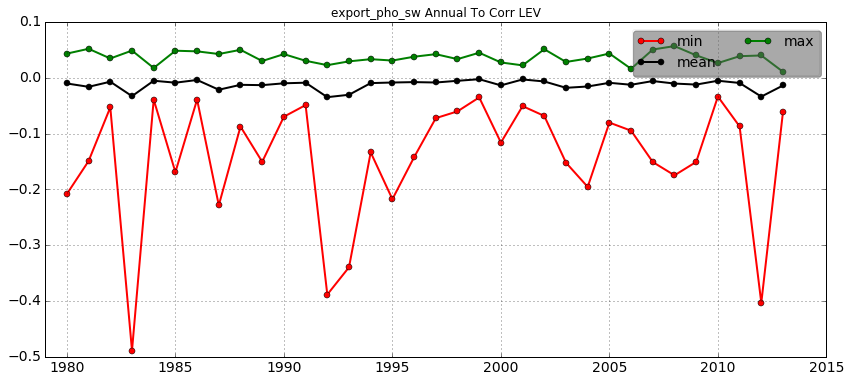

In [101]:
# All 3 series on the same fig
for var in var_list:
    for basin in region_list:
        plt.figure(figsize=(14,6))
        # figure
        plt.plot(year_list, vars()[var+'_min_'+basin], '-or', label='min', linewidth=2)
        plt.plot(year_list, vars()[var+'_mean_'+basin], '-ok', label='mean', linewidth=2)
        plt.plot(year_list, vars()[var+'_max_'+basin], '-og', label='max', linewidth=2)
        plt.grid(True)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+var+' Annual To Corr '+basin+'\')')
        plt.xlim([1979,2015])
        eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/'+var+'_ToCorr_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [41]:
### Loop on ppb netppb and org ###
# mean, then min and max
var_list = ['export_doc200', 'export_poc200']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            count = 0
            vars()[var+'_'+treatment+'_DJF_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            print var+'_'+treatment+'_DJF_'+basin

export_doc200_mean_DJF_NWE
export_doc200_mean_DJF_SWE
export_doc200_mean_DJF_ION
export_doc200_mean_DJF_LEV
export_doc200_min_DJF_NWE
export_doc200_min_DJF_SWE
export_doc200_min_DJF_ION
export_doc200_min_DJF_LEV
export_doc200_max_DJF_NWE
export_doc200_max_DJF_SWE
export_doc200_max_DJF_ION
export_doc200_max_DJF_LEV
export_poc200_mean_DJF_NWE
export_poc200_mean_DJF_SWE
export_poc200_mean_DJF_ION
export_poc200_mean_DJF_LEV
export_poc200_min_DJF_NWE
export_poc200_min_DJF_SWE
export_poc200_min_DJF_ION
export_poc200_min_DJF_LEV
export_poc200_max_DJF_NWE
export_poc200_max_DJF_SWE
export_poc200_max_DJF_ION
export_poc200_max_DJF_LEV


In [45]:
np.shape(export_doc200_new_max_LEV)
test = export_doc200_new_max_LEV

In [48]:
test.loc[test['mm']==12]['yy'] = test.loc[test['mm']==12]['yy']-1

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [49]:
test

,var,date,yy,mm
34,0.018300,1970-12-02,1970,12
35,0.025272,1970-12-07,1970,12
36,-0.097433,1970-12-12,1970,12
37,-0.084243,1970-12-17,1970,12
38,-0.043292,1970-12-22,1970,12
39,0.074324,1970-12-27,1970,12
40,0.077817,1971-01-01,1971,1
41,0.034471,1971-01-06,1971,1
42,0.033095,1971-01-11,1971,1
43,0.130976,1971-01-16,1971,1


In [28]:
### Loop on org C ###
# mean, then min and max
var_list = ['export_doc']
treat_list = ['max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #
        print treatment
        for basin in region_list:
            vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            #vars()['hf2_'+basin]['yy'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).year
            vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            count = 0
            vars()[var+'_'+treatment+'_DJF_'+basin] = np.zeros([34])
            for y in year_list:
                vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].max()[y]
                #eval('vars()[var+'_'+treatment+\'_DJF_\'+basin][count] =  vars()[var+\'_new_\'+treatment+\'_\'+basin].groupby(\'yy\')[\'var\'].'+treatment+'()[y]')

                count += 1

            # figure
            plt.figure(figsize=(14,6))
            plt.plot(year_list, vars()[var+'_'+treatment+'_DJF_'+basin], '-ok')
            plt.grid(True)
            eval('plt.title(\''+var+'_'+treatment+'_DJF_'+basin+'\')')
            plt.xlim([1979,2015])
            #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

ppb_new_mean_NWE


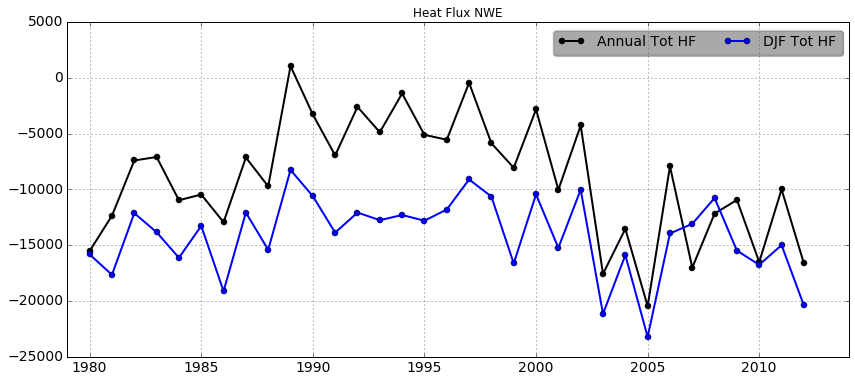

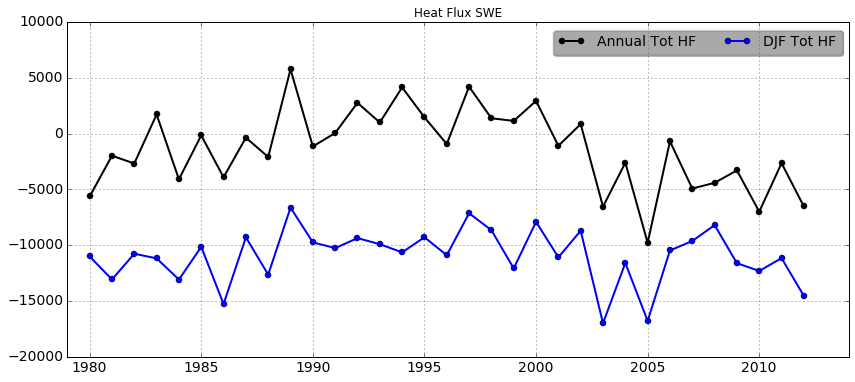

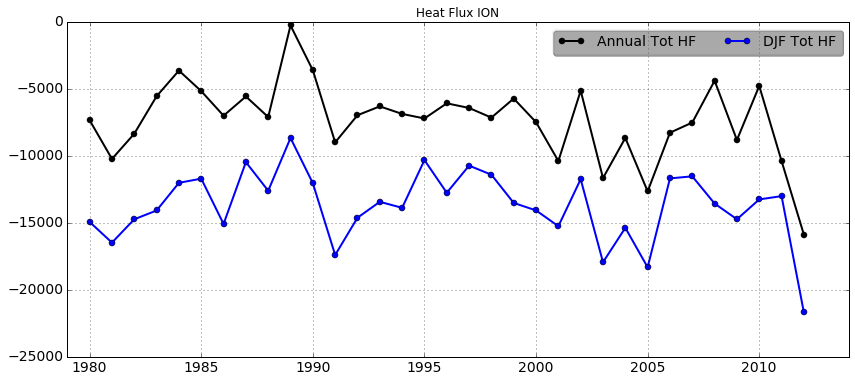

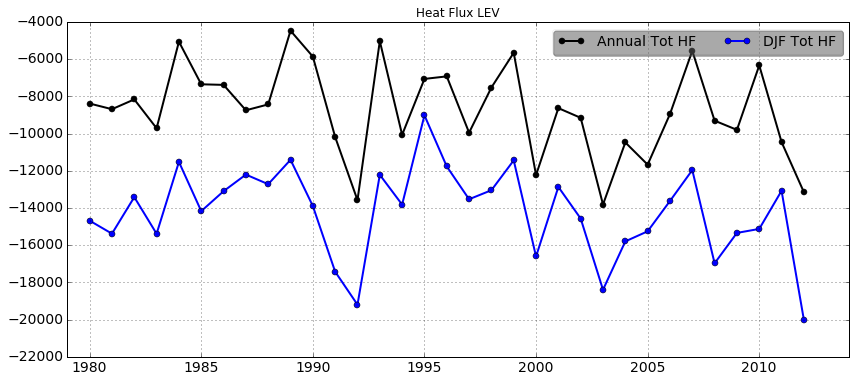

In [60]:
# Keeping only winter values
for basin in region_list:
    vars()['hf3_'+basin] = vars()['hf2_'+basin].loc[(vars()['hf2_'+basin]['mm']==1)|(vars()['hf2_'+basin]['mm']==2)|(vars()['hf2_'+basin]['mm']==12)]

# annual heat flux
year_list = np.arange(1980,2013)

for basin in region_list:
    count = 0
    test2 = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['heat_flux_'+basin].groupby('yy')['total_hf'].sum()[y]
        test2[count] =  vars()['hf3_'+basin].groupby('yy')['total_hf'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth = 2, label='Annual Tot HF')
    plt.plot(year_list, test2, '-ob', linewidth = 2, label='DJF Tot HF')
    eval('plt.title(\'Heat Flux '+basin+'\')')
    plt.xlim([1979,2014])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_Winter_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### END OF THIS PART ###

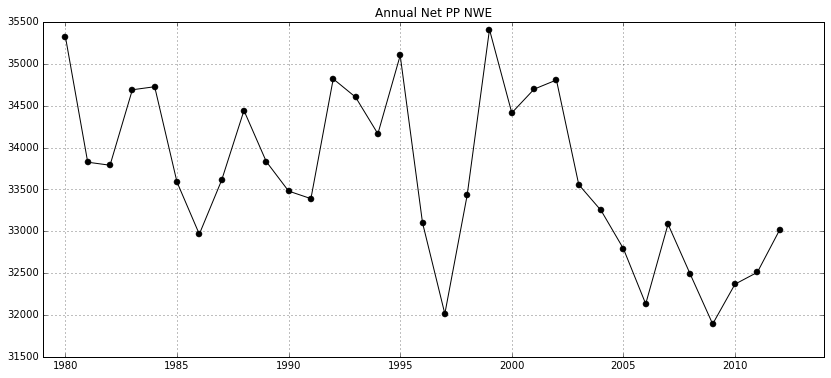

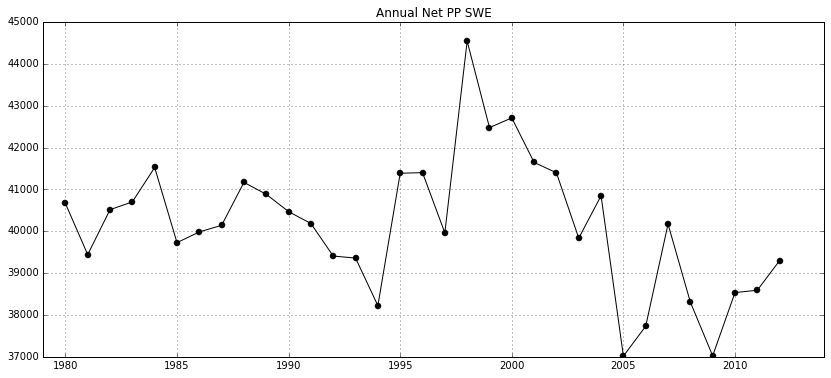

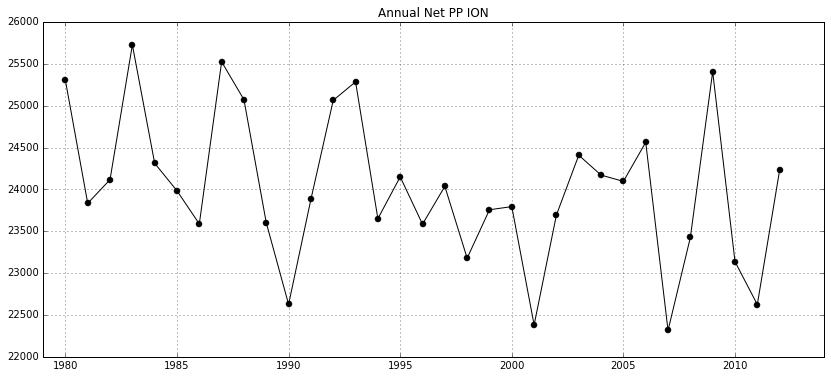

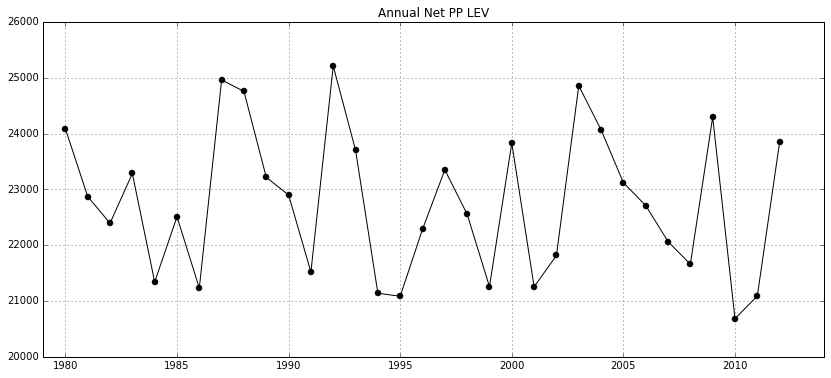

In [67]:
### BELOW: ANNUAL SUM, MIN and MAX of NetPP, GrossPP, Nut and OC EXPORTS ###
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok')
    plt.grid(True)
    eval('plt.title(\'Annual Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

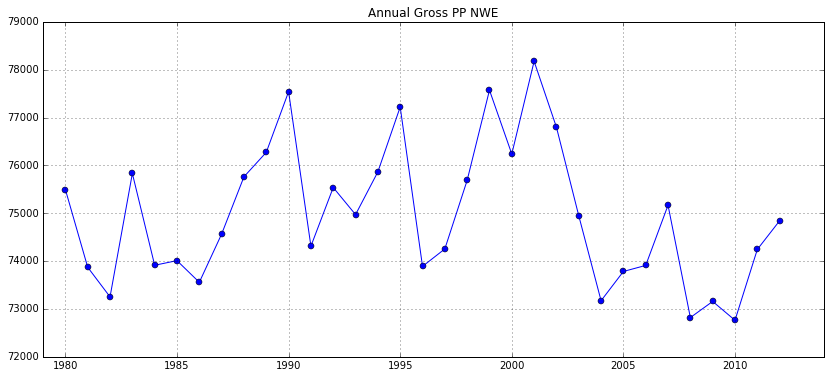

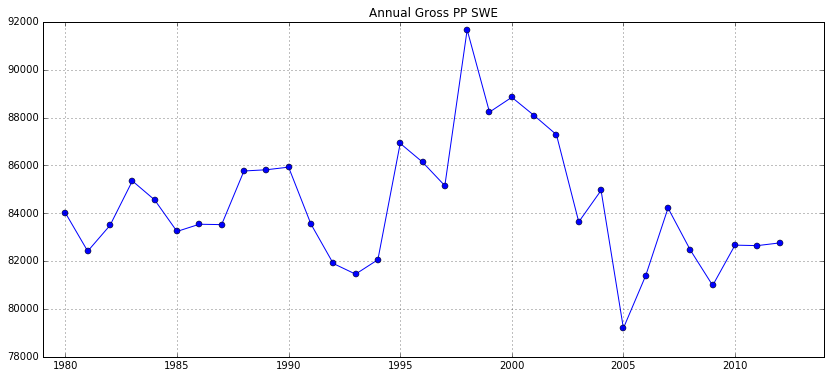

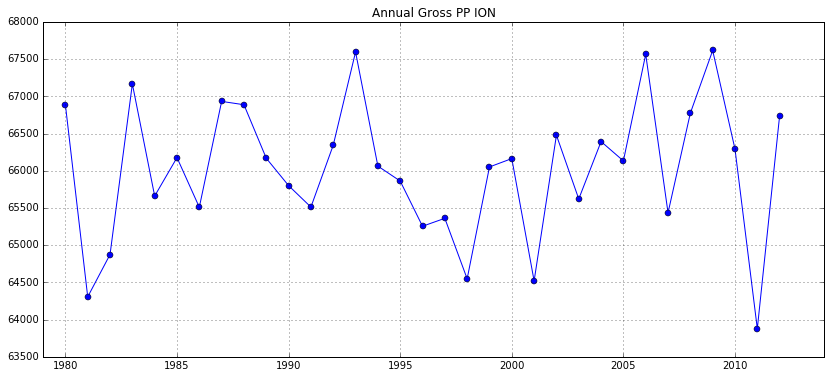

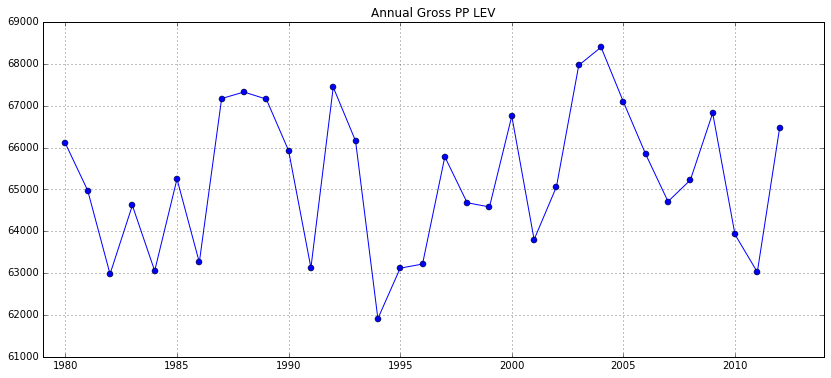

In [7]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ob')
    plt.grid(True)
    eval('plt.title(\'Annual Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

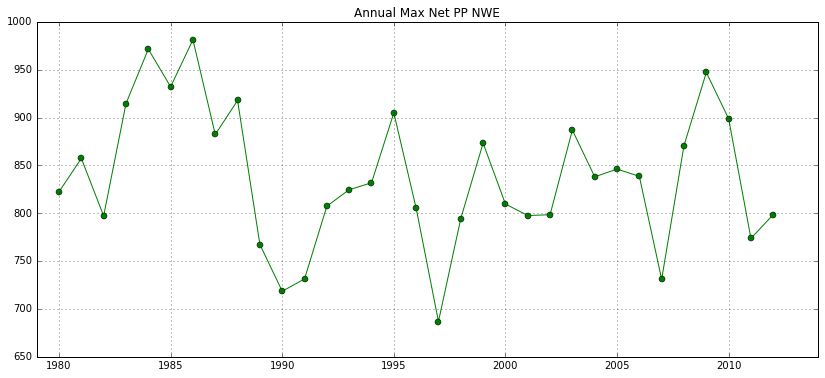

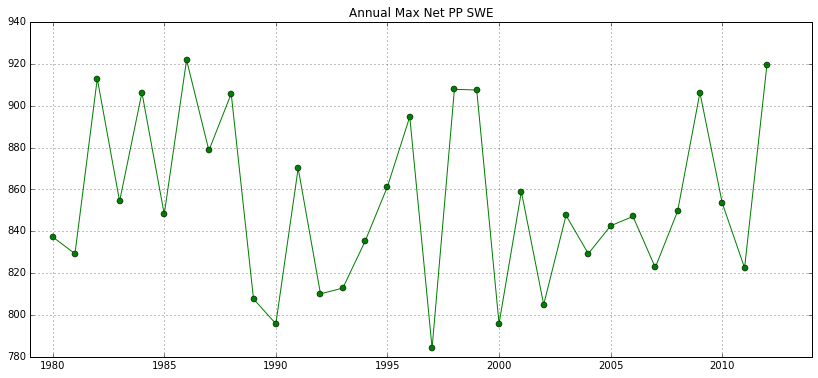

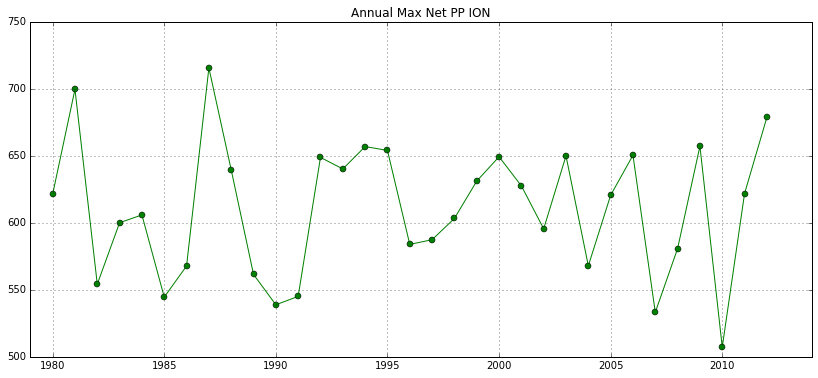

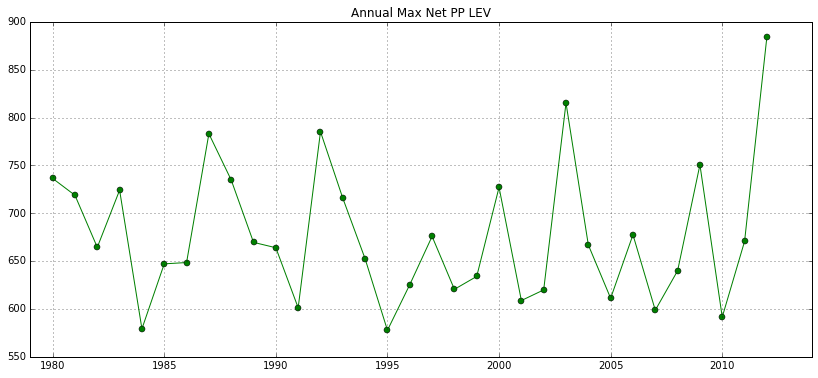

In [70]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].max()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-og')
    plt.grid(True)
    eval('plt.title(\'Annual Max Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Max_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

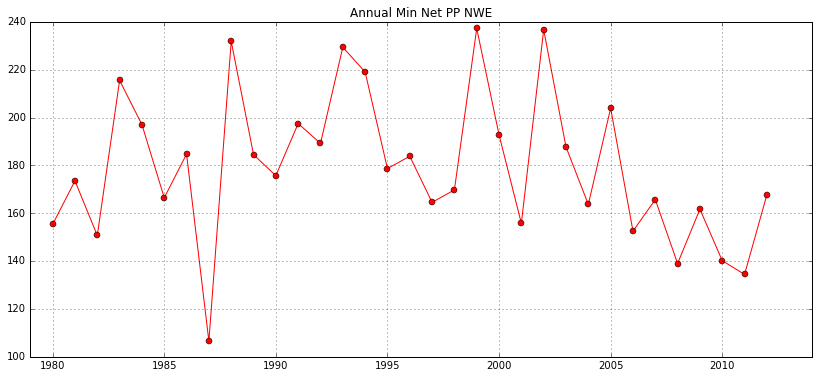

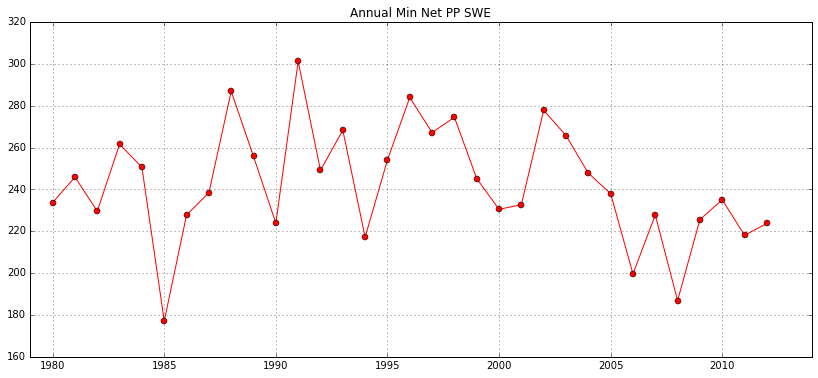

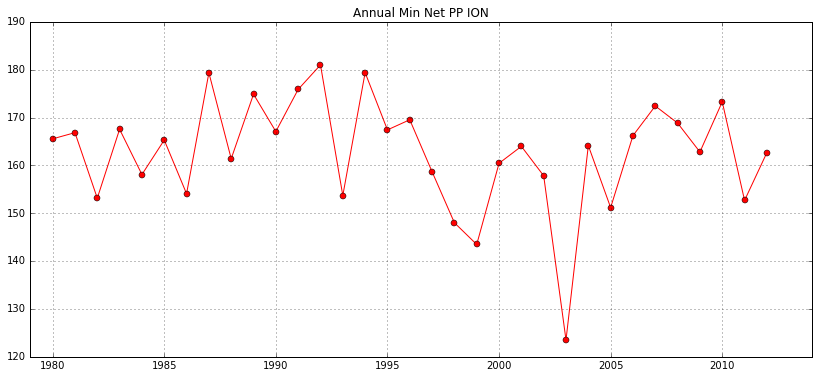

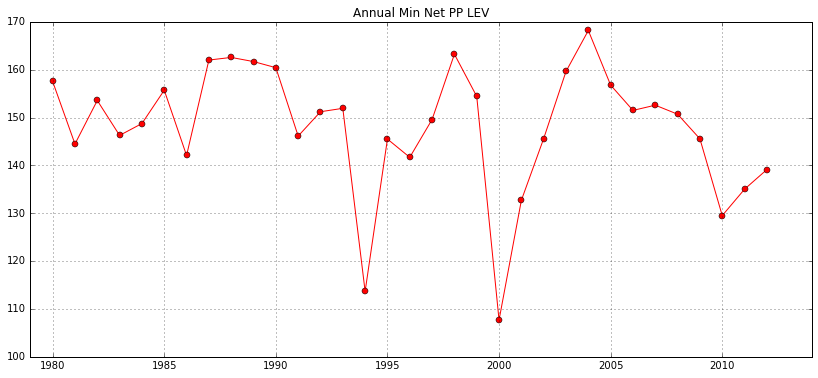

In [73]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].min()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or')
    plt.grid(True)
    eval('plt.title(\'Annual Min Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Min_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

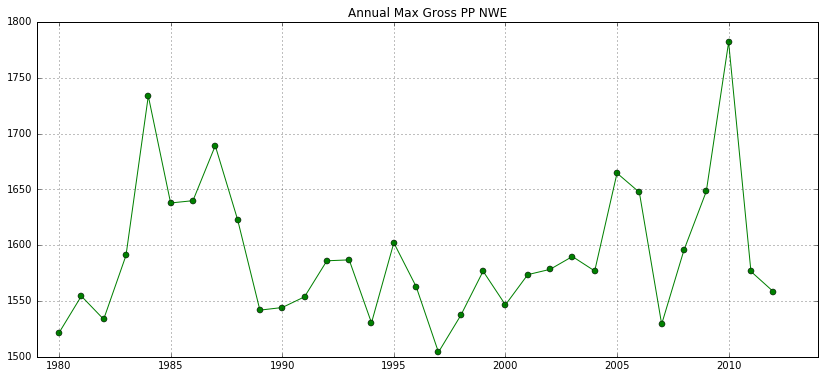

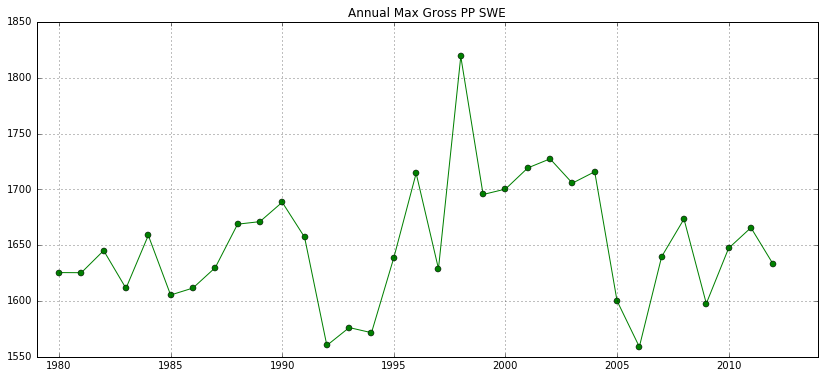

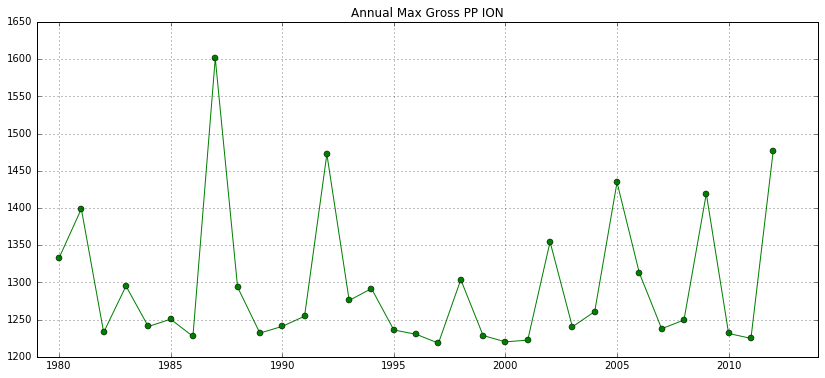

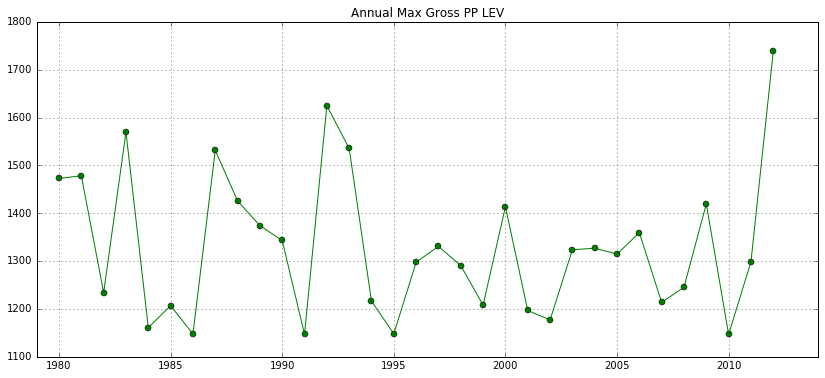

In [8]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].max()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-og')
    plt.grid(True)
    eval('plt.title(\'Annual Max Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Max_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

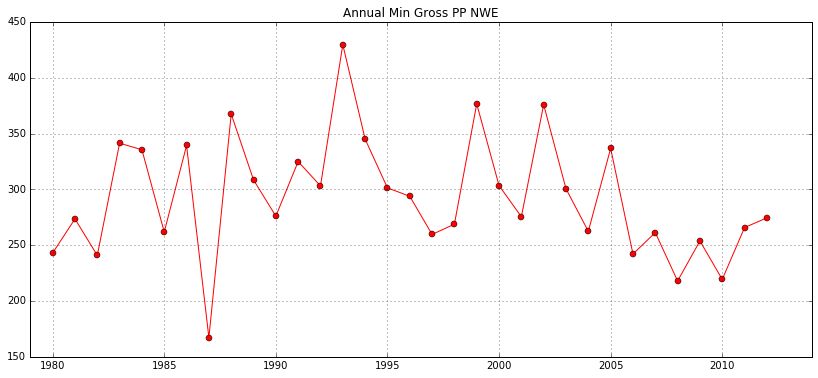

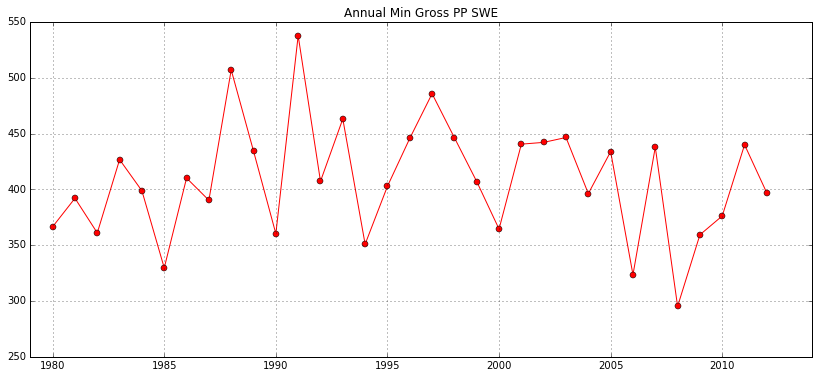

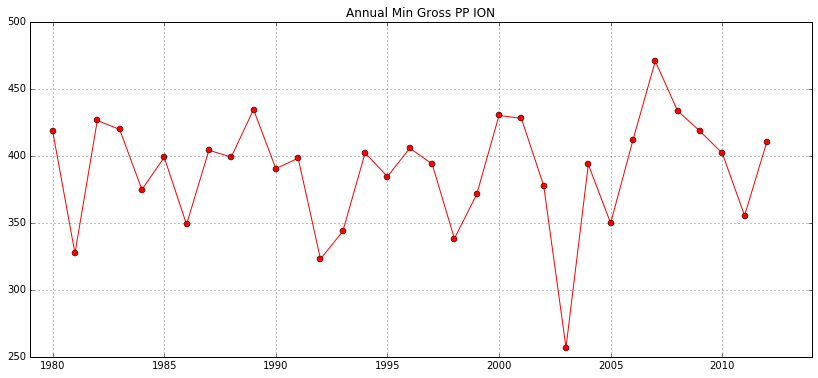

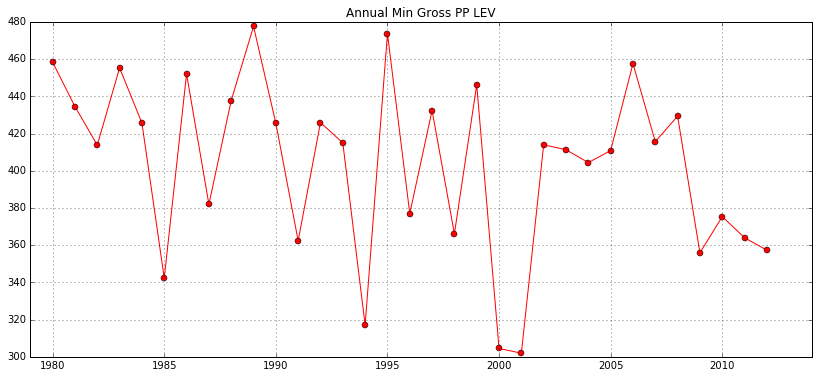

In [9]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].min()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or')
    plt.grid(True)
    eval('plt.title(\'Annual Min Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Min_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [77]:
nut_list

['ppb',
 'netppb',
 'chl_tot',
 'export_nit_sw',
 'export_pho_sw',
 'export_doc200',
 'export_poc200']

In [ ]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export DOC '+basin+'\')')
    plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_DOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

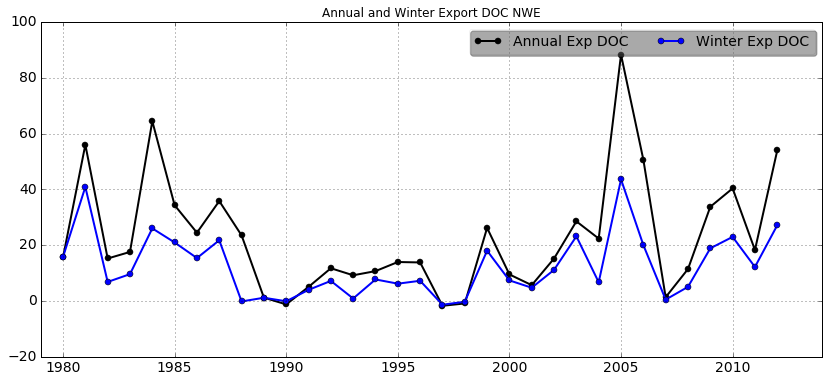

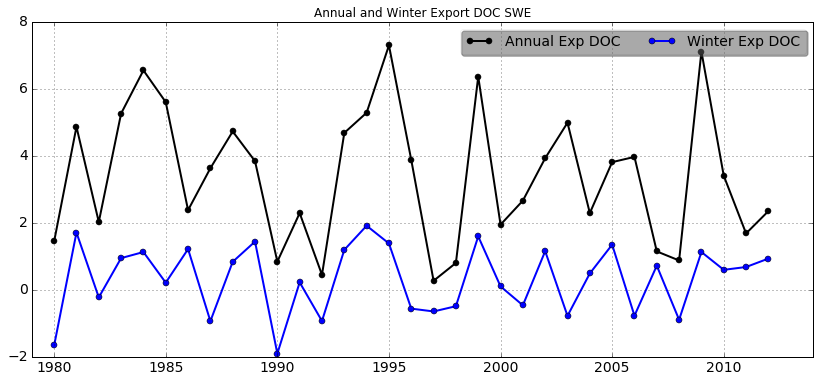

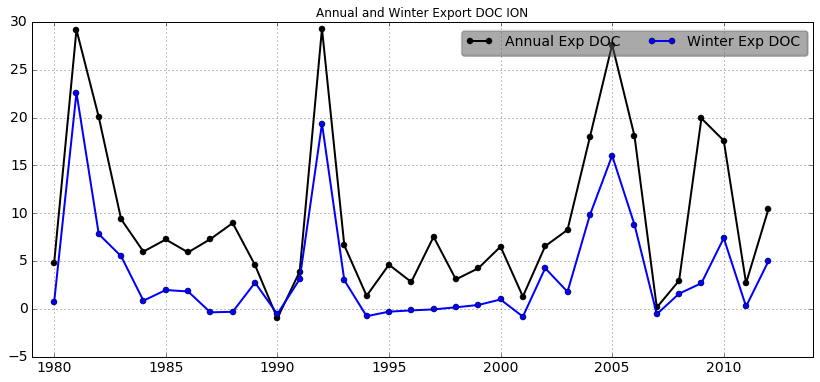

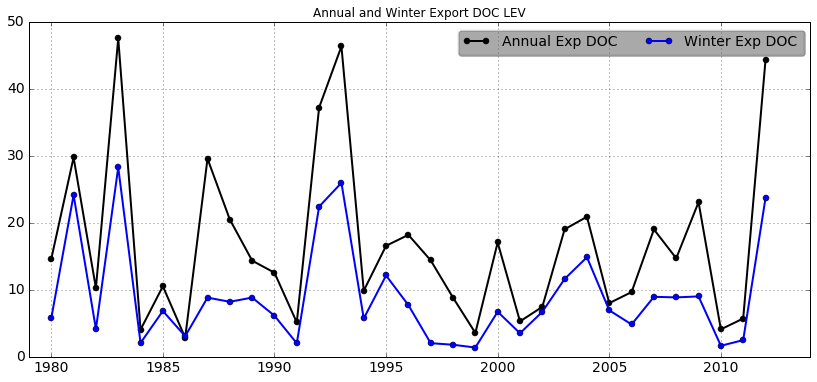

In [69]:
# annual heat flux
year_list = np.arange(1980,2013)

for basin in region_list:
    vars()['export_doc200_2D_2_'+basin] = vars()['export_doc200_2D_'+basin]
    vars()['export_doc200_2D_2_'+basin]['mm'] = pd.DatetimeIndex(vars()['export_doc200_2D_2_'+basin]['date']).month
    vars()['export_doc200_2D_2_'+basin] =  vars()['export_doc200_2D_2_'+basin].loc[(vars()['export_doc200_2D_2_'+basin]['mm']==1)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==2)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==12)]
        
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        test2[count] =  vars()['export_doc200_2D_2_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth=2, label='Annual Exp DOC')
    plt.plot(year_list, test2, '-ob', linewidth=2, label='Winter Exp DOC')
    eval('plt.title(\'Annual and Winter Export DOC '+basin+'\')')
    
    plt.xlim([1979,2014])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_Winter_ExpDOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

NWE
1
SWE
2
ION
3
LEV
4


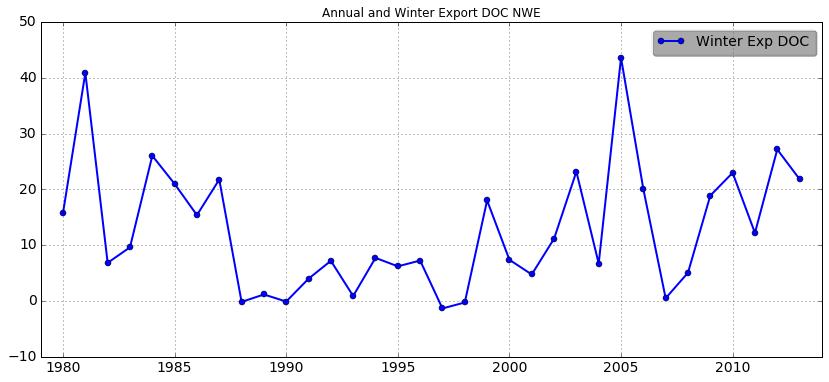

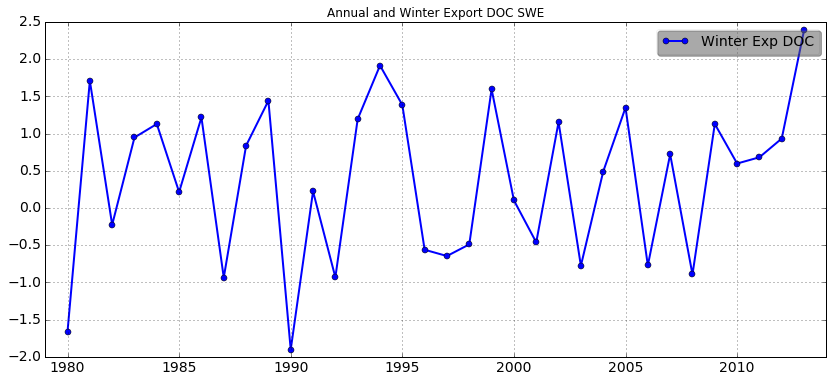

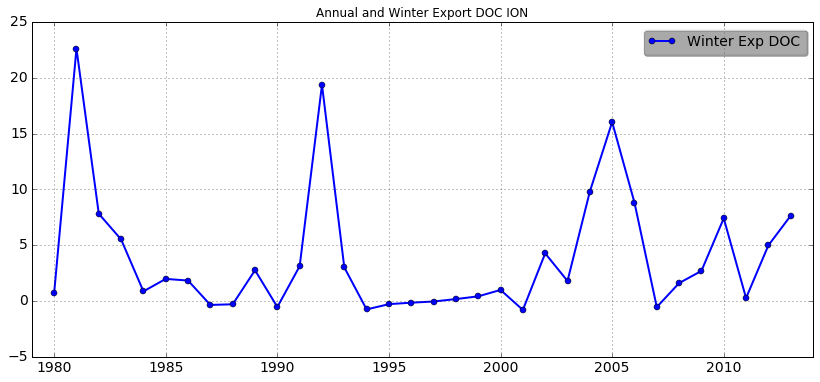

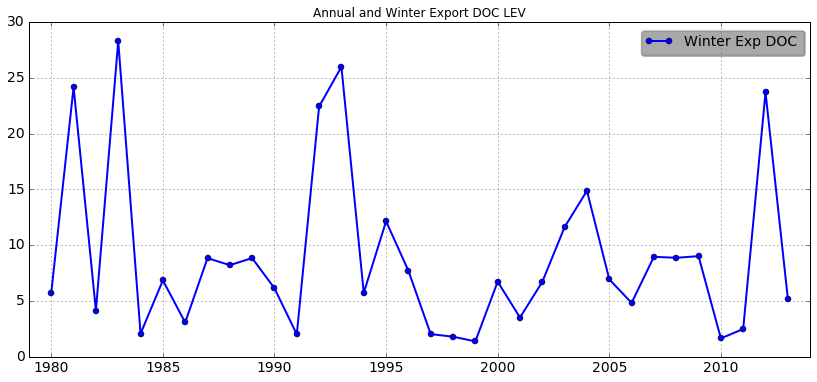

In [389]:
# Export OC
year_list = np.arange(1980,2014)

basin_count = 1
for basin in region_list:
    print basin
    print basin_count
    vars()['export_doc200_2D_2_'+basin] = vars()['export_doc200_2D_'+basin]
    vars()['export_doc200_2D_2_'+basin]['mm'] = pd.DatetimeIndex(vars()['export_doc200_2D_2_'+basin]['date']).month
    vars()['export_doc200_2D_2_'+basin] =  vars()['export_doc200_2D_2_'+basin].loc[(vars()['export_doc200_2D_2_'+basin]['mm']==1)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==2)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==12)]

    count = 0
    vars()['test_'+basin] = np.zeros([34])
    
    for y in year_list:
        vars()['test_'+basin][count] =  vars()['export_doc200_2D_2_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, vars()['test_'+basin], '-ob', linewidth=2, label='Winter Exp DOC')
    eval('plt.title(\'Annual and Winter Export DOC '+basin+'\')')
    
    plt.xlim([1979,2015])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    plt.xlim([1979,2014])

    basin_count += 1

In [ ]:
### SAVE INTO TXT FILE ### (to compute correlations in Matlab)

In [427]:
testt = np.vstack([test_NWE,test_SWE,test_ION,test_LEV])
np.shape(testt) # (4, 34)

export_doc_txt = testt.transpose()
export_doc_txt

# FINALLY
np.savetxt('export_doc_txt',export_doc_txt,delimiter=' ')  # => YES!

(4, 34)

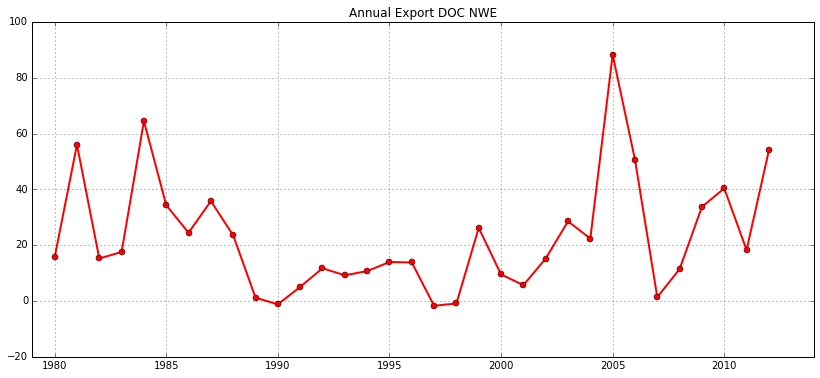

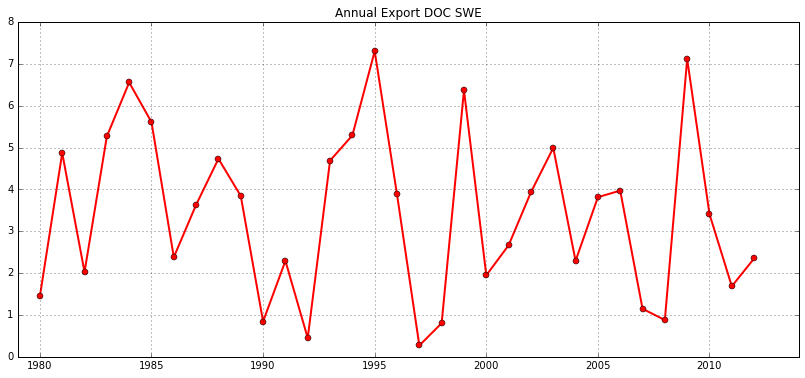

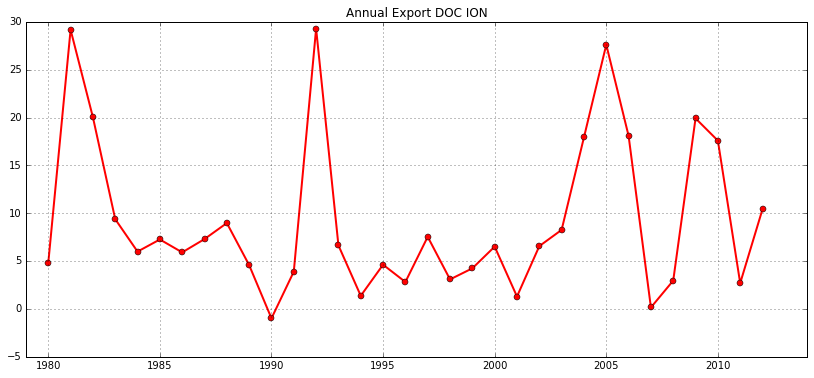

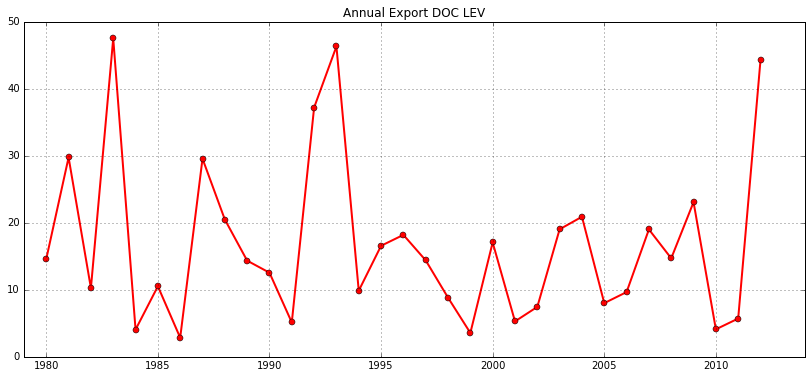

In [80]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export DOC '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_DOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

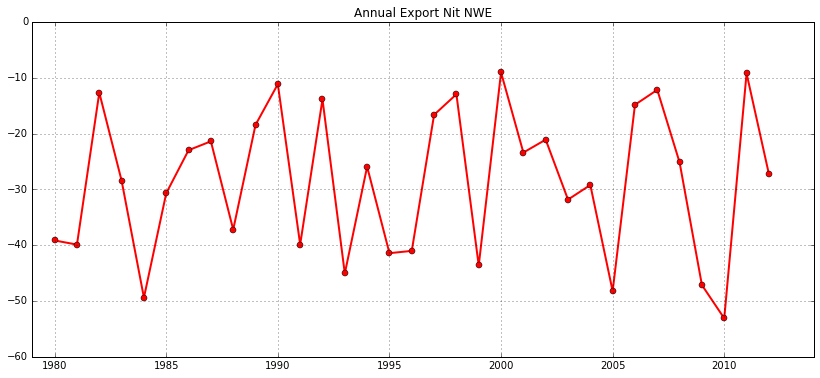

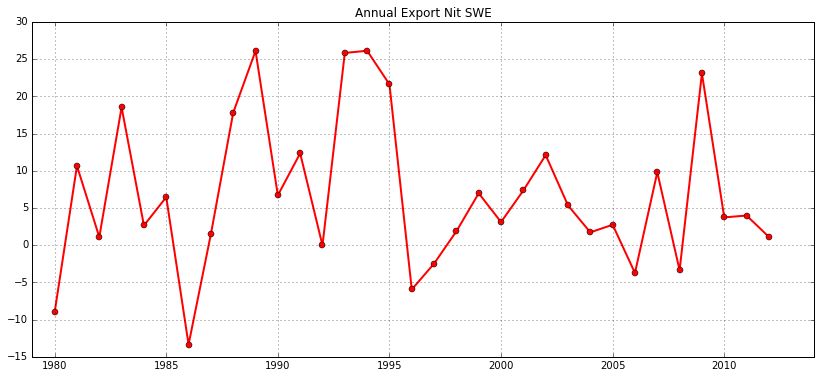

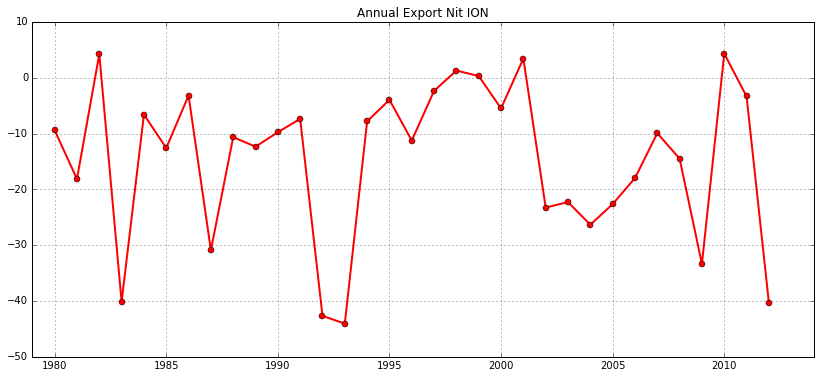

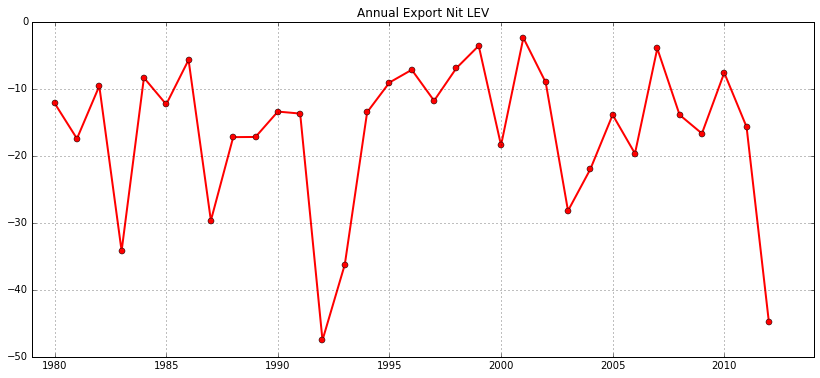

In [86]:
# Exports nut annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_nit_sw_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export Nit '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_Nit_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

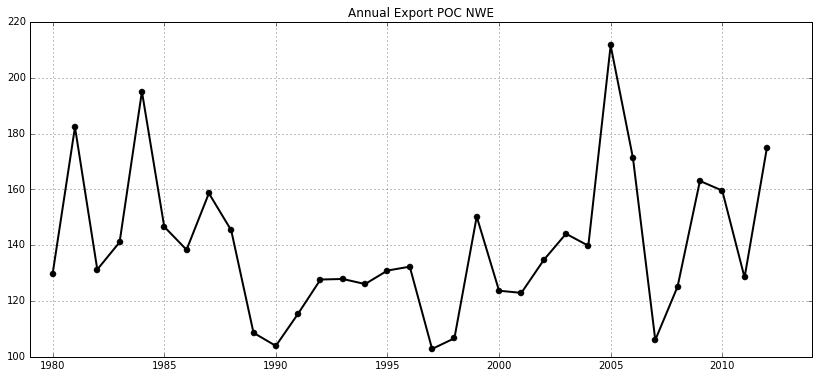

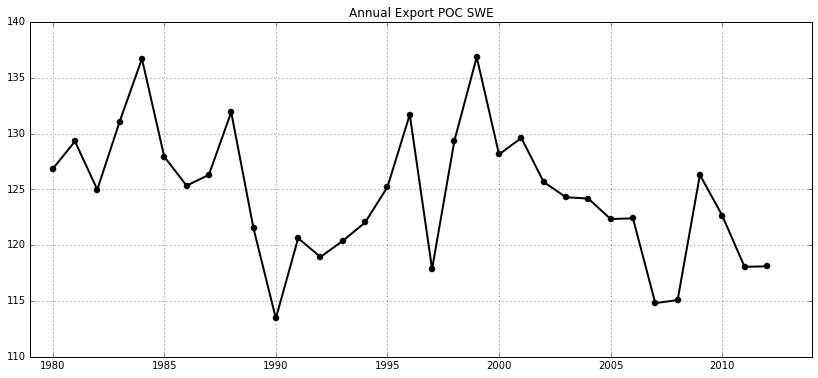

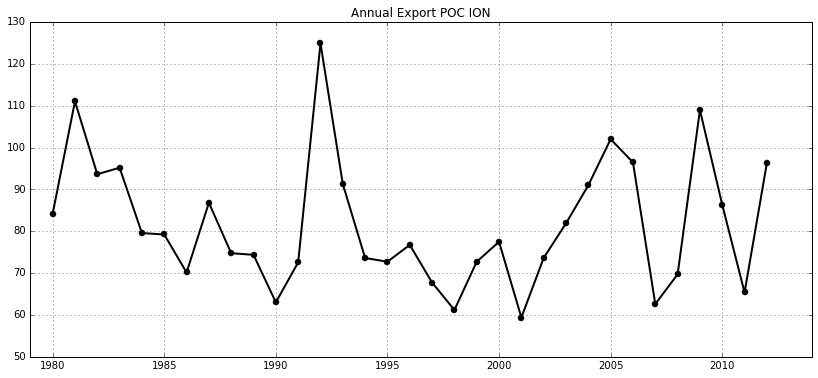

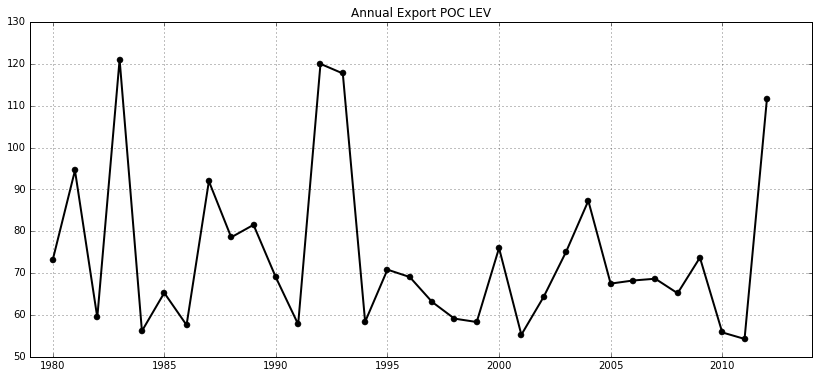

In [82]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_poc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export POC '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_POC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

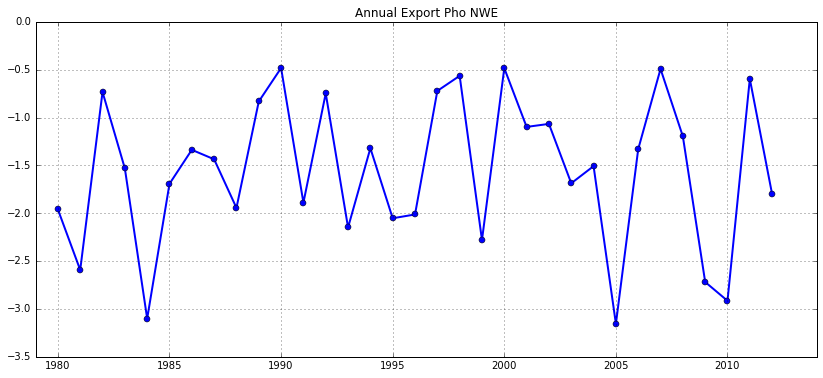

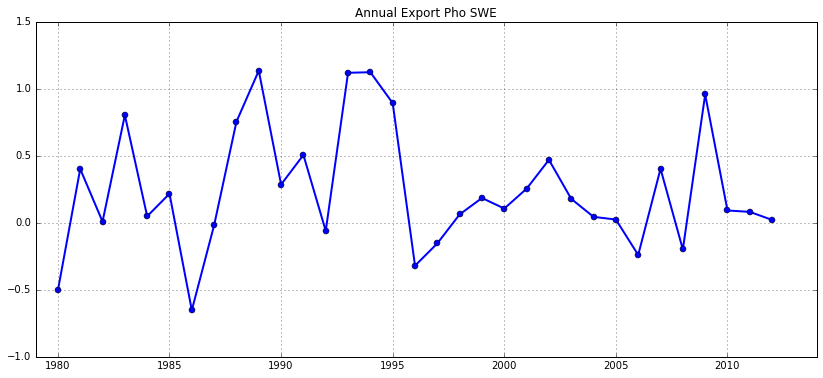

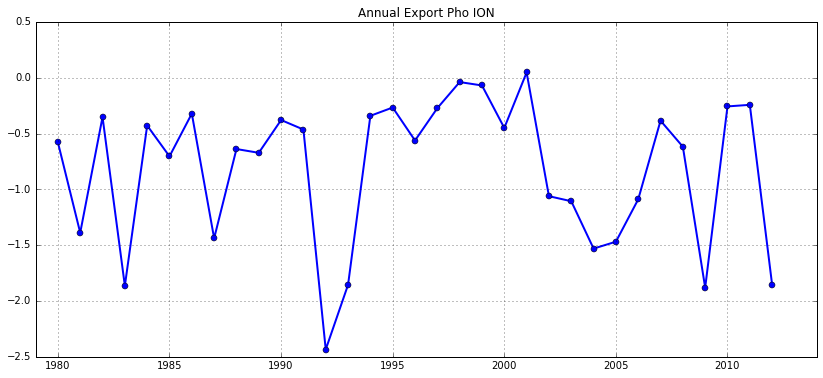

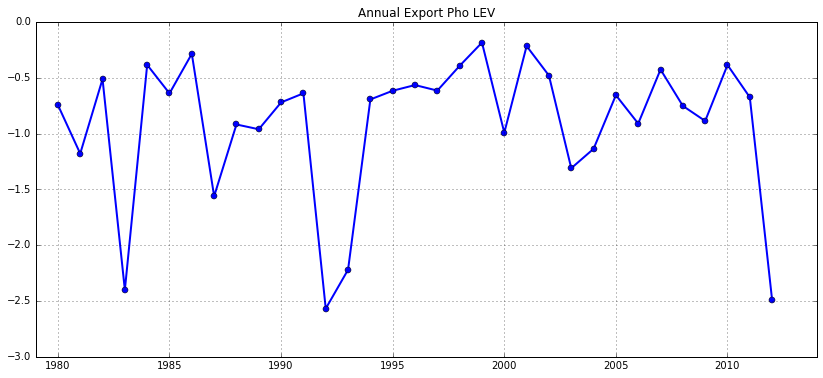

In [85]:
# Exports nut annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_pho_sw_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ob', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export Pho '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_Pho_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')